<a href="https://colab.research.google.com/github/younesA99/svm/blob/main/IMP_Article.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import cross_val_score

In [2]:
# Charger le fichier Excel
file_path = 'Concrete_Data.xls'  # Remplacez par le chemin de votre fichier
data = pd.read_excel(file_path)

# Renommer les colonnes
new_column_names = {
   'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Blast Furnace Slag (component 2)(kg in a m^3 mixture)': 'Slag (kg/m³)',
    'Fly Ash (component 3)(kg in a m^3 mixture)': 'FlyAsh (kg/m³)',
    'Water  (component 4)(kg in a m^3 mixture)': 'Water (kg/m³)',
    'Superplasticizer (component 5)(kg in a m^3 mixture)': 'Superplasticizer (kg/m³)',
    'Coarse Aggregate  (component 6)(kg in a m^3 mixture)': 'CoarseAggr (kg/m³)',
    'Fine Aggregate (component 7)(kg in a m^3 mixture)': 'FineAggr (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}

data.rename(columns=new_column_names, inplace=True)

In [3]:
data

,Cement (kg/m³),Slag (kg/m³),FlyAsh (kg/m³),Water (kg/m³),Superplasticizer (kg/m³),CoarseAggr (kg/m³),FineAggr (kg/m³),Age (day),Strength (MPa)
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.986111
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.887366
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.269535
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.052780
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.296075
...,...,...,...,...,...,...,...,...,...
1025,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28,44.284354
1026,322.2,0.0,115.6,196.0,10.4,817.9,813.4,28,31.178794
1027,148.5,139.4,108.6,192.7,6.1,892.4,780.0,28,23.696601
1028,159.1,186.7,0.0,175.6,11.3,989.6,788.9,28,32.768036


In [ ]:
# Créer une copie de la base de données
data2 = data.copy()

# Calculer les nouvelles colonnes
data2['W/C'] = data2['Water (kg/m³)'] / data2['Cement (kg/m³)']
data2['G/S'] = data2['CoarseAggr (kg/m³)'] / data2['FineAggr (kg/m³)']

# Insérer les nouvelles colonnes avant la colonne 'Strength'
strength_index = data2.columns.get_loc('Strength (MPa)')

# Réordonner les colonnes pour placer 'W/C' et 'G/S' avant 'Strength'
cols = data2.columns.tolist()
cols.insert(strength_index, cols.pop(cols.index('W/C')))
cols.insert(strength_index, cols.pop(cols.index('G/S')))

# Appliquer le nouvel ordre des colonnes à data2
data2 = data2[cols]


In [ ]:
data2

,Cement (kg/m³),Slag (kg/m³),FlyAsh (kg/m³),Water (kg/m³),Superplasticizer (kg/m³),CoarseAggr (kg/m³),FineAggr (kg/m³),Age (day),G/S,W/C,Strength (MPa)
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,1.538462,0.300000,79.986111
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,1.560651,0.300000,61.887366
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,1.569024,0.685714,40.269535
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,1.569024,0.685714,41.052780
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,1.185221,0.966767,44.296075
...,...,...,...,...,...,...,...,...,...,...,...
1025,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28,1.132500,0.649783,44.284354
1026,322.2,0.0,115.6,196.0,10.4,817.9,813.4,28,1.005532,0.608318,31.178794
1027,148.5,139.4,108.6,192.7,6.1,892.4,780.0,28,1.144103,1.297643,23.696601
1028,159.1,186.7,0.0,175.6,11.3,989.6,788.9,28,1.254405,1.103708,32.768036


# **Data_Description**

In [4]:
data.shape

(1030, 9)

In [5]:
data.dtypes

,0
Cement (kg/m³),float64
Slag (kg/m³),float64
FlyAsh (kg/m³),float64
Water (kg/m³),float64
Superplasticizer (kg/m³),float64
CoarseAggr (kg/m³),float64
FineAggr (kg/m³),float64
Age (day),int64
Strength (MPa),float64


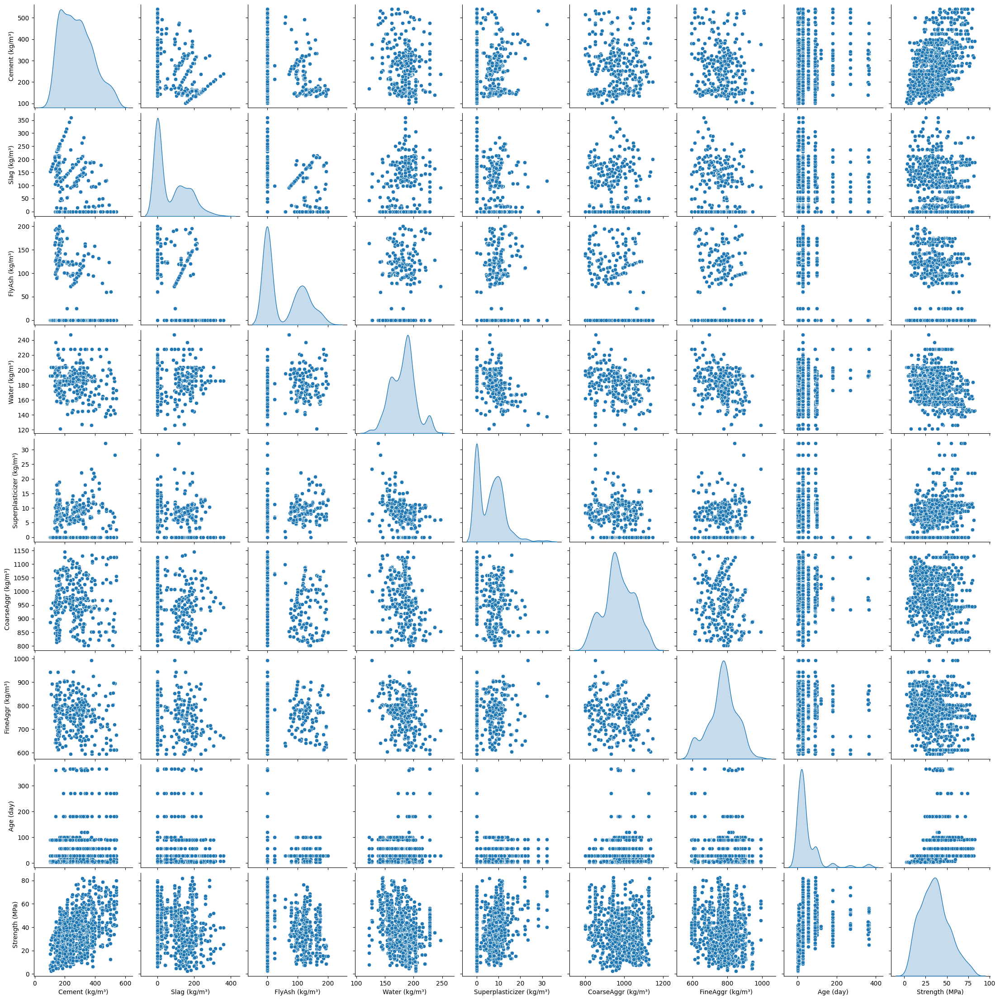

In [6]:
# pairplot.
#plot density curve instead of histogram in the diagonals

sns.pairplot(data, diag_kind='kde')

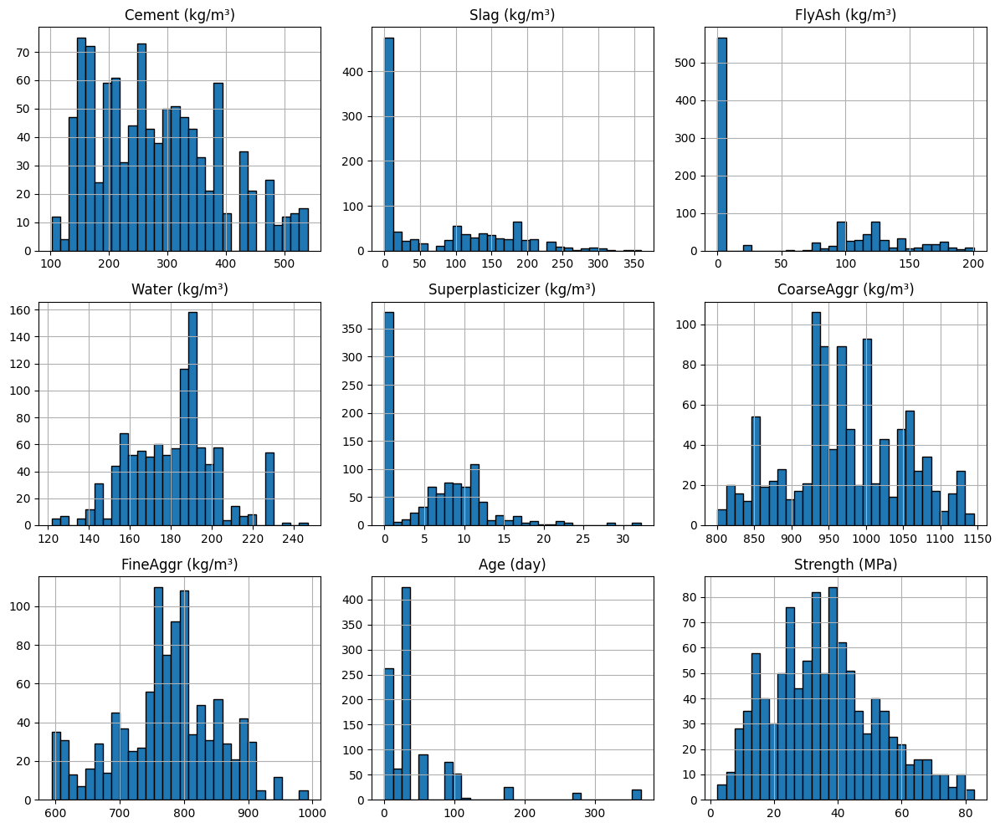

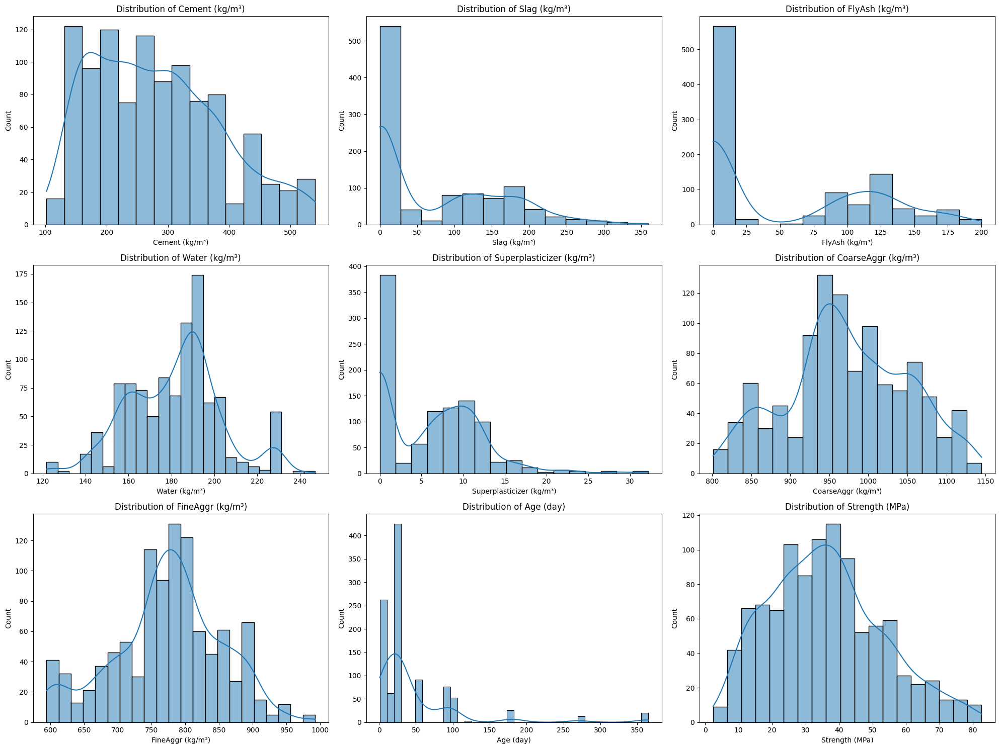

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Histogrammes
data.hist(figsize=(12, 10), bins=30, edgecolor='black')
plt.tight_layout()
plt.show()

# Visualiser la variation de chaque variable avec des histogrammes et des KDE plots
plt.figure(figsize=(20, 15))
for i, column in enumerate(data.columns, 1):
    plt.subplot(3, 3, i)
    sns.histplot(data[column], kde=True)
    plt.title(f'Distribution of {column}')
plt.tight_layout()
plt.show()


In [7]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Cement (kg/m³),1030.0,281.165631,104.507142,102.000000,192.375000,272.900000,350.000000,540.000000
Slag (kg/m³),1030.0,73.895485,86.279104,0.000000,0.000000,22.000000,142.950000,359.400000
FlyAsh (kg/m³),1030.0,54.187136,63.996469,0.000000,0.000000,0.000000,118.270000,200.100000
Water (kg/m³),1030.0,181.566359,21.355567,121.750000,164.900000,185.000000,192.000000,247.000000
Superplasticizer (kg/m³),1030.0,6.203112,5.973492,0.000000,0.000000,6.350000,10.160000,32.200000
CoarseAggr (kg/m³),1030.0,972.918592,77.753818,801.000000,932.000000,968.000000,1029.400000,1145.000000
FineAggr (kg/m³),1030.0,773.578883,80.175427,594.000000,730.950000,779.510000,824.000000,992.600000
Age (day),1030.0,45.662136,63.169912,1.000000,7.000000,28.000000,56.000000,365.000000
Strength (MPa),1030.0,35.817836,16.705679,2.331808,23.707115,34.442774,46.136287,82.599225


In [ ]:
plt.figure(figsize=(35,15))

sns.heatmap(data.corr(),vmax=1, square=True, annot=True, cmap='viridis')
plt.title('Correlation between different attributes')
plt.show()

ValueError: could not convert string to float: '>50'

<Figure size 3500x1500 with 0 Axes>

In [ ]:
#Checking for missing values

data.isnull().sum()

,0
Cement (kg/m³),0
Slag (kg/m³),0
FlyAsh (kg/m³),0
Water (kg/m³),0
Superplasticizer (kg/m³),0
CoarseAggr (kg/m³),0
FineAggr (kg/m³),0
Age (day),0
Strength (MPa),0


Checking outliers
1. Box Plot
2. Z-Score Method
3. IQR Method


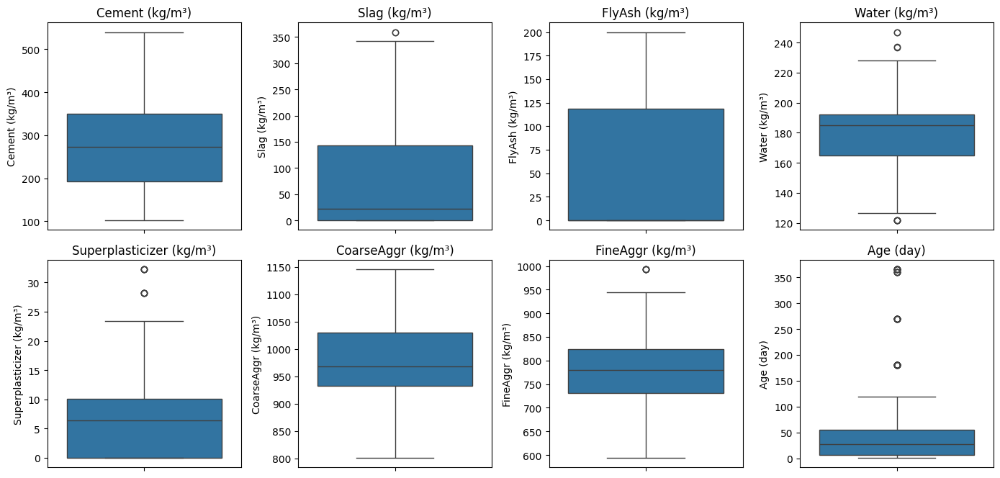

In [ ]:
#1. Box Plot
# Plot box plots for each feature
plt.figure(figsize=(14, 10))
for i, column in enumerate(data.columns[:-1]):  # Exclude the target column 'Strength (MPa)'
    plt.subplot(3, 4, i + 1)  # Adjust the number of rows and columns based on the number of features
    sns.boxplot(y=data[column])
    plt.title(column)

plt.tight_layout()
plt.show()


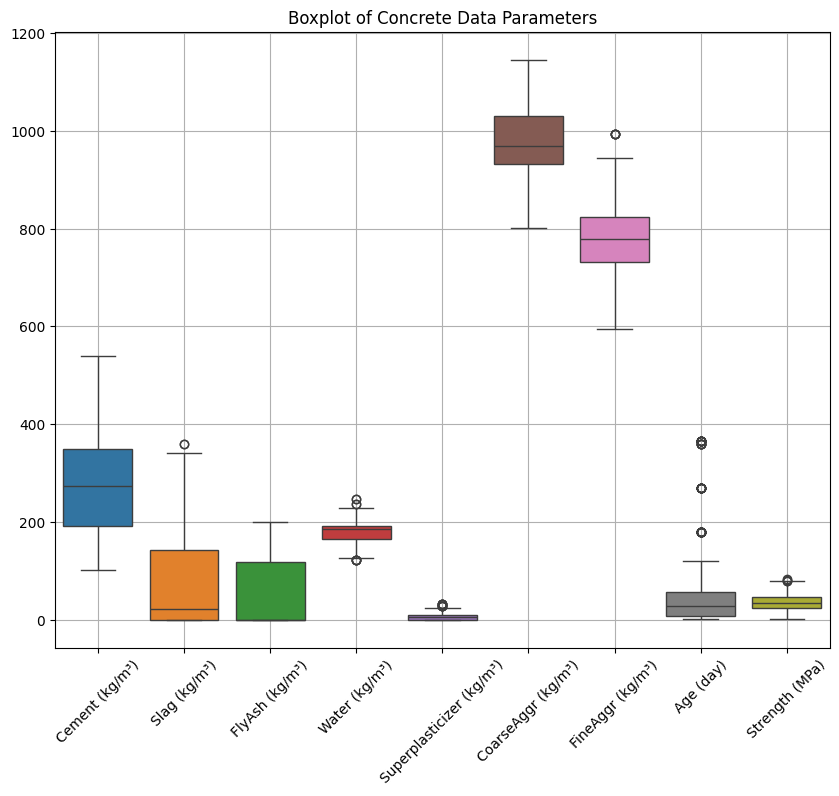

In [ ]:
# Sélectionner les colonnes pour le boxplot
columns_to_plot = ['Cement (kg/m³)', 'Slag (kg/m³)', 'FlyAsh (kg/m³)', 'Water (kg/m³)',
                   'Superplasticizer (kg/m³)', 'CoarseAggr (kg/m³)', 'FineAggr (kg/m³)',
                   'Age (day)', 'Strength (MPa)',]

# Tracer le boxplot
plt.figure(figsize=(10, 8))
sns.boxplot(data=data[columns_to_plot])
plt.xticks(rotation=45)
plt.title('Boxplot of Concrete Data Parameters')
plt.grid(True)
plt.show()

In [ ]:
from scipy import stats
#2.Z-Score Method

# Calculer les Z-scores
z_scores = np.abs(stats.zscore(data.drop(columns='Strength (MPa)')))  # Exclure la colonne cible

# Définir un seuil pour identifier les outliers
threshold = 3

# Identifier les outliers pour chaque caractéristique
outliers = (z_scores > threshold).astype(int)  # Convertir en entier pour faciliter le comptage

# Compter le nombre d'outliers pour chaque caractéristique
outliers_count = np.sum(outliers, axis=0)

# Afficher le nombre d'outliers pour chaque caractéristique
for column, count in zip(data.columns[:-1], outliers_count):  # Exclure la colonne cible
    print(f"{column}: {count} outliers")



Cement (kg/m³): 0 outliers
Slag (kg/m³): 4 outliers
FlyAsh (kg/m³): 0 outliers
Water (kg/m³): 2 outliers
Superplasticizer (kg/m³): 10 outliers
CoarseAggr (kg/m³): 0 outliers
FineAggr (kg/m³): 0 outliers
Age (day): 33 outliers


In [ ]:
#3. IQR Method
# Calculer l'IQR pour chaque caractéristique
Q1 = data.drop(columns='Strength (MPa)').quantile(0.25)
Q3 = data.drop(columns='Strength (MPa)').quantile(0.75)
IQR = Q3 - Q1

# Définir les bornes pour les outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identifier les outliers pour chaque caractéristique
outliers = ((data.drop(columns='Strength (MPa)') < lower_bound) | (data.drop(columns='Strength (MPa)') > upper_bound))

# Compter le nombre d'outliers pour chaque caractéristique
outliers_count = outliers.sum()

# Afficher le nombre d'outliers pour chaque caractéristique
for column, count in outliers_count.items():
    print(f"{column}: {count} outliers")



Cement (kg/m³): 0 outliers
Slag (kg/m³): 2 outliers
FlyAsh (kg/m³): 0 outliers
Water (kg/m³): 9 outliers
Superplasticizer (kg/m³): 10 outliers
CoarseAggr (kg/m³): 0 outliers
FineAggr (kg/m³): 5 outliers
Age (day): 59 outliers


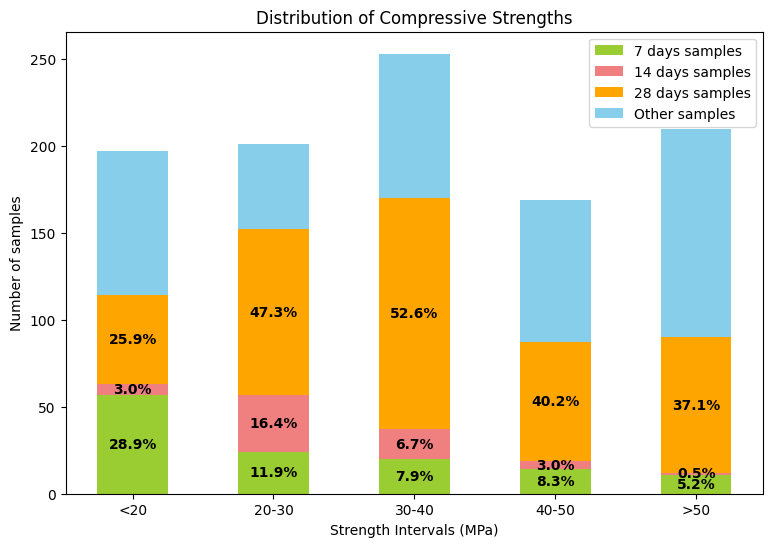

In [ ]:
# Définir les intervalles de résistance
bins = [0, 20, 30, 40, 50, float('inf')]

# Calculer l'histogramme des échantillons par intervalle de résistance
data['Strength Interval'] = pd.cut(data['Strength (MPa)'], bins=bins, labels=['<20', '20-30', '30-40', '40-50', '>50'])

# Calculer le nombre d'échantillons pour chaque intervalle
interval_counts = data['Strength Interval'].value_counts().sort_index()

# Calculer le nombre d'échantillons de 7 jours, 14 jours, et 28 jours pour chaque intervalle
age_7_counts = data[data['Age (day)'] == 7]['Strength Interval'].value_counts().sort_index()
age_14_counts = data[data['Age (day)'] == 14]['Strength Interval'].value_counts().sort_index()
age_28_counts = data[data['Age (day)'] == 28]['Strength Interval'].value_counts().sort_index()

# Calculer le nombre d'échantillons autres que 7 jours, 14 jours et 28 jours pour chaque intervalle
other_counts = interval_counts - age_7_counts - age_14_counts - age_28_counts

# Tracer l'histogramme empilé
fig, ax = plt.subplots(figsize=(9, 6))

bar_width = 0.5

# Barres pour les échantillons de 7 jours
bar1 = ax.bar(interval_counts.index, age_7_counts, bar_width, label='7 days samples', color='yellowgreen')

# Barres pour les échantillons de 14 jours
bar2 = ax.bar(interval_counts.index, age_14_counts, bar_width, bottom=age_7_counts, label='14 days samples', color='lightcoral')

# Barres pour les échantillons de 28 jours
bar3 = ax.bar(interval_counts.index, age_28_counts, bar_width, bottom=age_7_counts + age_14_counts, label='28 days samples', color='orange')

# Barres pour les autres échantillons
bar4 = ax.bar(interval_counts.index, other_counts, bar_width, bottom=age_7_counts + age_14_counts + age_28_counts, label='Other samples', color='skyblue')

ax.set_xlabel('Strength Intervals (MPa)')
ax.set_ylabel('Number of samples')
ax.set_title('Distribution of Compressive Strengths')
ax.legend()

# Ajouter les annotations pour les pourcentages d'échantillons de 7, 14, et 28 jours
for i, (count_7, count_14, count_28, total_count) in enumerate(zip(age_7_counts, age_14_counts, age_28_counts, interval_counts)):
    if total_count > 0:
        percentage_7 = (count_7 / total_count) * 100
        percentage_14 = (count_14 / total_count) * 100
        percentage_28 = (count_28 / total_count) * 100
        ax.text(i, count_7 / 2, f'{percentage_7:.1f}%', ha='center', va='center', color='black', fontweight='bold')
        ax.text(i, count_7 + count_14 / 2, f'{percentage_14:.1f}%', ha='center', va='center', color='black', fontweight='bold')
        ax.text(i, count_7 + count_14 + count_28 / 2, f'{percentage_28:.1f}%', ha='center', va='center', color='black', fontweight='bold')

plt.show()

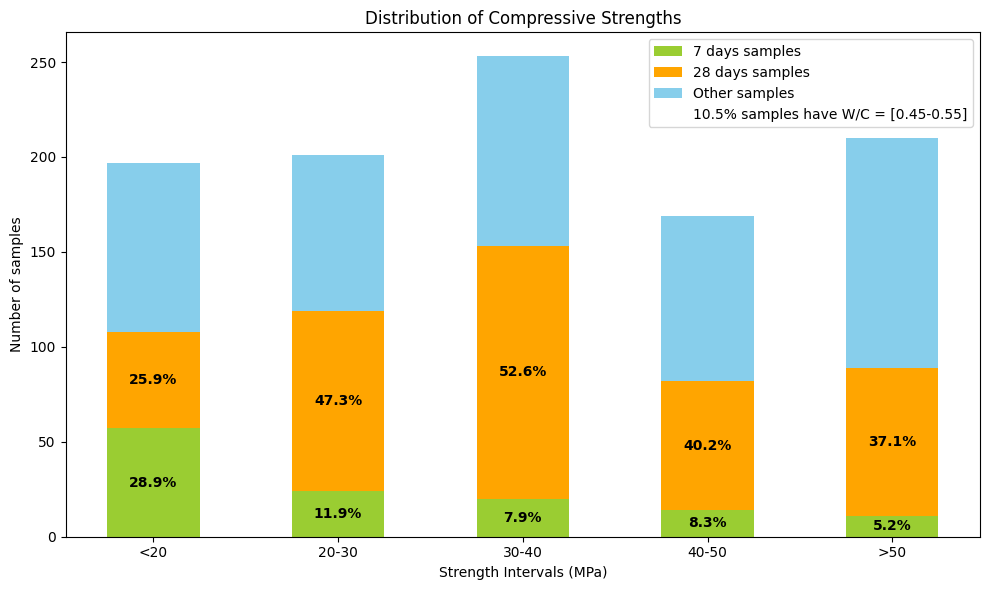

In [ ]:
# Calculer le rapport eau/ciment
data2['Water/Cement Ratio'] = data2['Water (kg/m³)'] / data2['Cement (kg/m³)']

# Définir les intervalles de résistance
bins = [0, 20, 30, 40, 50, float('inf')]

# Calculer l'histogramme des échantillons par intervalle de résistance
data2['Strength Interval'] = pd.cut(data2['Strength (MPa)'], bins=bins, labels=['<20', '20-30', '30-40', '40-50', '>50'])

# Calculer le nombre d'échantillons pour chaque intervalle
interval_counts = data2['Strength Interval'].value_counts().sort_index()

# Calculer le nombre d'échantillons de 7 jours et 28 jours pour chaque intervalle
age_7_counts = data2[data2['Age (day)'] == 7]['Strength Interval'].value_counts().sort_index()
age_28_counts = data2[data2['Age (day)'] == 28]['Strength Interval'].value_counts().sort_index()

# Calculer le nombre d'échantillons autres que 7 jours et 28 jours pour chaque intervalle
other_counts = interval_counts - age_7_counts - age_28_counts

# Calculer le pourcentage des échantillons avec un rapport eau-ciment entre 0,45 et 0,55 pour chaque intervalle
ratio_filtered = data2[(data2['Water/Cement Ratio'] >= 0.45) & (data2['Water/Cement Ratio'] <= 0.55)]
ratio_counts = ratio_filtered['Strength Interval'].value_counts().reindex(interval_counts.index, fill_value=0)

# Calculer le pourcentage global des échantillons avec un rapport eau-ciment entre 0,45 et 0,55
total_samples = len(data2)
filtered_samples = len(ratio_filtered)
percentage_ratio_global = (filtered_samples / total_samples) * 100

# Tracer l'histogramme empilé
fig, ax = plt.subplots(figsize=(10, 6))

bar_width = 0.5

# Barres pour les échantillons de 7 jours
bar1 = ax.bar(interval_counts.index, age_7_counts, bar_width, label='7 days samples', color='yellowgreen')

# Barres pour les échantillons de 28 jours
bar2 = ax.bar(interval_counts.index, age_28_counts, bar_width, bottom=age_7_counts, label='28 days samples', color='orange')

# Barres pour les autres échantillons
bar3 = ax.bar(interval_counts.index, other_counts, bar_width, bottom=age_7_counts + age_28_counts, label='Other samples', color='skyblue')

ax.set_xlabel('Strength Intervals (MPa)')
ax.set_ylabel('Number of samples')
ax.set_title('Distribution of Compressive Strengths')

# Créer la légende avec le texte pour le pourcentage des échantillons avec un rapport eau-ciment entre 0,45 et 0,55
handles, labels = ax.get_legend_handles_labels()
handles.append(plt.Line2D([0], [0], color='none'))
labels.append(f'{percentage_ratio_global:.1f}% samples have W/C = [0.45-0.55]')

ax.legend(handles, labels)

# Ajouter les annotations pour les pourcentages d'échantillons de 7 et 28 jours
for i, (count_7, count_28, total_count) in enumerate(zip(age_7_counts, age_28_counts, interval_counts)):
    if total_count > 0:
        percentage_7 = (count_7 / total_count) * 100
        percentage_28 = (count_28 / total_count) * 100

        ax.text(i, count_7 / 2, f'{percentage_7:.1f}%', ha='center', va='center', color='black', fontweight='bold')
        ax.text(i, count_7 + count_28 / 2, f'{percentage_28:.1f}%', ha='center', va='center', color='black', fontweight='bold')

plt.tight_layout()
plt.show()

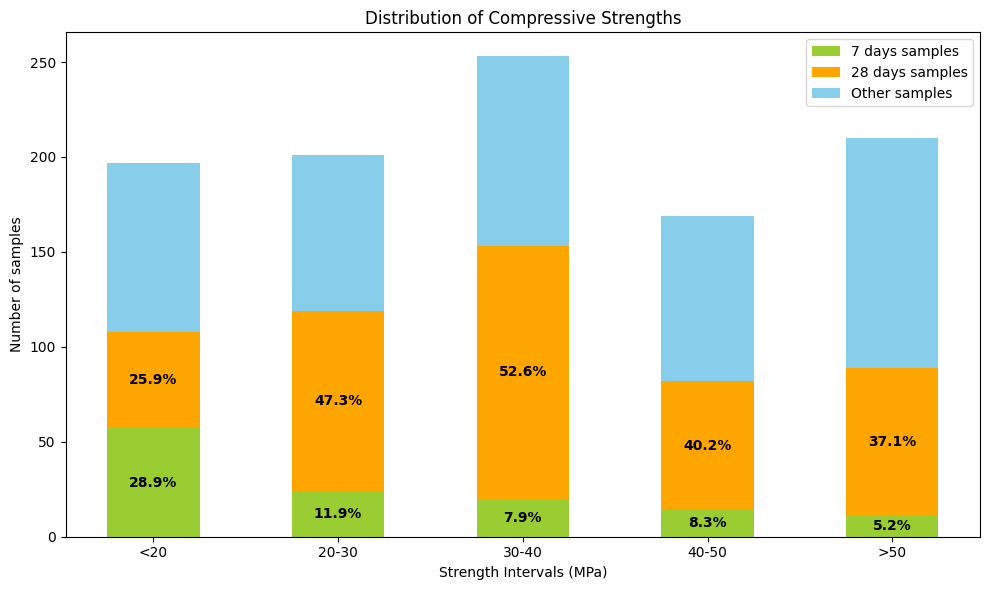

In [ ]:
import matplotlib.pyplot as plt

# Tracer l'histogramme empilé
fig, ax = plt.subplots(figsize=(10, 6))

bar_width = 0.5

# Barres pour les échantillons de 7 jours
bar1 = ax.bar(interval_counts.index, age_7_counts, bar_width, label='7 days samples', color='yellowgreen')

# Barres pour les échantillons de 28 jours
bar2 = ax.bar(interval_counts.index, age_28_counts, bar_width, bottom=age_7_counts, label='28 days samples', color='orange')

# Barres pour les autres échantillons
bar3 = ax.bar(interval_counts.index, other_counts, bar_width, bottom=age_7_counts + age_28_counts, label='Other samples', color='skyblue')

ax.set_xlabel('Strength Intervals (MPa)')
ax.set_ylabel('Number of samples')
ax.set_title('Distribution of Compressive Strengths')

# Créer la légende sans le texte pour le pourcentage des échantillons
ax.legend()

# Ajouter le texte pour le pourcentage des échantillons avec un rapport eau-ciment entre 0,45 et 0,55
#ax.text(0.95, 0.95, f'{percentage_ratio_global:.1f}% samples have W/C = [0.45-0.55]',
 #       ha='right', va='top', transform=ax.transAxes, fontsize=12, bbox=dict(facecolor='white', edgecolor='black'))

# Ajouter les annotations pour les pourcentages d'échantillons de 7 et 28 jours
for i, (count_7, count_28, total_count) in enumerate(zip(age_7_counts, age_28_counts, interval_counts)):
    if total_count > 0:
        percentage_7 = (count_7 / total_count) * 100
        percentage_28 = (count_28 / total_count) * 100

        ax.text(i, count_7 / 2, f'{percentage_7:.1f}%', ha='center', va='center', color='black', fontweight='bold')
        ax.text(i, count_7 + count_28 / 2, f'{percentage_28:.1f}%', ha='center', va='center', color='black', fontweight='bold')

plt.tight_layout()
plt.show()


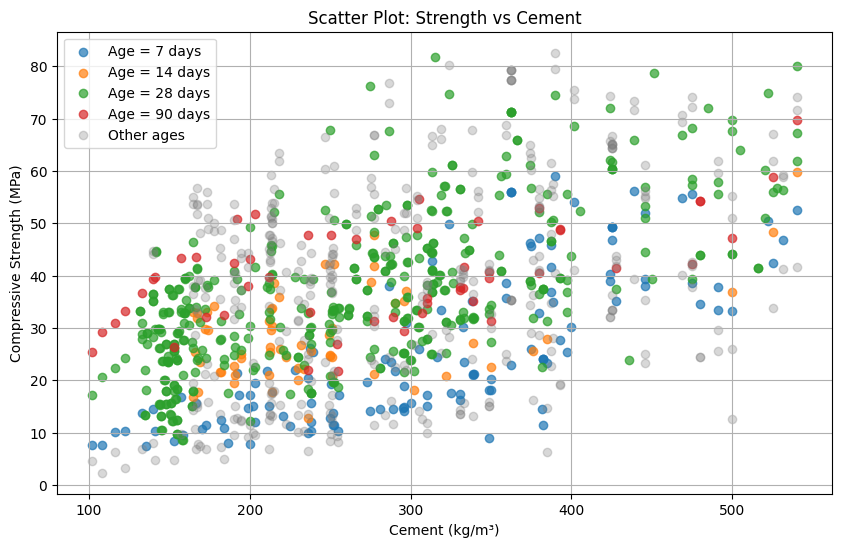

In [ ]:
# Define special ages to differentiate
special_ages = [7, 14, 28, 90]

# Scatter plot with different colors for special ages
plt.figure(figsize=(10, 6))
for age in special_ages:
    subset = data[data['Age (day)'] == age]
    plt.scatter(subset['Cement (kg/m³)'], subset['Strength (MPa)'],
                label=f'Age = {age} days', alpha=0.7)

# Points for other ages
other_ages = data[~data['Age (day)'].isin(special_ages)]
plt.scatter(other_ages['Cement (kg/m³)'], other_ages['Strength (MPa)'],
            color='gray', label='Other ages', alpha=0.3)

plt.title('Scatter Plot: Strength vs Cement')
plt.xlabel('Cement (kg/m³)')
plt.ylabel('Compressive Strength (MPa)')
plt.legend()
plt.grid(True)
plt.show()

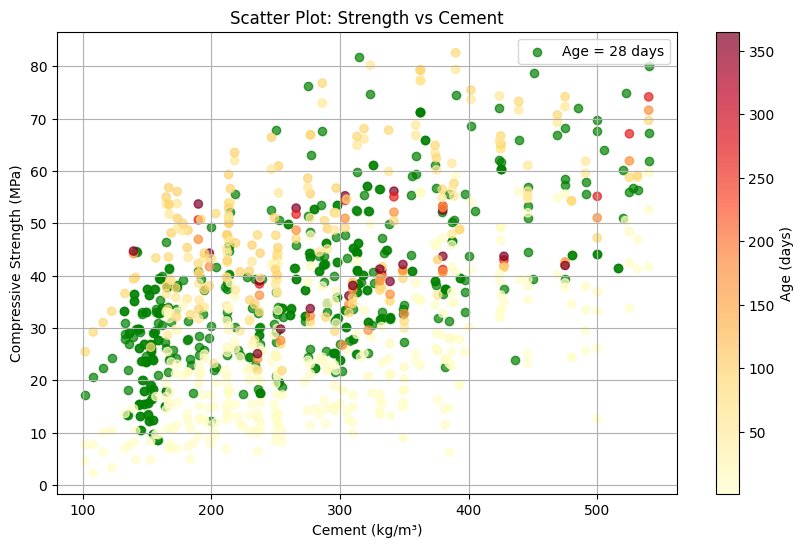

In [ ]:
# Définir l'âge spécial pour la différenciation
special_age = 28

# Tracer le nuage de points avec des couleurs différentes pour l'âge spécial et les autres âges
plt.figure(figsize=(10, 6))

# Tracé pour l'âge 28 (en vert)
subset_special = data[data['Age (day)'] == special_age]
plt.scatter(subset_special['Cement (kg/m³)'], subset_special['Strength (MPa)'],
            label=f'Age = {special_age} days', alpha=0.7, color='green')

# Tracé pour les autres âges (heatmap avec l'âge comme couleur démarrant par le jaune foncé)
other_ages = data[data['Age (day)'] != special_age]
plt.scatter(other_ages['Cement (kg/m³)'], other_ages['Strength (MPa)'],
            c=other_ages['Age (day)'], cmap='YlOrRd', alpha=0.7)

plt.title('Scatter Plot: Strength vs Cement')
plt.xlabel('Cement (kg/m³)')
plt.ylabel('Compressive Strength (MPa)')
plt.legend()
plt.grid(True)
plt.colorbar(label='Age (days)', orientation='vertical')
plt.show()

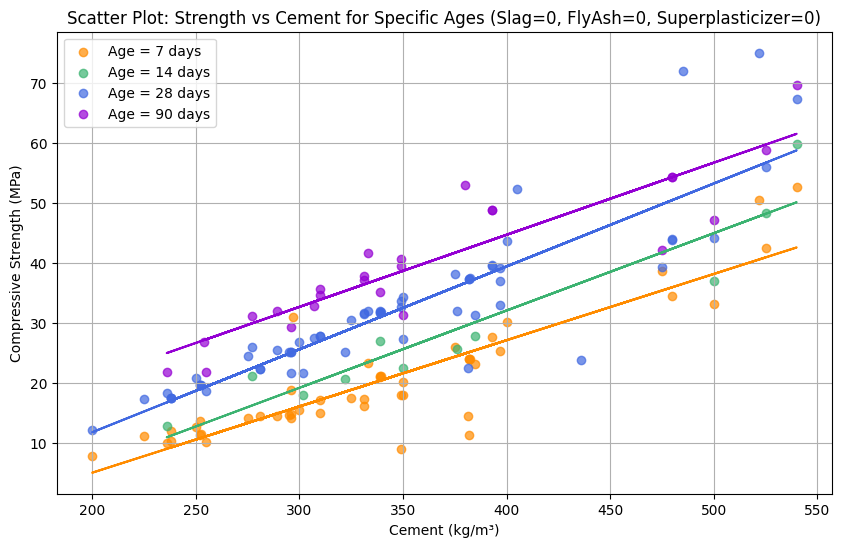

In [ ]:
# Définir les âges spécifiques (inclure 14 jours au lieu de 365 jours)
special_ages = [7, 14, 28, 90]

# Filtrer les données pour ne garder que les âges spécifiés et les conditions Slag=0, FlyAsh=0, Superplasticizer=0
filtered_data = data[
    (data['Age (day)'].isin(special_ages)) &
    (data['Slag (kg/m³)'] == 0) &
    (data['FlyAsh (kg/m³)'] == 0) &
    (data['Superplasticizer (kg/m³)'] == 0)
]

# Scatter plot avec différentes couleurs pour les âges spéciaux
plt.figure(figsize=(10, 6))
colors = ['darkorange', 'mediumseagreen', 'royalblue', 'darkviolet']

for age, color in zip(special_ages, colors):
    subset = filtered_data[filtered_data['Age (day)'] == age]
    plt.scatter(subset['Cement (kg/m³)'], subset['Strength (MPa)'],
                label=f'Age = {age} days', alpha=0.7, color=color)

    # Calculer et tracer la ligne de tendance moyenne
    z = np.polyfit(subset['Cement (kg/m³)'], subset['Strength (MPa)'], 1)
    p = np.poly1d(z)
    plt.plot(subset['Cement (kg/m³)'], p(subset['Cement (kg/m³)']), color=color, linestyle='-')

plt.title('Scatter Plot: Strength vs Cement for Specific Ages (Slag=0, FlyAsh=0, Superplasticizer=0)')
plt.xlabel('Cement (kg/m³)')
plt.ylabel('Compressive Strength (MPa)')
plt.legend()
plt.grid(True)
plt.show()

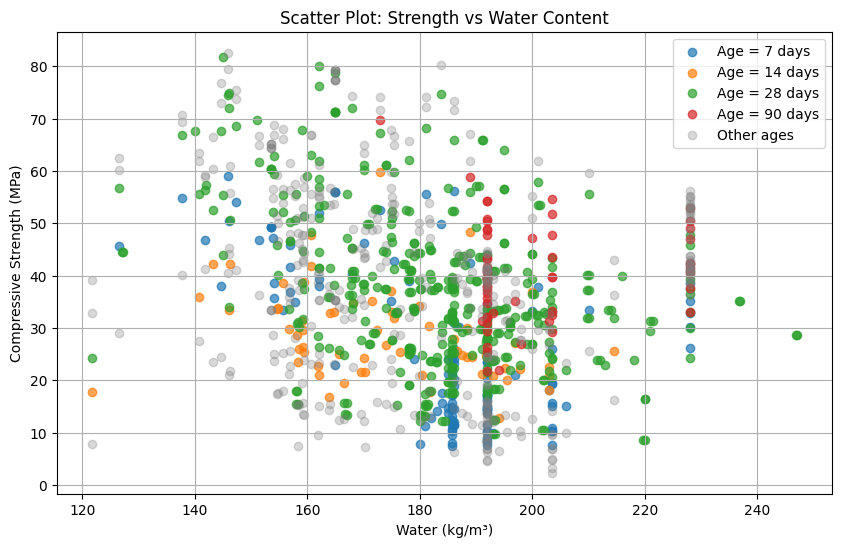

In [ ]:
# Define special ages to differentiate
special_ages = [7, 14, 28, 90]

# Scatter plot with different colors for special ages
plt.figure(figsize=(10, 6))
for age in special_ages:
    subset = data[data['Age (day)'] == age]
    plt.scatter(subset['Water (kg/m³)'], subset['Strength (MPa)'],
                label=f'Age = {age} days', alpha=0.7)

# Points for other ages
other_ages = data[~data['Age (day)'].isin(special_ages)]
plt.scatter(other_ages['Water (kg/m³)'], other_ages['Strength (MPa)'],
            color='gray', label='Other ages', alpha=0.3)

plt.title('Scatter Plot: Strength vs Water Content')
plt.xlabel('Water (kg/m³)')
plt.ylabel('Compressive Strength (MPa)')
plt.legend()
plt.grid(True)
plt.show()

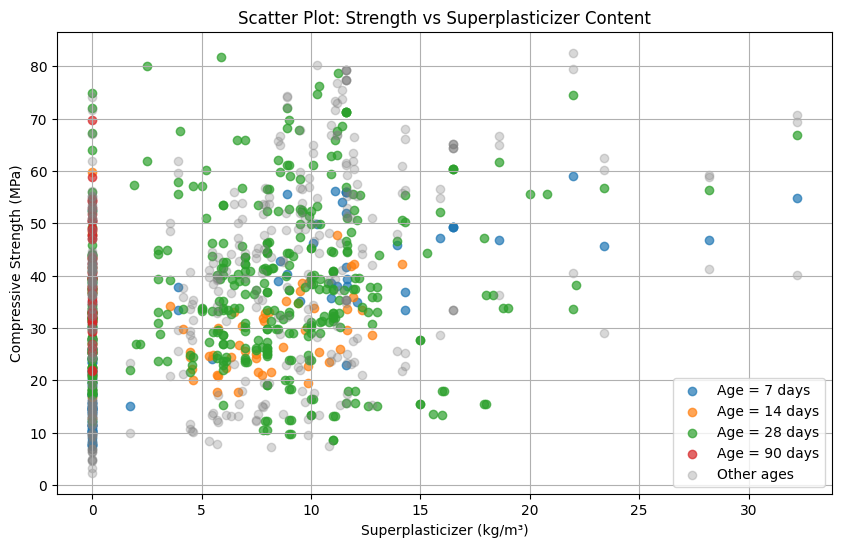

In [ ]:
# Define special ages to differentiate
special_ages = [7, 14, 28, 90]

# Scatter plot with different colors for special ages
plt.figure(figsize=(10, 6))
for age in special_ages:
    subset = data[data['Age (day)'] == age]
    plt.scatter(subset['Superplasticizer (kg/m³)'], subset['Strength (MPa)'],
                label=f'Age = {age} days', alpha=0.7)

# Points for other ages
other_ages = data[~data['Age (day)'].isin(special_ages)]
plt.scatter(other_ages['Superplasticizer (kg/m³)'], other_ages['Strength (MPa)'],
            color='gray', label='Other ages', alpha=0.3)

plt.title('Scatter Plot: Strength vs Superplasticizer Content')
plt.xlabel('Superplasticizer (kg/m³)')
plt.ylabel('Compressive Strength (MPa)')
plt.legend()
plt.grid(True)
plt.show()

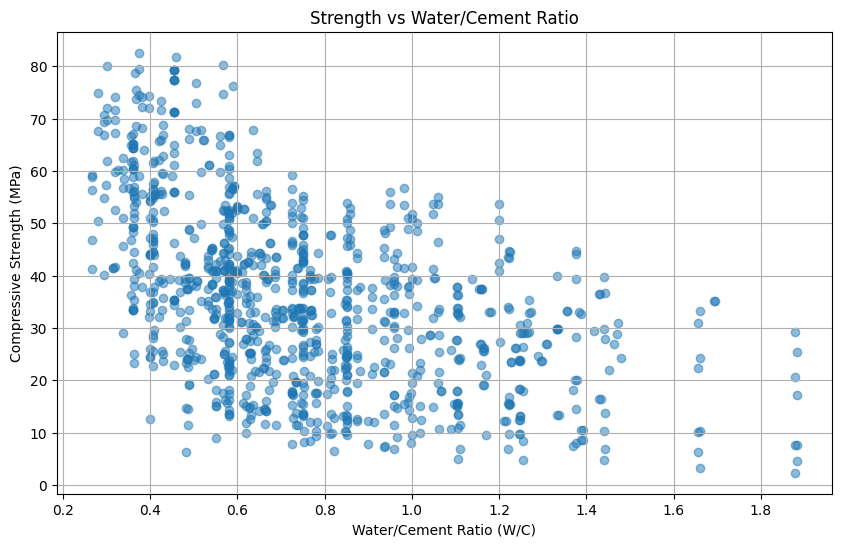

In [ ]:
# Tracer le scatter plot Strength vs W/C
plt.figure(figsize=(10, 6))
plt.scatter(data2['W/C'], data2['Strength (MPa)'], alpha=0.5)
plt.title('Strength vs Water/Cement Ratio')
plt.xlabel('Water/Cement Ratio (W/C)')
plt.ylabel('Compressive Strength (MPa)')
plt.grid(True)
plt.show()

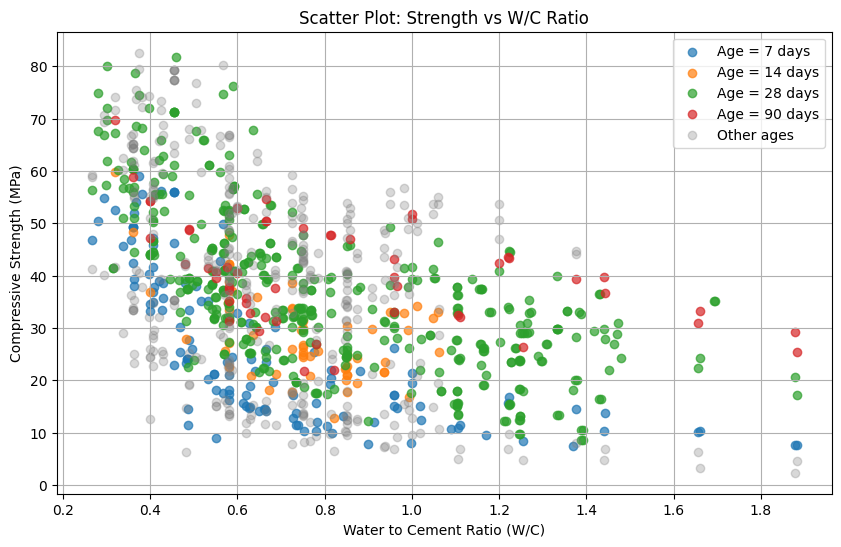

In [ ]:
# Créer une copie de la base de données
data2 = data.copy()

# Calculer les nouvelles colonnes
data2['W/C'] = data2['Water (kg/m³)'] / data2['Cement (kg/m³)']
data2['G/S'] = data2['CoarseAggr (kg/m³)'] / data2['FineAggr (kg/m³)']

# Insérer les nouvelles colonnes avant la colonne 'Strength'
strength_index = data2.columns.get_loc('Strength (MPa)')

# Réordonner les colonnes pour placer 'W/C' et 'G/S' avant 'Strength'
cols = data2.columns.tolist()
cols.insert(strength_index, cols.pop(cols.index('W/C')))
cols.insert(strength_index, cols.pop(cols.index('G/S')))

# Appliquer le nouvel ordre des colonnes à data2
data2 = data2[cols]


# Define special ages to differentiate
special_ages = [7, 14, 28, 90]

# Scatter plot with different colors for special ages
plt.figure(figsize=(10, 6))
for age in special_ages:
    subset = data2[data2['Age (day)'] == age]
    plt.scatter(subset['W/C'], subset['Strength (MPa)'],
                label=f'Age = {age} days', alpha=0.7)

# Points for other ages
other_ages = data2[~data2['Age (day)'].isin(special_ages)]
plt.scatter(other_ages['W/C'], other_ages['Strength (MPa)'],
            color='gray', label='Other ages', alpha=0.3)

plt.title('Scatter Plot: Strength vs W/C Ratio')
plt.xlabel('Water to Cement Ratio (W/C)')
plt.ylabel('Compressive Strength (MPa)')
plt.legend()
plt.grid(True)
plt.show()

<ipython-input-73-c62e29a87f8d>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data2['W/C'] = filtered_data2['Water (kg/m³)'] / filtered_data2['Cement (kg/m³)']


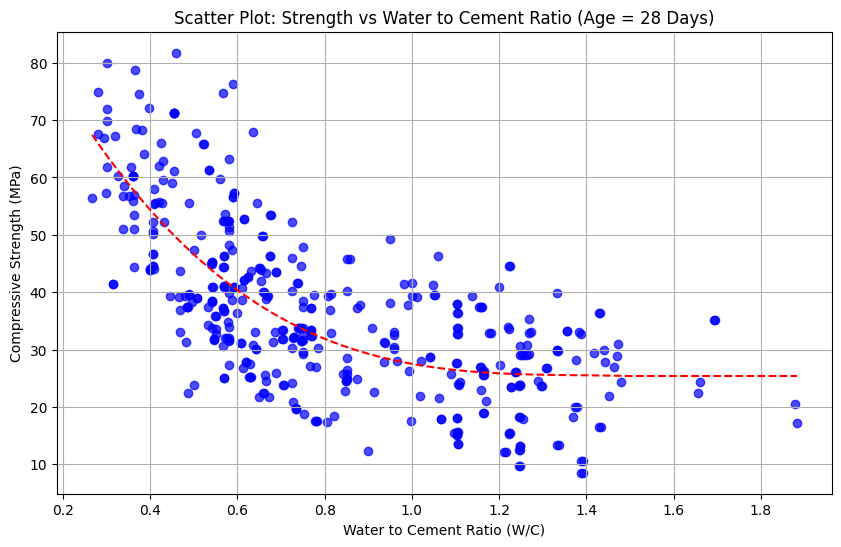

In [ ]:
# Filtrer les données pour l'âge de 28 jours
filtered_data2 = data2[data2['Age (day)'] == 28]

# Calculer le ratio W/C
filtered_data2['W/C'] = filtered_data2['Water (kg/m³)'] / filtered_data2['Cement (kg/m³)']

# Scatter plot pour l'âge de 28 jours
plt.figure(figsize=(10, 6))
plt.scatter(filtered_data2['W/C'], filtered_data2['Strength (MPa)'],
            color='blue', alpha=0.7)

# Ajuster une courbe polynomiale de degré 3
coefficients = np.polyfit(filtered_data2['W/C'], filtered_data2['Strength (MPa)'], 3)
polynomial = np.poly1d(coefficients)

# Définir la limite pour la courbe ajustée
limit = 1.515

# Générer des valeurs pour la courbe ajustée, mais seulement jusqu'à la limite
w_c_vals_poly = np.linspace(filtered_data2['W/C'].min(), limit, 100)
fitted_curve_poly = polynomial(w_c_vals_poly)

# Tracer la courbe polynomiale ajustée
plt.plot(w_c_vals_poly, fitted_curve_poly, color='red', linestyle='--')

# Ajouter une ligne horizontale (palier) après la limite
last_w_c_value = filtered_data2['W/C'].max()
last_strength = polynomial(limit)

# Générer des valeurs pour la partie horizontale de la courbe
w_c_vals_horizontal = np.linspace(limit, last_w_c_value, 100)
horizontal_line = np.full_like(w_c_vals_horizontal, last_strength)

# Tracer la partie horizontale
plt.plot(w_c_vals_horizontal, horizontal_line, color='red', linestyle='--')

plt.title('Scatter Plot: Strength vs Water to Cement Ratio (Age = 28 Days)')
plt.xlabel('Water to Cement Ratio (W/C)')
plt.ylabel('Compressive Strength (MPa)')
plt.grid(True)
plt.show()

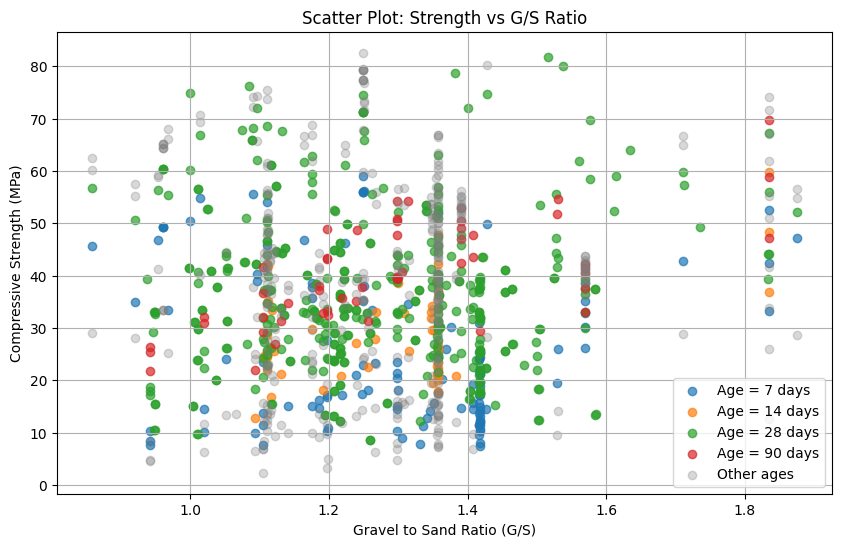

In [ ]:
# Define special ages to differentiate
special_ages = [7, 14, 28, 90]

# Scatter plot with different colors for special ages
plt.figure(figsize=(10, 6))
for age in special_ages:
    subset = data2[data2['Age (day)'] == age]
    plt.scatter(subset['G/S'], subset['Strength (MPa)'],
                label=f'Age = {age} days', alpha=0.7)

# Points for other ages
other_ages = data2[~data2['Age (day)'].isin(special_ages)]
plt.scatter(other_ages['G/S'], other_ages['Strength (MPa)'],
            color='gray', label='Other ages', alpha=0.3)

plt.title('Scatter Plot: Strength vs G/S Ratio')
plt.xlabel('Gravel to Sand Ratio (G/S)')
plt.ylabel('Compressive Strength (MPa)')
plt.legend()
plt.grid(True)
plt.show()

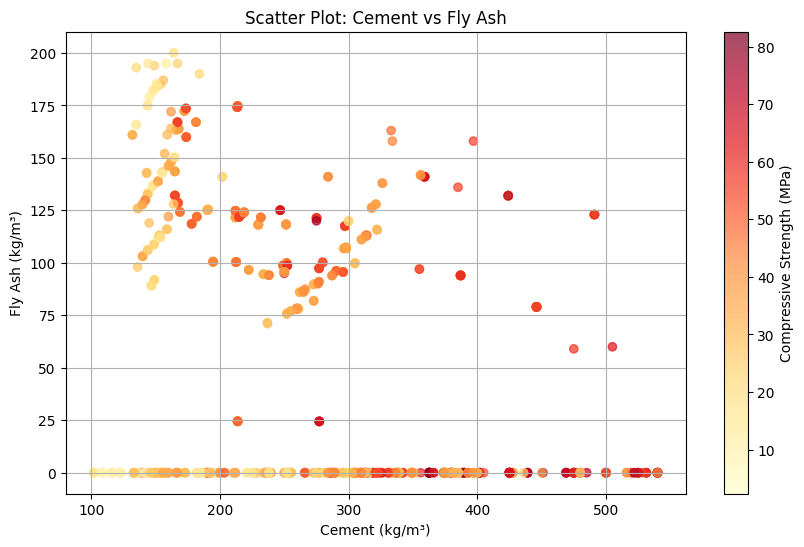

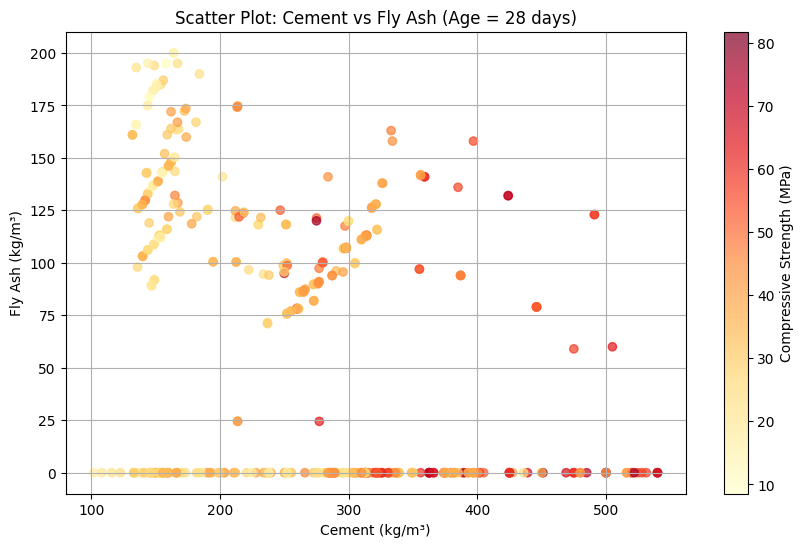

In [ ]:
# Tracer le nuage de points avec un dégradé de couleur pour la résistance
plt.figure(figsize=(10, 6))

plt.scatter(data['Cement (kg/m³)'], data['FlyAsh (kg/m³)'],
            c=data['Strength (MPa)'], cmap='YlOrRd', alpha=0.7)

plt.title('Scatter Plot: Cement vs Fly Ash')
plt.xlabel('Cement (kg/m³)')
plt.ylabel('Fly Ash (kg/m³)')
plt.colorbar(label='Compressive Strength (MPa)', orientation='vertical')
plt.grid(True)
plt.show()

# Filtrer les données pour l'âge égal à 28 jours
data_age_28 = data[data['Age (day)'] == 28]

# Tracer le nuage de points avec un dégradé de couleur pour la résistance
plt.figure(figsize=(10, 6))

plt.scatter(data_age_28['Cement (kg/m³)'], data_age_28['FlyAsh (kg/m³)'],
            c=data_age_28['Strength (MPa)'], cmap='YlOrRd', alpha=0.7)

plt.title('Scatter Plot: Cement vs Fly Ash (Age = 28 days)')
plt.xlabel('Cement (kg/m³)')
plt.ylabel('Fly Ash (kg/m³)')
plt.colorbar(label='Compressive Strength (MPa)', orientation='vertical')
plt.grid(True)
plt.show()

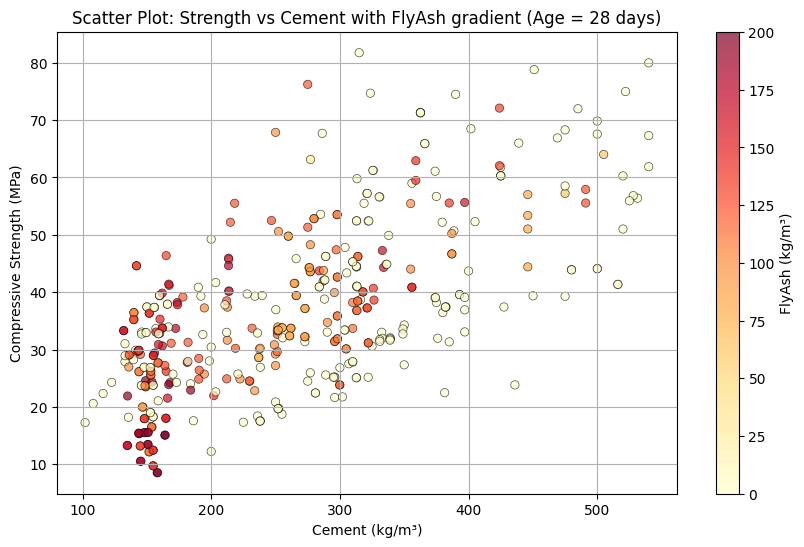

In [ ]:
# Filtrer les données pour age = 28
data_age_28 = data[data['Age (day)'] == 28]

# Tracer le nuage de points avec dégradation de couleur pour FlyAsh
plt.figure(figsize=(10, 6))
scatter = plt.scatter(data_age_28['Cement (kg/m³)'], data_age_28['Strength (MPa)'],
                      c=data_age_28['FlyAsh (kg/m³)'],
                      cmap='YlOrRd', alpha=0.7, edgecolors='k', linewidths=0.5)

plt.title('Scatter Plot: Strength vs Cement with FlyAsh gradient (Age = 28 days)')
plt.xlabel('Cement (kg/m³)')
plt.ylabel('Compressive Strength (MPa)')
plt.colorbar(scatter, label='FlyAsh (kg/m³)', orientation='vertical')
plt.grid(True)
plt.show()

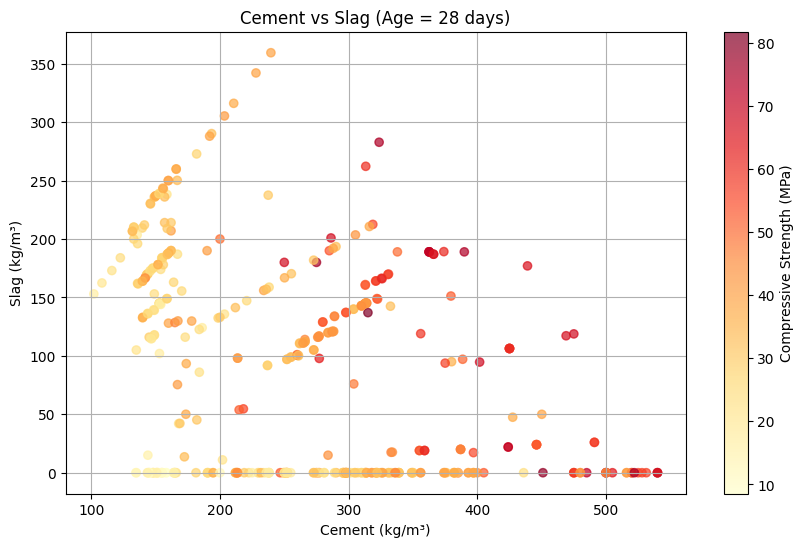

In [ ]:
# Filtrer les données pour l'âge égal à 28 jours
data_age_28 = data[data['Age (day)'] == 28]

# Tracer le nuage de points avec un dégradé de couleur pour la résistance
plt.figure(figsize=(10, 6))

plt.scatter(data_age_28['Cement (kg/m³)'], data_age_28['Slag (kg/m³)'],
            c=data_age_28['Strength (MPa)'], cmap='YlOrRd', alpha=0.7)

plt.title('Cement vs Slag (Age = 28 days)')
plt.xlabel('Cement (kg/m³)')
plt.ylabel('Slag (kg/m³)')
plt.colorbar(label='Compressive Strength (MPa)', orientation='vertical')
plt.grid(True)
plt.show()

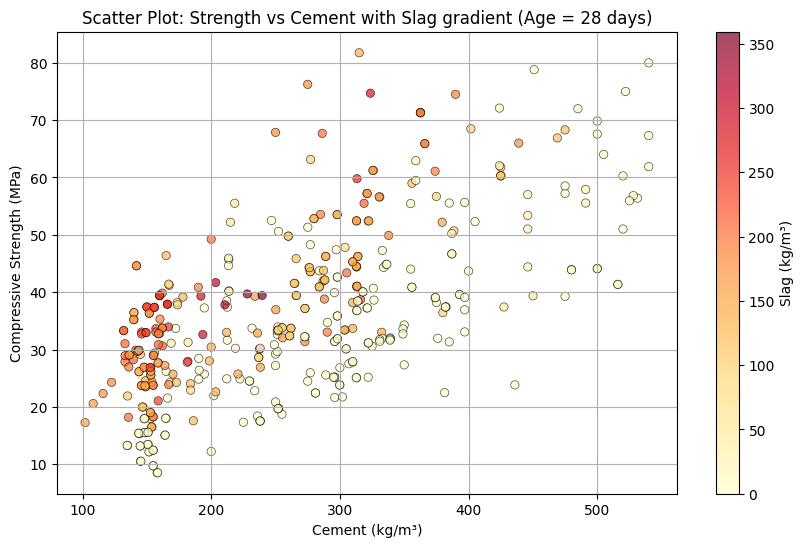

In [ ]:
# Filtrer les données pour age = 28
data_age_28 = data[data['Age (day)'] == 28]

# Tracer le nuage de points avec dégradation de couleur pour Slag
plt.figure(figsize=(10, 6))
scatter = plt.scatter(data_age_28['Cement (kg/m³)'], data_age_28['Strength (MPa)'],
                      c=data_age_28['Slag (kg/m³)'],
                      cmap='YlOrRd', alpha=0.7, edgecolors='k', linewidths=0.5)

plt.title('Scatter Plot: Strength vs Cement with Slag gradient (Age = 28 days)')
plt.xlabel('Cement (kg/m³)')
plt.ylabel('Compressive Strength (MPa)')
plt.colorbar(scatter, label='Slag (kg/m³)', orientation='vertical')
plt.grid(True)
plt.show()

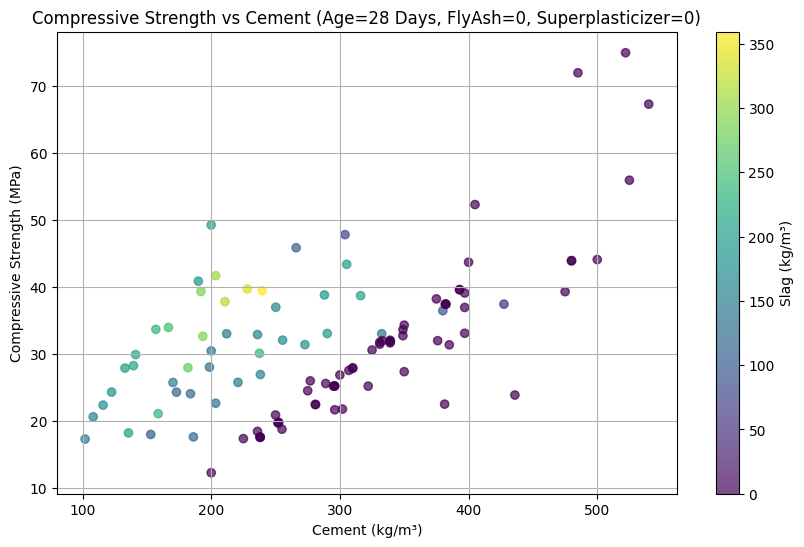

In [ ]:
import matplotlib.colors as mcolors
# Filtrer les données pour un âge de 28 jours et FlyAsh=0, Superplasticizer=0
filtered_data = data[
    (data['Age (day)'] == 28) &
    (data['FlyAsh (kg/m³)'] == 0) &
    (data['Superplasticizer (kg/m³)'] == 0)
]

# Définir les valeurs de Slag et les couleurs pour le dégradé
slag_values = filtered_data['Slag (kg/m³)'].unique()
cmap = plt.get_cmap('viridis')  # Utiliser une carte de couleurs pour le dégradé
norm = mcolors.Normalize(vmin=min(slag_values), vmax=max(slag_values))

# Scatter plot avec un dégradé de couleurs pour Slag
plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    filtered_data['Cement (kg/m³)'],
    filtered_data['Strength (MPa)'],
    c=filtered_data['Slag (kg/m³)'],
    cmap=cmap,
    norm=norm,
    alpha=0.7
)

# Ajouter une barre de couleurs pour indiquer le dégradé de Slag
cbar = plt.colorbar(scatter)
cbar.set_label('Slag (kg/m³)')

plt.title('Compressive Strength vs Cement (Age=28 Days, FlyAsh=0, Superplasticizer=0)')
plt.xlabel('Cement (kg/m³)')
plt.ylabel('Compressive Strength (MPa)')
plt.grid(True)
plt.show()

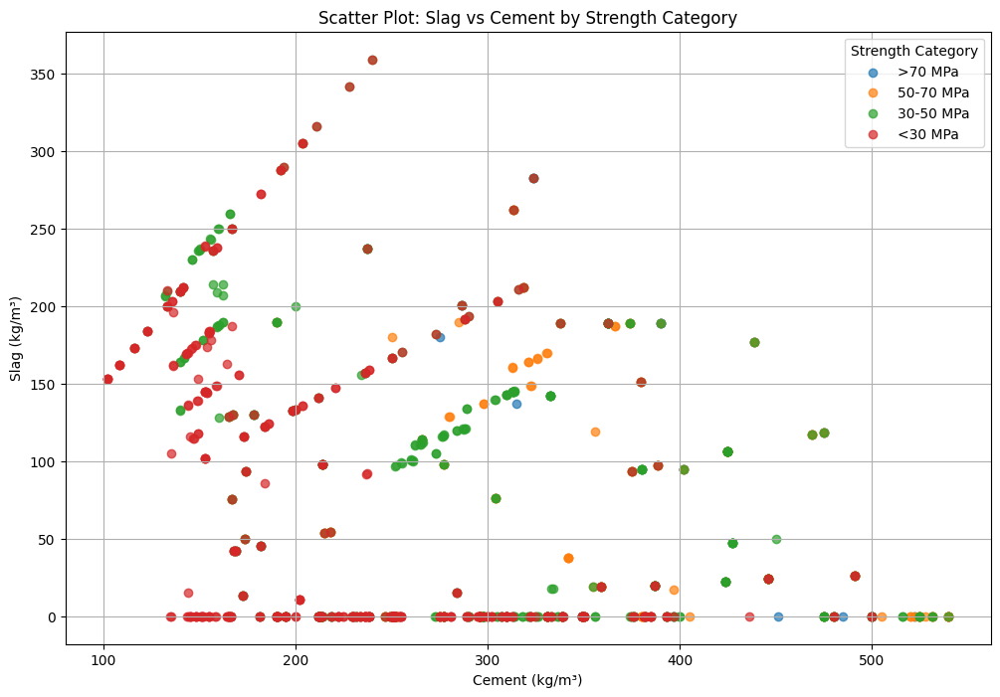

In [ ]:
# Définir les intervalles de résistance
bins = [0, 30, 50, 70, float('inf')]  # Les intervalles sont définis en MPa

# Ajouter une nouvelle colonne avec les catégories d'intervalle
data['Strength Category'] = pd.cut(data['Strength (MPa)'], bins=bins,
                                   labels=['<30 MPa', '30-50 MPa', '50-70 MPa', '>70 MPa'])

# Tracer des scatter plots pour chaque intervalle de résistance
plt.figure(figsize=(12, 8))

for category in data['Strength Category'].unique():
    subset = data[data['Strength Category'] == category]
    plt.scatter(subset['Cement (kg/m³)'], subset['Slag (kg/m³)'],
                label=category, alpha=0.7)

plt.title('Scatter Plot: Slag vs Cement by Strength Category')
plt.xlabel('Cement (kg/m³)')
plt.ylabel('Slag (kg/m³)')
plt.legend(title='Strength Category')
plt.grid(True)
plt.show()

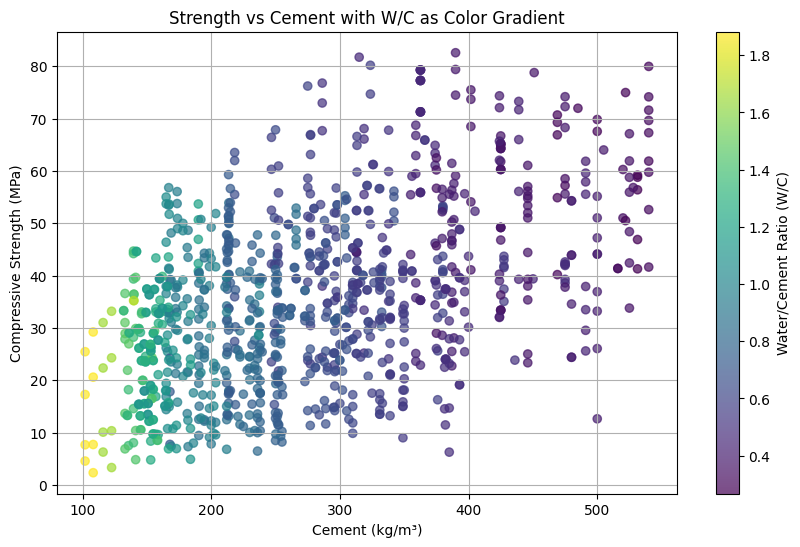

In [ ]:
# Tracer le scatter plot Strength vs Cement avec couleur dégradée représentant W/C
plt.figure(figsize=(10, 6))
sc = plt.scatter(data2['Cement (kg/m³)'], data2['Strength (MPa)'], c=data2['W/C'], cmap='viridis', alpha=0.7)
plt.colorbar(sc, label='Water/Cement Ratio (W/C)')
plt.title('Strength vs Cement with W/C as Color Gradient')
plt.xlabel('Cement (kg/m³)')
plt.ylabel('Compressive Strength (MPa)')
plt.grid(True)
plt.show()

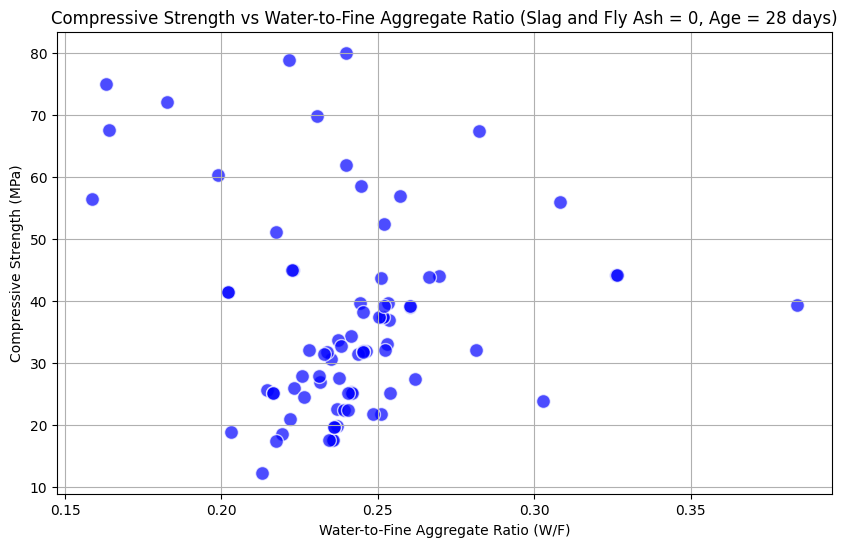

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Charger le fichier Excel
file_path = 'Concrete_Data.xls'  # Remplacez par le chemin de votre fichier
data = pd.read_excel(file_path)

# Renommer les colonnes
new_column_names = {
   'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Blast Furnace Slag (component 2)(kg in a m^3 mixture)': 'Slag (kg/m³)',
    'Fly Ash (component 3)(kg in a m^3 mixture)': 'FlyAsh (kg/m³)',
    'Water  (component 4)(kg in a m^3 mixture)': 'Water (kg/m³)',
    'Superplasticizer (component 5)(kg in a m^3 mixture)': 'Superplasticizer (kg/m³)',
    'Coarse Aggregate  (component 6)(kg in a m^3 mixture)': 'CoarseAggr (kg/m³)',
    'Fine Aggregate (component 7)(kg in a m^3 mixture)': 'FineAggr (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}

data.rename(columns=new_column_names, inplace=True)

# Créer une copie de la base de données
data2 = data.copy()

# Calculer les nouvelles colonnes
data2['W/F'] = data2['Water (kg/m³)'] / data2['FineAggr (kg/m³)']

# Filtrer les données pour Slag et FlyAsh égaux à 0 et Age = 28 jours
filtered_data = data2[(data2['Slag (kg/m³)'] == 0) & (data2['FlyAsh (kg/m³)'] == 0) & (data2['Age (day)'] == 28)]

# Créer le graphique
plt.figure(figsize=(10, 6))
plt.scatter(filtered_data['W/F'], filtered_data['Strength (MPa)'], alpha=0.7, edgecolors='w', s=100, c='b')
plt.xlabel('Water-to-Fine Aggregate Ratio (W/F)')
plt.ylabel('Compressive Strength (MPa)')
plt.title('Compressive Strength vs Water-to-Fine Aggregate Ratio (Slag and Fly Ash = 0, Age = 28 days)')
plt.grid(True)
plt.show()


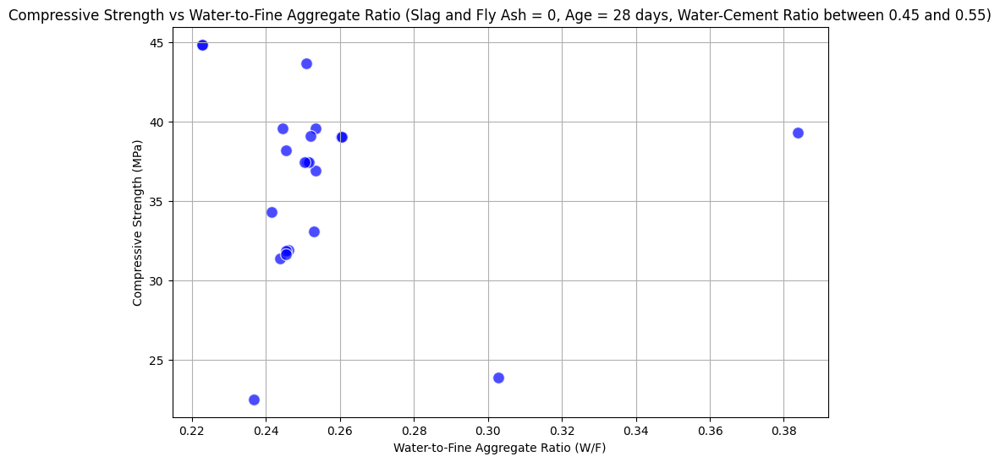

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Charger le fichier Excel
file_path = 'Concrete_Data.xls'  # Remplacez par le chemin de votre fichier
data = pd.read_excel(file_path)

# Renommer les colonnes
new_column_names = {
   'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Blast Furnace Slag (component 2)(kg in a m^3 mixture)': 'Slag (kg/m³)',
    'Fly Ash (component 3)(kg in a m^3 mixture)': 'FlyAsh (kg/m³)',
    'Water  (component 4)(kg in a m^3 mixture)': 'Water (kg/m³)',
    'Superplasticizer (component 5)(kg in a m^3 mixture)': 'Superplasticizer (kg/m³)',
    'Coarse Aggregate  (component 6)(kg in a m^3 mixture)': 'CoarseAggr (kg/m³)',
    'Fine Aggregate (component 7)(kg in a m^3 mixture)': 'FineAggr (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}

data.rename(columns=new_column_names, inplace=True)

# Créer une copie de la base de données
data2 = data.copy()

# Calculer les nouvelles colonnes
data2['W/F'] = data2['Water (kg/m³)'] / data2['FineAggr (kg/m³)']
data2['W/C'] = data2['Water (kg/m³)'] / data2['Cement (kg/m³)']  # Calcul du ratio eau-ciment

# Filtrer les données pour Slag et FlyAsh égaux à 0, Age = 28 jours, et Water-Cement Ratio entre 0.45 et 0.55
filtered_data = data2[
    (data2['Slag (kg/m³)'] == 0) &
    (data2['FlyAsh (kg/m³)'] == 0) &
    (data2['Age (day)'] == 28) &
    (data2['W/C'] >= 0.45) &
    (data2['W/C'] <= 0.55)
]

# Créer le graphique
plt.figure(figsize=(10, 6))
plt.scatter(filtered_data['W/F'], filtered_data['Strength (MPa)'], alpha=0.7, edgecolors='w', s=100, c='b')
plt.xlabel('Water-to-Fine Aggregate Ratio (W/F)')
plt.ylabel('Compressive Strength (MPa)')
plt.title('Compressive Strength vs Water-to-Fine Aggregate Ratio (Slag and Fly Ash = 0, Age = 28 days, Water-Cement Ratio between 0.45 and 0.55)')
plt.grid(True)
plt.show()


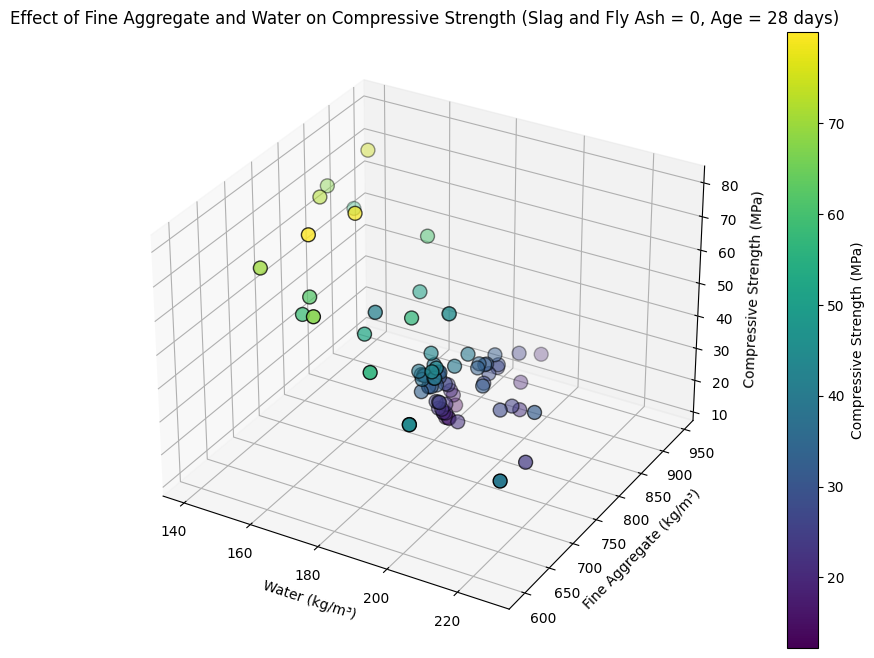

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Charger le fichier Excel
file_path = 'Concrete_Data.xls'  # Remplacez par le chemin de votre fichier
data = pd.read_excel(file_path)

# Renommer les colonnes
new_column_names = {
   'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Blast Furnace Slag (component 2)(kg in a m^3 mixture)': 'Slag (kg/m³)',
    'Fly Ash (component 3)(kg in a m^3 mixture)': 'FlyAsh (kg/m³)',
    'Water  (component 4)(kg in a m^3 mixture)': 'Water (kg/m³)',
    'Superplasticizer (component 5)(kg in a m^3 mixture)': 'Superplasticizer (kg/m³)',
    'Coarse Aggregate  (component 6)(kg in a m^3 mixture)': 'CoarseAggr (kg/m³)',
    'Fine Aggregate (component 7)(kg in a m^3 mixture)': 'FineAggr (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}

data.rename(columns=new_column_names, inplace=True)

# Créer une copie de la base de données
data2 = data.copy()

# Filtrer les données pour Slag et FlyAsh égaux à 0 et Age = 28 jours
filtered_data = data2[(data2['Slag (kg/m³)'] == 0) & (data2['FlyAsh (kg/m³)'] == 0) & (data2['Age (day)'] == 28)]

# Créer le graphique 3D
fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(111, projection='3d')

# Préparer les données pour le graphique 3D
water = filtered_data['Water (kg/m³)']
fine_aggregate = filtered_data['FineAggr (kg/m³)']
strength = filtered_data['Strength (MPa)']

# Création du graphique
sc = ax.scatter(water, fine_aggregate, strength, c=strength, cmap='viridis', edgecolor='k', s=100)
ax.set_xlabel('Water (kg/m³)')
ax.set_ylabel('Fine Aggregate (kg/m³)')
ax.set_zlabel('Compressive Strength (MPa)')
ax.set_title('Effect of Fine Aggregate and Water on Compressive Strength (Slag and Fly Ash = 0, Age = 28 days)')

# Ajouter une barre de couleur
cbar = plt.colorbar(sc)
cbar.set_label('Compressive Strength (MPa)')

plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


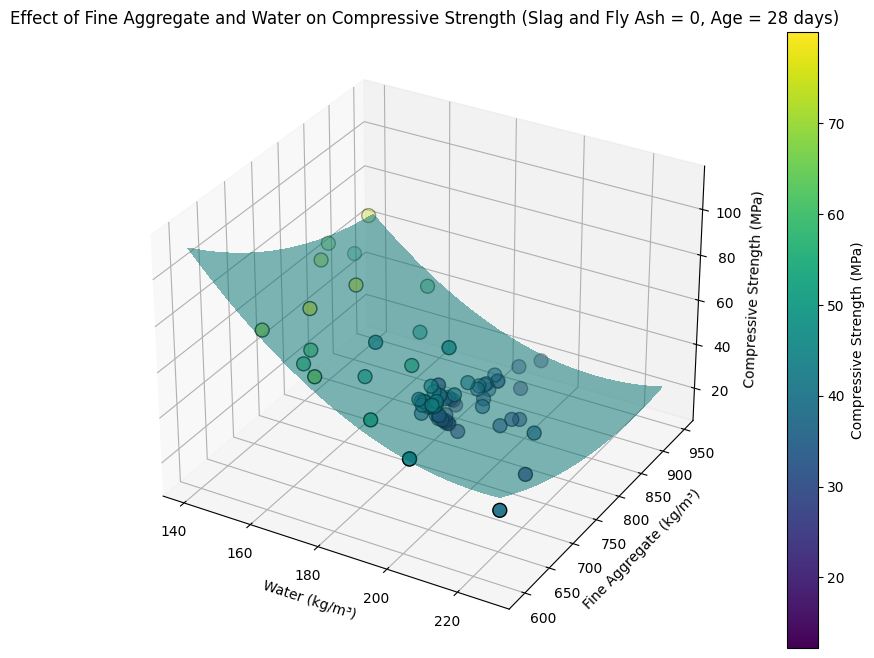

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

# Charger le fichier Excel
file_path = 'Concrete_Data.xls'  # Remplacez par le chemin de votre fichier
data = pd.read_excel(file_path)

# Renommer les colonnes
new_column_names = {
    'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Blast Furnace Slag (component 2)(kg in a m^3 mixture)': 'Slag (kg/m³)',
    'Fly Ash (component 3)(kg in a m^3 mixture)': 'FlyAsh (kg/m³)',
    'Water  (component 4)(kg in a m^3 mixture)': 'Water (kg/m³)',
    'Superplasticizer (component 5)(kg in a m^3 mixture)': 'Superplasticizer (kg/m³)',
    'Coarse Aggregate  (component 6)(kg in a m^3 mixture)': 'CoarseAggr (kg/m³)',
    'Fine Aggregate (component 7)(kg in a m^3 mixture)': 'FineAggr (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}

data.rename(columns=new_column_names, inplace=True)

# Créer une copie de la base de données
data2 = data.copy()

# Filtrer les données pour Slag et FlyAsh égaux à 0 et Age = 28 jours
filtered_data = data2[(data2['Slag (kg/m³)'] == 0) & (data2['FlyAsh (kg/m³)'] == 0) & (data2['Age (day)'] == 28)]

# Préparer les données pour le modèle de régression
X = filtered_data[['Water (kg/m³)', 'FineAggr (kg/m³)']]
y = filtered_data['Strength (MPa)']

# Ajuster un modèle de régression polynomiale
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
model = LinearRegression()
model.fit(X_poly, y)

# Créer une grille de valeurs pour prédire la surface
water_range = np.linspace(X['Water (kg/m³)'].min(), X['Water (kg/m³)'].max(), 100)
fine_aggregate_range = np.linspace(X['FineAggr (kg/m³)'].min(), X['FineAggr (kg/m³)'].max(), 100)
water_grid, fine_aggregate_grid = np.meshgrid(water_range, fine_aggregate_range)
X_grid = np.column_stack([water_grid.ravel(), fine_aggregate_grid.ravel()])
X_grid_poly = poly.transform(X_grid)
y_pred_grid = model.predict(X_grid_poly).reshape(water_grid.shape)

# Créer le graphique 3D avec la surface de régression
fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(111, projection='3d')

# Préparer les données pour le graphique 3D
water = filtered_data['Water (kg/m³)']
fine_aggregate = filtered_data['FineAggr (kg/m³)']
strength = filtered_data['Strength (MPa)']

# Création du graphique
sc = ax.scatter(water, fine_aggregate, strength, c=strength, cmap='viridis', edgecolor='k', s=100)
ax.set_xlabel('Water (kg/m³)')
ax.set_ylabel('Fine Aggregate (kg/m³)')
ax.set_zlabel('Compressive Strength (MPa)')
ax.set_title('Effect of Fine Aggregate and Water on Compressive Strength (Slag and Fly Ash = 0, Age = 28 days)')

# Ajouter la surface de régression
ax.plot_surface(water_grid, fine_aggregate_grid, y_pred_grid, color='c', alpha=0.5, rstride=100, cstride=100, linewidth=0, antialiased=False)

# Ajouter une barre de couleur
cbar = plt.colorbar(sc)
cbar.set_label('Compressive Strength (MPa)')

plt.show()


In [ ]:
pip install plotly


In [ ]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

# Charger le fichier Excel
file_path = 'Concrete_Data.xls'  # Remplacez par le chemin de votre fichier
data = pd.read_excel(file_path)

# Renommer les colonnes
new_column_names = {
    'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Blast Furnace Slag (component 2)(kg in a m^3 mixture)': 'Slag (kg/m³)',
    'Fly Ash (component 3)(kg in a m^3 mixture)': 'FlyAsh (kg/m³)',
    'Water  (component 4)(kg in a m^3 mixture)': 'Water (kg/m³)',
    'Superplasticizer (component 5)(kg in a m^3 mixture)': 'Superplasticizer (kg/m³)',
    'Coarse Aggregate  (component 6)(kg in a m^3 mixture)': 'CoarseAggr (kg/m³)',
    'Fine Aggregate (component 7)(kg in a m^3 mixture)': 'FineAggr (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}

data.rename(columns=new_column_names, inplace=True)

# Créer une copie de la base de données
data2 = data.copy()

# Filtrer les données pour Slag et FlyAsh égaux à 0 et Age = 28 jours
filtered_data = data2[(data2['Slag (kg/m³)'] == 0) & (data2['FlyAsh (kg/m³)'] == 0) & (data2['Age (day)'] == 28)]

# Préparer les données pour le modèle de régression
X = filtered_data[['Water (kg/m³)', 'FineAggr (kg/m³)']]
y = filtered_data['Strength (MPa)']

# Ajuster un modèle de régression polynomiale
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
model = LinearRegression()
model.fit(X_poly, y)

# Créer une grille de valeurs pour prédire la surface
water_range = np.linspace(X['Water (kg/m³)'].min(), X['Water (kg/m³)'].max(), 100)
fine_aggregate_range = np.linspace(X['FineAggr (kg/m³)'].min(), X['FineAggr (kg/m³)'].max(), 100)
water_grid, fine_aggregate_grid = np.meshgrid(water_range, fine_aggregate_range)
X_grid = np.column_stack([water_grid.ravel(), fine_aggregate_grid.ravel()])
X_grid_poly = poly.transform(X_grid)
y_pred_grid = model.predict(X_grid_poly).reshape(water_grid.shape)

# Créer le graphique 3D avec Plotly
fig = go.Figure()

# Ajouter les points de données
fig.add_trace(go.Scatter3d(
    x=filtered_data['Water (kg/m³)'],
    y=filtered_data['FineAggr (kg/m³)'],
    z=filtered_data['Strength (MPa)'],
    mode='markers',
    marker=dict(size=5, color=filtered_data['Strength (MPa)'], colorscale='viridis', colorbar=dict(title='Compressive Strength (MPa)')),
    name='Data Points'
))

# Ajouter la surface de régression
fig.add_trace(go.Surface(
    x=water_grid,
    y=fine_aggregate_grid,
    z=y_pred_grid,
    colorscale='cividis',
    opacity=0.6,
    showscale=False,
    name='Regression Surface'
))

# Mise à jour de la mise en page pour le graphique interactif
fig.update_layout(
    scene=dict(
        xaxis_title='Water (kg/m³)',
        yaxis_title='Fine Aggregate (kg/m³)',
        zaxis_title='Compressive Strength (MPa)',
    ),
    title='Effect of Fine Aggregate and Water on Compressive Strength (Slag and Fly Ash = 0, Age = 28 days)',
    autosize=True,
    margin=dict(l=0, r=0, b=0, t=40),
)

# Afficher le graphique
fig.show()


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


In [ ]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

# Charger le fichier Excel
file_path = 'Concrete_Data.xls'  # Remplacez par le chemin de votre fichier
data = pd.read_excel(file_path)

# Renommer les colonnes
new_column_names = {
    'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Blast Furnace Slag (component 2)(kg in a m^3 mixture)': 'Slag (kg/m³)',
    'Fly Ash (component 3)(kg in a m^3 mixture)': 'FlyAsh (kg/m³)',
    'Water  (component 4)(kg in a m^3 mixture)': 'Water (kg/m³)',
    'Superplasticizer (component 5)(kg in a m^3 mixture)': 'Superplasticizer (kg/m³)',
    'Coarse Aggregate  (component 6)(kg in a m^3 mixture)': 'CoarseAggr (kg/m³)',
    'Fine Aggregate (component 7)(kg in a m^3 mixture)': 'FineAggr (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}

data.rename(columns=new_column_names, inplace=True)

# Créer une copie de la base de données
data2 = data.copy()

# Préparer les données pour le modèle de régression
X = data2[['Water (kg/m³)', 'FineAggr (kg/m³)']]
y = data2['Strength (MPa)']

# Ajuster un modèle de régression polynomiale
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
model = LinearRegression()
model.fit(X_poly, y)

# Créer une grille de valeurs pour prédire la surface
water_range = np.linspace(X['Water (kg/m³)'].min(), X['Water (kg/m³)'].max(), 100)
fine_aggregate_range = np.linspace(X['FineAggr (kg/m³)'].min(), X['FineAggr (kg/m³)'].max(), 100)
water_grid, fine_aggregate_grid = np.meshgrid(water_range, fine_aggregate_range)
X_grid = np.column_stack([water_grid.ravel(), fine_aggregate_grid.ravel()])
X_grid_poly = poly.transform(X_grid)
y_pred_grid = model.predict(X_grid_poly).reshape(water_grid.shape)

# Créer le graphique 3D avec Plotly
fig = go.Figure()

# Ajouter les points de données
fig.add_trace(go.Scatter3d(
    x=data2['Water (kg/m³)'],
    y=data2['FineAggr (kg/m³)'],
    z=data2['Strength (MPa)'],
    mode='markers',
    marker=dict(size=5, color=data2['Strength (MPa)'], colorscale='viridis', colorbar=dict(title='Compressive Strength (MPa)')),
    name='Data Points'
))

# Ajouter la surface de régression
fig.add_trace(go.Surface(
    x=water_grid,
    y=fine_aggregate_grid,
    z=y_pred_grid,
    colorscale='cividis',
    opacity=0.6,
    showscale=False,
    name='Regression Surface'
))

# Mise à jour de la mise en page pour le graphique interactif
fig.update_layout(
    scene=dict(
        xaxis_title='Water (kg/m³)',
        yaxis_title='Fine Aggregate (kg/m³)',
        zaxis_title='Compressive Strength (MPa)',
    ),
    title='Effect of Fine Aggregate and Water on Compressive Strength (All Data)',
    autosize=True,
    margin=dict(l=0, r=0, b=0, t=40),
)

# Afficher le graphique
fig.show()


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but PolynomialFeatures was fitted with feature names



In [ ]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

# Charger le fichier Excel
file_path = 'Concrete_Data.xls'  # Remplacez par le chemin de votre fichier
data = pd.read_excel(file_path)

# Renommer les colonnes
new_column_names = {
    'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Blast Furnace Slag (component 2)(kg in a m^3 mixture)': 'Slag (kg/m³)',
    'Fly Ash (component 3)(kg in a m^3 mixture)': 'FlyAsh (kg/m³)',
    'Water  (component 4)(kg in a m^3 mixture)': 'Water (kg/m³)',
    'Superplasticizer (component 5)(kg in a m^3 mixture)': 'Superplasticizer (kg/m³)',
    'Coarse Aggregate  (component 6)(kg in a m^3 mixture)': 'CoarseAggr (kg/m³)',
    'Fine Aggregate (component 7)(kg in a m^3 mixture)': 'FineAggr (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}

data.rename(columns=new_column_names, inplace=True)

# Créer une copie de la base de données
data2 = data.copy()

# Préparer les données pour le modèle de régression
X = data2[['Water (kg/m³)', 'FineAggr (kg/m³)']]
y = data2['Strength (MPa)']

# Ajuster un modèle de régression polynomiale
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
model = LinearRegression()
model.fit(X_poly, y)

# Créer une grille de valeurs pour prédire la surface
water_range = np.linspace(X['Water (kg/m³)'].min(), X['Water (kg/m³)'].max(), 100)
fine_aggregate_range = np.linspace(X['FineAggr (kg/m³)'].min(), X['FineAggr (kg/m³)'].max(), 100)
water_grid, fine_aggregate_grid = np.meshgrid(water_range, fine_aggregate_range)
X_grid = np.column_stack([water_grid.ravel(), fine_aggregate_grid.ravel()])
X_grid_poly = poly.transform(X_grid)
y_pred_grid = model.predict(X_grid_poly).reshape(water_grid.shape)

# Créer le graphique 2D avec Plotly
fig = go.Figure()

# Ajouter les points de données
fig.add_trace(go.Scatter(
    x=data2['Water (kg/m³)'],
    y=data2['FineAggr (kg/m³)'],
    mode='markers',
    marker=dict(size=5, color=data2['Strength (MPa)'], colorscale='viridis', colorbar=dict(title='Compressive Strength (MPa)')),
    name='Data Points'
))

# Ajouter la surface de régression en 2D
fig.add_trace(go.Surface(
    x=water_grid,
    y=fine_aggregate_grid,
    z=y_pred_grid,
    colorscale='cividis',
    opacity=0.6,
    showscale=False,
    name='Regression Surface'
))

# Mise à jour de la mise en page pour le graphique interactif
fig.update_layout(
    scene=dict(
        xaxis_title='Water (kg/m³)',
        yaxis_title='Fine Aggregate (kg/m³)',
        zaxis_title='Compressive Strength (MPa)',
    ),
    title='Effect of Fine Aggregate and Water on Compressive Strength (All Data)',
    autosize=True,
    margin=dict(l=0, r=0, b=0, t=40),
)

# Afficher le graphique
fig.show()


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but PolynomialFeatures was fitted with feature names



In [ ]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

# Charger le fichier Excel
file_path = 'Concrete_Data.xls'  # Remplacez par le chemin de votre fichier
data = pd.read_excel(file_path)

# Renommer les colonnes
new_column_names = {
    'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Blast Furnace Slag (component 2)(kg in a m^3 mixture)': 'Slag (kg/m³)',
    'Fly Ash (component 3)(kg in a m^3 mixture)': 'FlyAsh (kg/m³)',
    'Water  (component 4)(kg in a m^3 mixture)': 'Water (kg/m³)',
    'Superplasticizer (component 5)(kg in a m^3 mixture)': 'Superplasticizer (kg/m³)',
    'Coarse Aggregate  (component 6)(kg in a m^3 mixture)': 'CoarseAggr (kg/m³)',
    'Fine Aggregate (component 7)(kg in a m^3 mixture)': 'FineAggr (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}

data.rename(columns=new_column_names, inplace=True)

# Créer une copie de la base de données
data2 = data.copy()

# Préparer les données pour le modèle de régression
X = data2[['Water (kg/m³)', 'FineAggr (kg/m³)']]
y = data2['Strength (MPa)']

# Ajuster un modèle de régression polynomiale
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
model = LinearRegression()
model.fit(X_poly, y)

# Créer une grille de valeurs pour prédire la surface
water_range = np.linspace(X['Water (kg/m³)'].min(), X['Water (kg/m³)'].max(), 100)
fine_aggregate_range = np.linspace(X['FineAggr (kg/m³)'].min(), X['FineAggr (kg/m³)'].max(), 100)
water_grid, fine_aggregate_grid = np.meshgrid(water_range, fine_aggregate_range)
X_grid = np.column_stack([water_grid.ravel(), fine_aggregate_grid.ravel()])
X_grid_poly = poly.transform(X_grid)
y_pred_grid = model.predict(X_grid_poly).reshape(water_grid.shape)

# Créer le graphique 3D avec Plotly
fig = go.Figure()

# Ajouter les points de données
fig.add_trace(go.Scatter3d(
    x=data2['Water (kg/m³)'],
    y=data2['Strength (MPa)'],
    z=data2['FineAggr (kg/m³)'],
    mode='markers',
    marker=dict(size=5, color=data2['FineAggr (kg/m³)'], colorscale='viridis', colorbar=dict(title='Fine Aggregate (kg/m³)')),
    name='Data Points'
))

# Ajouter la surface de régression
fig.add_trace(go.Surface(
    x=water_grid,
    y=y_pred_grid,  # Utiliser la prédiction de la force pour l'axe Y
    z=fine_aggregate_grid,
    colorscale='cividis',
    opacity=0.6,
    showscale=False,
    name='Regression Surface'
))

# Mise à jour de la mise en page pour le graphique interactif
fig.update_layout(
    scene=dict(
        xaxis_title='Water (kg/m³)',
        yaxis_title='Compressive Strength (MPa)',
        zaxis_title='Fine Aggregate (kg/m³)',
    ),
    title='Effect of Water and Compressive Strength on Fine Aggregate (All Data)',
    autosize=True,
    margin=dict(l=0, r=0, b=0, t=40),
)

# Afficher le graphique
fig.show()


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but PolynomialFeatures was fitted with feature names



In [ ]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

# Charger le fichier Excel
file_path = 'Concrete_Data.xls'  # Remplacez par le chemin de votre fichier
data = pd.read_excel(file_path)

# Renommer les colonnes
new_column_names = {
    'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Blast Furnace Slag (component 2)(kg in a m^3 mixture)': 'Slag (kg/m³)',
    'Fly Ash (component 3)(kg in a m^3 mixture)': 'FlyAsh (kg/m³)',
    'Water  (component 4)(kg in a m^3 mixture)': 'Water (kg/m³)',
    'Superplasticizer (component 5)(kg in a m^3 mixture)': 'Superplasticizer (kg/m³)',
    'Coarse Aggregate  (component 6)(kg in a m^3 mixture)': 'CoarseAggr (kg/m³)',
    'Fine Aggregate (component 7)(kg in a m^3 mixture)': 'FineAggr (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}

data.rename(columns=new_column_names, inplace=True)

# Créer une copie de la base de données
data2 = data.copy()

# Préparer les données pour le modèle de régression
X = data2[['Water (kg/m³)']]
y = data2['FineAggr (kg/m³)']

# Ajuster un modèle de régression polynomiale
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
model = LinearRegression()
model.fit(X_poly, y)

# Créer une grille de valeurs pour prédire la surface
water_range = np.linspace(X['Water (kg/m³)'].min(), X['Water (kg/m³)'].max(), 100)
X_grid = water_range.reshape(-1, 1)
X_grid_poly = poly.transform(X_grid)
y_pred_grid = model.predict(X_grid_poly)

# Créer le graphique 2D avec Plotly
fig = go.Figure()

# Ajouter les points de données
fig.add_trace(go.Scatter(
    x=data2['Water (kg/m³)'],
    y=data2['FineAggr (kg/m³)'],
    mode='markers',
    marker=dict(size=5, color='blue'),
    name='Data Points'
))

# Ajouter la ligne de régression
fig.add_trace(go.Scatter(
    x=water_range,
    y=y_pred_grid,
    mode='lines',
    line=dict(color='red', width=2),
    name='Polynomial Regression'
))

# Mise à jour de la mise en page pour le graphique interactif
fig.update_layout(
    xaxis_title='Water (kg/m³)',
    yaxis_title='Fine Aggregate (kg/m³)',
    title='Fine Aggregate vs. Water with Polynomial Regression',
    autosize=True
)

# Afficher le graphique
fig.show()


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but PolynomialFeatures was fitted with feature names



In [ ]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

# Charger le fichier Excel
file_path = 'Concrete_Data.xls'  # Remplacez par le chemin de votre fichier
data = pd.read_excel(file_path)

# Renommer les colonnes
new_column_names = {
    'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Blast Furnace Slag (component 2)(kg in a m^3 mixture)': 'Slag (kg/m³)',
    'Fly Ash (component 3)(kg in a m^3 mixture)': 'FlyAsh (kg/m³)',
    'Water  (component 4)(kg in a m^3 mixture)': 'Water (kg/m³)',
    'Superplasticizer (component 5)(kg in a m^3 mixture)': 'Superplasticizer (kg/m³)',
    'Coarse Aggregate  (component 6)(kg in a m^3 mixture)': 'CoarseAggr (kg/m³)',
    'Fine Aggregate (component 7)(kg in a m^3 mixture)': 'FineAggr (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}

data.rename(columns=new_column_names, inplace=True)

# Créer une copie de la base de données
data2 = data.copy()

# Préparer les données pour le modèle de régression
X = data2[['Water (kg/m³)']]
y = data2['FineAggr (kg/m³)']

# Ajuster un modèle de régression polynomiale
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
model = LinearRegression()
model.fit(X_poly, y)

# Créer une grille de valeurs pour prédire la surface
water_range = np.linspace(X['Water (kg/m³)'].min(), X['Water (kg/m³)'].max(), 100)
X_grid = water_range.reshape(-1, 1)
X_grid_poly = poly.transform(X_grid)
y_pred_grid = model.predict(X_grid_poly)

# Créer le graphique 2D avec Plotly
fig = go.Figure()

# Ajouter les points de données
fig.add_trace(go.Scatter(
    x=data2['Water (kg/m³)'],
    y=data2['FineAggr (kg/m³)'],
    mode='markers',
    marker=dict(
        size=8,
        color=data2['Strength (MPa)'],  # Utiliser la résistance pour la couleur
        colorscale='Viridis',           # Choisir une échelle de couleurs
        colorbar=dict(title='Compressive Strength (MPa)')  # Ajouter une légende pour l'échelle de couleurs
    ),
    name='Data Points'
))

# Ajouter la ligne de régression
fig.add_trace(go.Scatter(
    x=water_range,
    y=y_pred_grid,
    mode='lines',
    line=dict(color='red', width=2),
    name='Polynomial Regression'
))

# Mise à jour de la mise en page pour le graphique interactif
fig.update_layout(
    xaxis_title='Water (kg/m³)',
    yaxis_title='Fine Aggregate (kg/m³)',
    title='Fine Aggregate vs. Water with Polynomial Regression and Compressive Strength Variation',
    autosize=True
)

# Afficher le graphique
fig.show()


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but PolynomialFeatures was fitted with feature names



<ipython-input-6-541b4725cdbb>:48: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


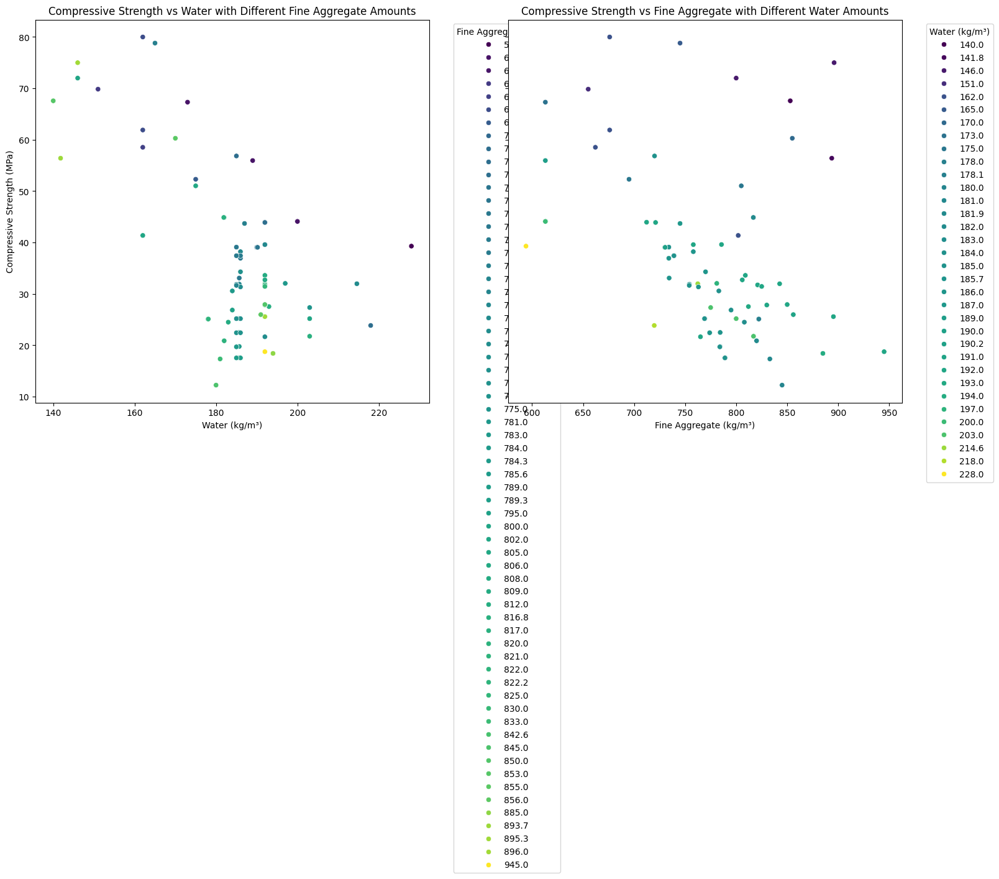

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Charger le fichier Excel
file_path = 'Concrete_Data.xls'  # Remplacez par le chemin de votre fichier
data = pd.read_excel(file_path)

# Renommer les colonnes
new_column_names = {
   'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Blast Furnace Slag (component 2)(kg in a m^3 mixture)': 'Slag (kg/m³)',
    'Fly Ash (component 3)(kg in a m^3 mixture)': 'FlyAsh (kg/m³)',
    'Water  (component 4)(kg in a m^3 mixture)': 'Water (kg/m³)',
    'Superplasticizer (component 5)(kg in a m^3 mixture)': 'Superplasticizer (kg/m³)',
    'Coarse Aggregate  (component 6)(kg in a m^3 mixture)': 'CoarseAggr (kg/m³)',
    'Fine Aggregate (component 7)(kg in a m^3 mixture)': 'FineAggr (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}

data.rename(columns=new_column_names, inplace=True)

# Créer une copie de la base de données
data2 = data.copy()

# Filtrer les données pour Slag et FlyAsh égaux à 0 et Age = 28 jours
filtered_data = data2[(data2['Slag (kg/m³)'] == 0) & (data2['FlyAsh (kg/m³)'] == 0) & (data2['Age (day)'] == 28)]

# Créer les graphiques
fig, axes = plt.subplots(1, 2, figsize=(18, 8), sharey=True)

# Graphique 1: Effet de la Quantité d'Eau
sns.scatterplot(ax=axes[0], data=filtered_data, x='Water (kg/m³)', y='Strength (MPa)', hue='FineAggr (kg/m³)', palette='viridis', legend='full')
axes[0].set_title('Compressive Strength vs Water with Different Fine Aggregate Amounts')
axes[0].set_xlabel('Water (kg/m³)')
axes[0].set_ylabel('Compressive Strength (MPa)')
axes[0].legend(title='Fine Aggregate (kg/m³)', bbox_to_anchor=(1.05, 1), loc='upper left')

# Graphique 2: Effet des Fines Agrégats
sns.scatterplot(ax=axes[1], data=filtered_data, x='FineAggr (kg/m³)', y='Strength (MPa)', hue='Water (kg/m³)', palette='viridis', legend='full')
axes[1].set_title('Compressive Strength vs Fine Aggregate with Different Water Amounts')
axes[1].set_xlabel('Fine Aggregate (kg/m³)')
axes[1].set_ylabel('Compressive Strength (MPa)')
axes[1].legend(title='Water (kg/m³)', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


# **Sensitivity Analysis**

In [ ]:
# Séparer les features et la target
X = data.drop(columns=['Strength (MPa)'])
y = data['Strength (MPa)']

# Séparer la base de données en 80% train et 20% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Créer les variables non normalisées
X_train_non_normalized = X_train.copy()
X_test_non_normalized = X_test.copy()

# Normaliser les données avec StandardScaler
scaler_standard = StandardScaler()
X_train_standard = scaler_standard.fit_transform(X_train)
X_test_standard = scaler_standard.transform(X_test)

# Convertir les données normalisées avec StandardScaler en DataFrame pour une manipulation plus facile
X_train_standard = pd.DataFrame(X_train_standard, columns=X_train.columns)
X_test_standard = pd.DataFrame(X_test_standard, columns=X_test.columns)

# Normaliser les données avec MinMaxScaler
scaler_minmax = MinMaxScaler()
X_train_minmax = scaler_minmax.fit_transform(X_train)
X_test_minmax = scaler_minmax.transform(X_test)

# Convertir les données normalisées avec MinMaxScaler en DataFrame pour une manipulation plus facile
X_train_minmax = pd.DataFrame(X_train_minmax, columns=X_train.columns)
X_test_minmax = pd.DataFrame(X_test_minmax, columns=X_test.columns)

In [ ]:
fixed_params = {
    'hidden_layer_sizes': 58,
    'activation': 'tanh',
    'solver': 'sgd',
    'max_iter': 1000,
    'alpha': 0.0001
}
# Définir le modèle de régression MLP (Multi-layer Perceptron)
model = MLPRegressor(**fixed_params,random_state=42)

# Entraîner le modèle
model.fit(X_train_standard, y_train)

# Faire des prédictions sur l'ensemble de test
y_pred_test_standard = model.predict(X_test_standard)

# Calculez les métriques de performance
mae_test_standard = mean_absolute_error(y_test, y_pred_test_standard)
rmse_test_standard = mean_squared_error(y_test, y_pred_test_standard, squared=False)
r2_test_standard = r2_score(y_test, y_pred_test_standard)

# Faites des prédictions sur l'ensemble d'entraînement normalisé
y_pred_train_standard = model.predict(X_train_standard)

# Calculez les métriques de performance sur l'ensemble d'entraînement
mae_train_standard= mean_absolute_error(y_train, y_pred_train_standard)
rmse_train_standard = mean_squared_error(y_train, y_pred_train_standard, squared=False)
r2_train_standard = r2_score(y_train, y_pred_train_standard)

print("Performance sur l'ensemble de test:")
print("Mean Absolute Error (MAE):", mae_test_standard)
print("Root Mean Squared Error (RMSE):", rmse_test_standard)
print("R-squared (R²):", r2_test_standard)

print("\nPerformance sur l'ensemble d'entraînement:")
print("Mean Absolute Error (MAE):", mae_train_standard)
print("Root Mean Squared Error (RMSE):", rmse_train_standard)
print("R-squared (R²):", r2_train_standard)

In [ ]:
# Define parameters
alpha = 0.0001  # You can adjust this value as needed
solver = 'adam'
neurons_range = range(8, 101)
activations = ['identity', 'logistic', 'tanh', 'relu']

# Dictionary to store results
results = {act: [] for act in activations}

# Compute R² scores for each configuration
for activation in activations:
    for n_neurons in neurons_range:
        mlp = MLPRegressor(hidden_layer_sizes=(n_neurons,),
                           activation=activation,
                           solver=solver,
                           alpha=alpha,
                           max_iter=1000,
                           random_state=42)

        scores = cross_val_score(mlp, X_train_standard, y_train, cv=5, scoring='r2')
        results[activation].append(np.mean(scores))

# Plot the results
plt.figure(figsize=(12, 8))
for activation in activations:
    plt.plot(neurons_range, results[activation], label=activation, marker='o')

plt.xlabel('Number of Neurons')
plt.ylabel('Average R² (Cross-Validation)')
plt.title(f'R² vs Number of Neurons for Different Activation Functions\n(alpha={alpha}, solver={solver})')
plt.legend()
plt.grid(True)

# Add text with fixed parameters (solver and alpha) in the bottom right corner
plt.text(0.95, 0.1, f'solver: {solver}\nalpha: {alpha}',
         fontsize=12, color='black', ha='right', va='bottom', transform=plt.gca().transAxes)

# Save the figure as an image
plt.savefig('mlp_regressor_analysis.png', bbox_inches='tight')

plt.show()

# Print the best results for each activation function
for activation in activations:
    best_score = max(results[activation])
    best_neurons = neurons_range[results[activation].index(best_score)]
    print(f"Best R² for {activation}: {best_score:.4f} with {best_neurons} neurons")


In [ ]:
# Set parameters
alpha = 0.0001  # You can adjust this value as needed
solver = 'lbfgs'
neurons_range = range(1, 101)
activations = ['identity', 'logistic', 'tanh', 'relu']

# Dictionary to store results
results = {act: [] for act in activations}

# Calculate R² scores for each configuration
for activation in activations:
    for n_neurons in neurons_range:
        mlp = MLPRegressor(hidden_layer_sizes=(n_neurons,),
                           activation=activation,
                           solver=solver,
                           alpha=alpha,
                           max_iter=1000,
                           random_state=42)

        scores = cross_val_score(mlp, X_train_standard, y_train, cv=5, scoring='r2')
        results[activation].append(np.mean(scores))

# Plot the results
plt.figure(figsize=(12, 8))
for activation in activations:
    plt.plot(neurons_range, results[activation], label=activation, marker='o')

plt.xlabel('Number of neurons')
plt.ylabel('Mean R²')
plt.title(f'Mean R² vs. Number of Neurons for Different Activation Functions\n(alpha={alpha}, solver={solver})')
plt.legend()
plt.grid(True)

# Add text with fixed parameters (solver and alpha) in the bottom right corner
plt.text(0.95, 0.1, f'solver: {solver}\nalpha: {alpha}',
         fontsize=12, color='black', ha='right', va='bottom', transform=plt.gca().transAxes)

# Save the plot as a .jpg image
plt.savefig('mean_r2_vs_neurons.jpg', format='jpg')

plt.show()

# Display the best results for each activation function
for activation in activations:
    best_score = max(results[activation])
    best_neurons = neurons_range[results[activation].index(best_score)]
    print(f"Best R² for {activation}: {best_score:.4f} with {best_neurons} neurons")


In [ ]:
# Paramètres fixes
alpha = 0.0001  # Utilisez la valeur optimale trouvée précédemment
activation = 'relu'  # Utilisez la meilleure fonction d'activation trouvée
solver = 'lbfgs'
neurons_range = range(8, 51)  # Étendons la plage pour mieux voir l'overfitting

# Listes pour stocker les résultats
train_scores = []
test_scores = []
diff_scores = []

# Calculer les scores R² pour chaque nombre de neurones
for n_neurons in neurons_range:
    mlp = MLPRegressor(hidden_layer_sizes=(n_neurons,),
                       activation=activation,
                       solver=solver,
                       alpha=alpha,
                       max_iter=1000,
                       random_state=42)

    # Entraîner le modèle
    mlp.fit(X_train_standard, y_train)

    # Calculer R² pour l'ensemble d'entraînement
    y_train_pred = mlp.predict(X_train_standard)
    train_r2 = r2_score(y_train, y_train_pred)
    train_scores.append(train_r2)

    # Calculer R² pour l'ensemble de test
    y_test_pred = mlp.predict(X_test_standard)
    test_r2 = r2_score(y_test, y_test_pred)
    test_scores.append(test_r2)

    # Calculer la différence entre les R² d'entraînement et de test
    diff_scores.append(train_r2 - test_r2)

# Tracer les résultats
plt.figure(figsize=(12, 8))

# Tracer les scores R² pour l'ensemble d'entraînement
plt.plot(neurons_range, train_scores, label='Ensemble d\'entraînement', marker='o')

# Tracer les scores R² pour l'ensemble de test
plt.plot(neurons_range, test_scores, label='Ensemble de test', marker='s')

# Tracer la différence entre les scores R²
plt.plot(neurons_range, diff_scores, label='Différence entre train et test', marker='x', linestyle='--')

plt.xlabel('Nombre de neurones')
plt.ylabel('R²')
plt.title(f'R² en fonction du nombre de neurones\n(alpha={alpha}, activation={activation}, solver={solver})')
plt.legend()
plt.grid(True)
plt.show()

# Trouver le nombre optimal de neurones
optimal_neurons = neurons_range[np.argmax(test_scores)]
print(f"Nombre optimal de neurones : {optimal_neurons}")
print(f"Meilleur R² sur l'ensemble de test : {max(test_scores):.4f}")

# Afficher la différence maximale entre les R² d'entraînement et de test
max_diff = max(diff_scores)
print(f"Différence maximale entre train et test R² : {max_diff:.4f}")

In [ ]:
# Set parameters
alpha = 0.0001  # You can adjust this value as needed
solver = 'sgd'
neurons_range = range(1, 101)
activations = ['identity', 'logistic', 'tanh', 'relu']

# Dictionary to store results
results = {act: [] for act in activations}

# Calculate R² scores for each configuration
for activation in activations:
    for n_neurons in neurons_range:
        mlp = MLPRegressor(hidden_layer_sizes=(n_neurons,),
                           activation=activation,
                           solver=solver,
                           alpha=alpha,
                           max_iter=1000,
                           random_state=42)

        scores = cross_val_score(mlp, X_train_standard, y_train, cv=5, scoring='r2')
        results[activation].append(np.mean(scores))

# Plot the results
plt.figure(figsize=(12, 8))
for activation in activations:
    plt.plot(neurons_range, results[activation], label=activation, marker='o')

plt.xlabel('Number of neurons')
plt.ylabel('Mean R² (cross-validation)')
plt.title(f'Mean R² vs. Number of Neurons for Different Activation Functions\n(alpha={alpha}, solver={solver})')
plt.legend()
plt.grid(True)

# Add text with fixed parameters (solver and alpha) in the bottom right corner
plt.text(0.95, 0.1, f'solver: {solver}\nalpha: {alpha}',
         fontsize=12, color='black', ha='right', va='bottom', transform=plt.gca().transAxes)

# Save the plot as a .jpg image
plt.savefig('mean_r2_vs_neurons_sgd.jpg', format='jpg')

plt.show()

# Display the best results for each activation function
for activation in activations:
    best_score = max(results[activation])
    best_neurons = neurons_range[results[activation].index(best_score)]
    print(f"Best R² for {activation}: {best_score:.4f} with {best_neurons} neurons")

In [ ]:
# Paramètres fixes
alpha = 0.0001
activation = 'tanh'
solver = 'sgd'
neurons_range = range(1, 101)  # De 1 à 100 neurones

# Listes pour stocker les résultats
train_scores = []
test_scores = []
train_rmse = []
test_rmse = []

# Calculer les scores R² et RMSE pour chaque nombre de neurones
for n_neurons in neurons_range:
    mlp = MLPRegressor(hidden_layer_sizes=(n_neurons,),
                       activation=activation,
                       solver=solver,
                       alpha=alpha,
                       max_iter=1000,
                       random_state=42)

    mlp.fit(X_train_standard, y_train)

    y_train_pred = mlp.predict(X_train_standard)
    y_test_pred = mlp.predict(X_test_standard)

    train_scores.append(r2_score(y_train, y_train_pred))
    test_scores.append(r2_score(y_test, y_test_pred))
    train_rmse.append(np.sqrt(mean_squared_error(y_train, y_train_pred)))
    test_rmse.append(np.sqrt(mean_squared_error(y_test, y_test_pred)))

# Créer la figure
fig, ax1 = plt.subplots(figsize=(12, 8))

# Tracer R²
ax1.plot(neurons_range, train_scores, label='R² Entraînement', marker='o')
ax1.plot(neurons_range, test_scores, label='R² Test', marker='s')
ax1.set_xlabel('Nombre de neurones')
ax1.set_ylabel('R²')
ax1.legend(loc='upper left')
ax1.grid(True)

# Créer un deuxième axe y pour le RMSE
ax2 = ax1.twinx()

# Tracer RMSE comme des barres
bar_width = 0.4
ax2.bar(np.array(neurons_range) - bar_width/2, train_rmse, bar_width, alpha=0.3, color='blue', label='RMSE Entraînement')
ax2.bar(np.array(neurons_range) + bar_width/2, test_rmse, bar_width, alpha=0.3, color='orange', label='RMSE Test')
ax2.set_ylabel('RMSE')

# Ajuster les limites de l'axe y du RMSE
max_rmse = max(max(train_rmse), max(test_rmse))
ax2.set_ylim(0, max_rmse * 1.1)

# Ajouter une légende pour le RMSE
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.title(f'R² et RMSE en fonction du nombre de neurones\n(alpha={alpha}, activation={activation}, solver={solver})')
plt.tight_layout()
plt.show()

# Trouver le nombre optimal de neurones
optimal_neurons = neurons_range[np.argmax(test_scores)]
print(f"Nombre optimal de neurones : {optimal_neurons}")
print(f"Meilleur R² sur l'ensemble de test : {max(test_scores):.4f}")
print(f"RMSE correspondant sur l'ensemble de test : {test_rmse[np.argmax(test_scores)]:.4f}")

In [ ]:
# Set parameters
alpha = 0.0001
solver = 'sgd'
neurons_range = range(1, 20)
activations = ['identity', 'logistic', 'tanh', 'relu']

# Placeholder for storing results
results = {act: [] for act in activations}
tanh_results = {
    'train_scores': [],
    'test_scores': [],
    'train_rmse': [],
    'test_rmse': []
}

# Calculate R² scores for each configuration
for activation in activations:
    for n_neurons in neurons_range:
        mlp = MLPRegressor(hidden_layer_sizes=(n_neurons,),
                           activation=activation,
                           solver=solver,
                           alpha=alpha,
                           max_iter=1000,
                           random_state=42)

        if activation == 'tanh':
            mlp.fit(X_train_standard, y_train)
            y_train_pred = mlp.predict(X_train_standard)
            y_test_pred = mlp.predict(X_test_standard)

            tanh_results['train_scores'].append(r2_score(y_train, y_train_pred))
            tanh_results['test_scores'].append(r2_score(y_test, y_test_pred))
            tanh_results['train_rmse'].append(np.sqrt(mean_squared_error(y_train, y_train_pred)))
            tanh_results['test_rmse'].append(np.sqrt(mean_squared_error(y_test, y_test_pred)))

        scores = cross_val_score(mlp, X_train_standard, y_train, cv=5, scoring='r2')
        results[activation].append(np.mean(scores))

# Plot the results for different activation functions
plt.figure(figsize=(12, 8))
for activation in activations:
    plt.plot(neurons_range, results[activation], label=activation, marker='o')

plt.xlabel('Number of neurons')
plt.ylabel('Mean R² (cross-validation)')
plt.title(f'Mean R² vs. Number of Neurons for Different Activation Functions\n(alpha={alpha}, solver={solver})')
plt.legend()
plt.grid(True)
plt.show()

# Display the best results for each activation function
for activation in activations:
    best_score = max(results[activation])
    best_neurons = neurons_range[results[activation].index(best_score)]
    print(f"Best R² for {activation}: {best_score:.4f} with {best_neurons} neurons")

# Plot detailed results for 'tanh' activation function
fig, ax1 = plt.subplots(figsize=(12, 8))

# Plot R²
ax1.plot(neurons_range, tanh_results['train_scores'], label='R² Training', marker='o')
ax1.plot(neurons_range, tanh_results['test_scores'], label='R² Test', marker='s')
ax1.set_xlabel('Number of neurons')
ax1.set_ylabel('R²')
ax1.legend(loc='upper left')
ax1.grid(True)

# Create a second y-axis for RMSE
ax2 = ax1.twinx()

# Plot RMSE as bars
bar_width = 0.4
ax2.bar(np.array(neurons_range) - bar_width/2, tanh_results['train_rmse'], bar_width, alpha=0.3, color='blue', label='RMSE Training')
ax2.bar(np.array(neurons_range) + bar_width/2, tanh_results['test_rmse'], bar_width, alpha=0.3, color='orange', label='RMSE Test')
ax2.set_ylabel('RMSE')

# Adjust RMSE y-axis limits
max_rmse = max(max(tanh_results['train_rmse']), max(tanh_results['test_rmse']))
ax2.set_ylim(0, max_rmse * 1.1)

# Add RMSE legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.title(f'R² and RMSE vs. Number of Neurons\n(alpha={alpha}, activation={activation}, solver={solver})')
plt.tight_layout()
plt.show()

# Find the optimal number of neurons for 'tanh'
optimal_neurons = neurons_range[np.argmax(tanh_results['test_scores'])]
print(f"Optimal number of neurons: {optimal_neurons}")
print(f"Best R² on test set: {max(tanh_results['test_scores']):.4f}")
print(f"Corresponding RMSE on test set: {tanh_results['test_rmse'][np.argmax(tanh_results['test_scores'])]:.4f}")


In [ ]:
# Définir les paramètres fixes du modèle
fixed_params = {
    'activation': 'tanh',
    'solver': 'sgd',
    'max_iter': 1000,
    'alpha': 0.0001,
    'random_state': 42
}

# Tailles des couches cachées à comparer
hidden_layer_sizes = [16, 58]

# Dictionnaire pour stocker les résultats
results = {}

for size in hidden_layer_sizes:
    # Mettre à jour les paramètres avec la taille de la couche cachée
    params = fixed_params.copy()
    params['hidden_layer_sizes'] = size

    # Définir le modèle de régression MLP (Multi-layer Perceptron)
    model = MLPRegressor(**params)

    # Entraîner le modèle
    model.fit(X_train_standard, y_train)

    # Faire des prédictions sur l'ensemble de test
    y_pred_test_standard = model.predict(X_test_standard)

    # Calculez les métriques de performance pour l'ensemble de test
    mae_test_standard = mean_absolute_error(y_test, y_pred_test_standard)
    rmse_test_standard = mean_squared_error(y_test, y_pred_test_standard, squared=False)
    r2_test_standard = r2_score(y_test, y_pred_test_standard)

    # Faire des prédictions sur l'ensemble d'entraînement
    y_pred_train_standard = model.predict(X_train_standard)

    # Calculez les métriques de performance pour l'ensemble d'entraînement
    mae_train_standard = mean_absolute_error(y_train, y_pred_train_standard)
    rmse_train_standard = mean_squared_error(y_train, y_pred_train_standard, squared=False)
    r2_train_standard = r2_score(y_train, y_pred_train_standard)

    # Calcul des différences entre ensemble d'entraînement et ensemble de test
    diff_mae = mae_train_standard - mae_test_standard
    diff_rmse = rmse_train_standard - rmse_test_standard
    diff_r2 = r2_train_standard - r2_test_standard

    # Stocker les résultats
    results[size] = {
        'mae_train': mae_train_standard,
        'rmse_train': rmse_train_standard,
        'r2_train': r2_train_standard,
        'mae_test': mae_test_standard,
        'rmse_test': rmse_test_standard,
        'r2_test': r2_test_standard,
        'diff_mae': diff_mae,
        'diff_rmse': diff_rmse,
        'diff_r2': diff_r2
    }

# Affichage des résultats
for size in hidden_layer_sizes:
    print(f"\nPerformance du modèle avec hidden_layer_sizes={size}:")
    print("Ensemble de test:")
    print(f"Mean Absolute Error (MAE): {results[size]['mae_test']:.4f}")
    print(f"Root Mean Squared Error (RMSE): {results[size]['rmse_test']:.4f}")
    print(f"R-squared (R²): {results[size]['r2_test']:.4f}")

    print("\nEnsemble d'entraînement:")
    print(f"Mean Absolute Error (MAE): {results[size]['mae_train']:.4f}")
    print(f"Root Mean Squared Error (RMSE): {results[size]['rmse_train']:.4f}")
    print(f"R-squared (R²): {results[size]['r2_train']:.4f}")

    print("\nDifférences entre ensemble d'entraînement et ensemble de test:")
    print(f"Difference MAE: {results[size]['diff_mae']:.4f}")
    print(f"Difference RMSE: {results[size]['diff_rmse']:.4f}")
    print(f"Difference R²: {results[size]['diff_r2']:.4f}")

# Visualisation des résultats
metrics = ['MAE', 'RMSE', 'R²']
colors = ['b', 'g', 'r']
bar_width = 0.25

train_scores_16 = [results[16]['mae_train'], results[16]['rmse_train'], results[16]['r2_train']]
test_scores_16 = [results[16]['mae_test'], results[16]['rmse_test'], results[16]['r2_test']]
diff_scores_16 = [results[16]['diff_mae'], results[16]['diff_rmse'], results[16]['diff_r2']]

train_scores_58 = [results[58]['mae_train'], results[58]['rmse_train'], results[58]['r2_train']]
test_scores_58 = [results[58]['mae_test'], results[58]['rmse_test'], results[58]['r2_test']]
diff_scores_58 = [results[58]['diff_mae'], results[58]['diff_rmse'], results[58]['diff_r2']]

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

# Modèle avec 16 neurones
axes[0].bar(np.arange(len(metrics)), train_scores_16, bar_width, label='Train', color=colors[0])
axes[0].bar(np.arange(len(metrics)) + bar_width, test_scores_16, bar_width, label='Test', color=colors[1])
axes[0].bar(np.arange(len(metrics)) + 2 * bar_width, diff_scores_16, bar_width, label='Difference', color=colors[2])

axes[0].set_xlabel('Metrics')
axes[0].set_ylabel('Scores')
axes[0].set_title('Performance Metrics Comparison for Model with 16 Neurons')
axes[0].set_xticks(np.arange(len(metrics)) + bar_width)
axes[0].set_xticklabels(metrics)
axes[0].legend()

# Modèle avec 58 neurones
axes[1].bar(np.arange(len(metrics)), train_scores_58, bar_width, label='Train', color=colors[0])
axes[1].bar(np.arange(len(metrics)) + bar_width, test_scores_58, bar_width, label='Test', color=colors[1])
axes[1].bar(np.arange(len(metrics)) + 2 * bar_width, diff_scores_58, bar_width, label='Difference', color=colors[2])

axes[1].set_xlabel('Metrics')
axes[1].set_ylabel('Scores')
axes[1].set_title('Performance Metrics Comparison for Model with 58 Neurons')
axes[1].set_xticks(np.arange(len(metrics)) + bar_width)
axes[1].set_xticklabels(metrics)
axes[1].legend()

plt.tight_layout()
plt.show()

# *BUILDING MODELS*

Performance sur l'ensemble de test:
Mean Absolute Error (MAE): 4.18259470904662
Root Mean Squared Error (RMSE): 5.278846174194025
R-squared (R²): 0.8918577333829851

Performance sur l'ensemble d'entraînement:
Mean Absolute Error (MAE): 3.4310186733339467
Root Mean Squared Error (RMSE): 4.497422234172237
R-squared (R²): 0.9287995908196094


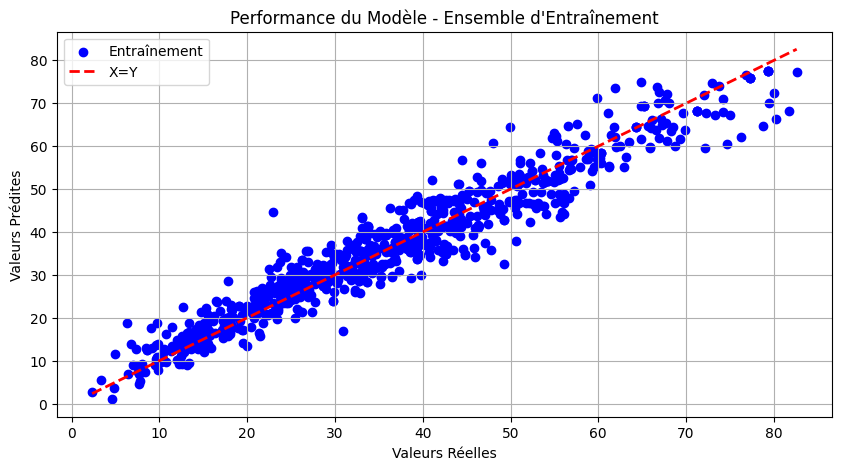

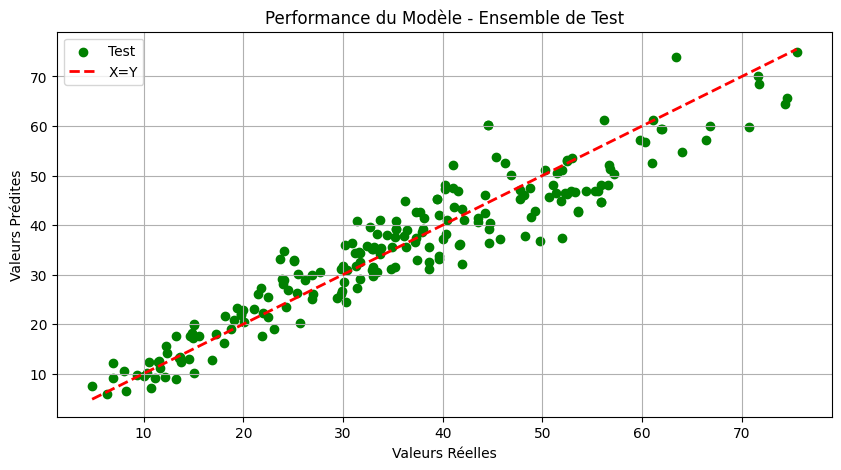

In [ ]:
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPRegressor
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
#load the data
dataset=pd.read_excel("Concrete_Data.xls")
dataset.head()
#renaming all featurses
dataset.columns = ['cement','blastFurnace','flyAsh','water','superplasticizer','courseAggregate','fineaggregate','age','strength']
dataset.head()
x = dataset.drop('strength', axis=1)  # Features (independent variables)
y = dataset['strength']  # Target variable (dependent variable)
# Divisez les données en ensembles de formation et de test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Normalisation des données
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)
fixed_params = {
    'hidden_layer_sizes': 16,
    'activation': 'tanh',
    'solver': 'sgd',
    'max_iter': 5000,
    'alpha': 0.0001
}
# Définir le modèle de régression MLP (Multi-layer Perceptron)
model = MLPRegressor(**fixed_params,random_state=42)

# Entraîner le modèle
model.fit(x_train_scaled, y_train)

# Faire des prédictions sur l'ensemble de test
y_pred_test = model.predict(x_test_scaled)

# Calculez les métriques de performance
mae_test = mean_absolute_error(y_test, y_pred_test)
rmse_test = mean_squared_error(y_test, y_pred_test, squared=False)
r2_test = r2_score(y_test, y_pred_test)

# Faites des prédictions sur l'ensemble d'entraînement normalisé
y_pred_train = model.predict(x_train_scaled)

# Calculez les métriques de performance sur l'ensemble d'entraînement
mae_train = mean_absolute_error(y_train, y_pred_train)
rmse_train = mean_squared_error(y_train, y_pred_train, squared=False)
r2_train = r2_score(y_train, y_pred_train)

print("Performance sur l'ensemble de test:")
print("Mean Absolute Error (MAE):", mae_test)
print("Root Mean Squared Error (RMSE):", rmse_test)
print("R-squared (R²):", r2_test)

print("\nPerformance sur l'ensemble d'entraînement:")
print("Mean Absolute Error (MAE):", mae_train)
print("Root Mean Squared Error (RMSE):", rmse_train)
print("R-squared (R²):", r2_train)





# Plot pour l'ensemble d'entraînement
plt.figure(figsize=(10, 5))
plt.scatter(y_train, y_pred_train, color='blue', label='Entraînement')
plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], color='red', linestyle='--', lw=2, label='X=Y')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')
plt.title("Performance du Modèle - Ensemble d'Entraînement")
plt.legend()
plt.grid(True)
plt.show()

# Plot pour l'ensemble de test
plt.figure(figsize=(10, 5))
plt.scatter(y_test, y_pred_test, color='green', label='Test')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', lw=2, label='X=Y')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')
plt.title("Performance du Modèle - Ensemble de Test")
plt.legend()
plt.grid(True)
plt.show()

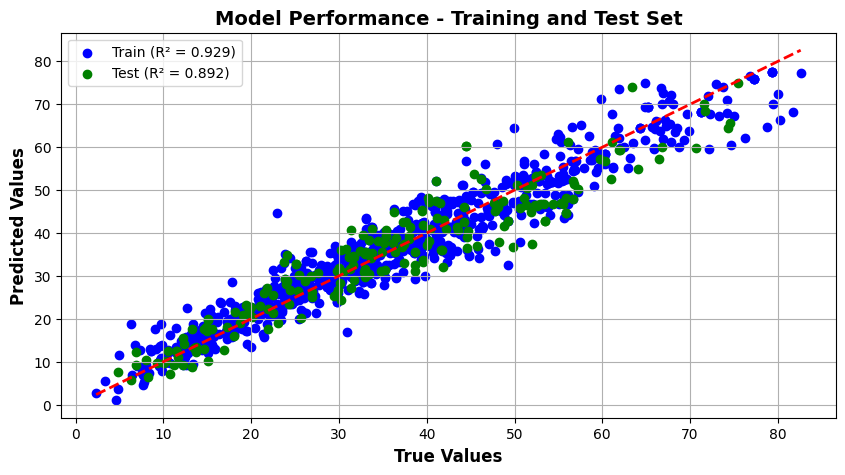

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Supposons que vous ayez déjà les prédictions et les valeurs réelles pour l'entraînement et le test
# y_train, y_pred_train, y_test, y_pred_test

# Calcul des valeurs de R²
r2_train = r2_score(y_train, y_pred_train)
r2_test = r2_score(y_test, y_pred_test)

# Plot pour l'ensemble d'entraînement et de test
plt.figure(figsize=(10, 5))

# Entraînement
plt.scatter(y_train, y_pred_train, color='blue', label=f'Train (R² = {r2_train:.3f})')
plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], color='red', linestyle='--', lw=2)

# Test
plt.scatter(y_test, y_pred_test, color='green', label=f'Test (R² = {r2_test:.3f})')

plt.xlabel('True Values', fontdict={'fontsize': 12, 'fontweight': 'bold'})
plt.ylabel('Predicted Values', fontdict={'fontsize': 12, 'fontweight': 'bold'})
plt.title("Model Performance - Training and Test Set", fontdict={'fontsize': 14, 'fontweight': 'bold'})
plt.legend()
plt.grid(True)
plt.show()


To evaluate the performance of your model specifically for concrete samples with compressive strengths less than 40 MPa and those exceeding 60 MPa, you can analyze the predictions by segmenting your dataset into these two ranges. Here's how you can proceed:

Performance for compressive strength < 40 MPa:
Mean Absolute Error (MAE): 3.175082830848191
Root Mean Squared Error (RMSE): 3.8597842629135135
R-squared (R²): 0.8425316647347092

Performance for compressive strength > 60 MPa:
Mean Absolute Error (MAE): 5.8570589287852615
Root Mean Squared Error (RMSE): 6.978652827460453
R-squared (R²): -0.6988800161648012


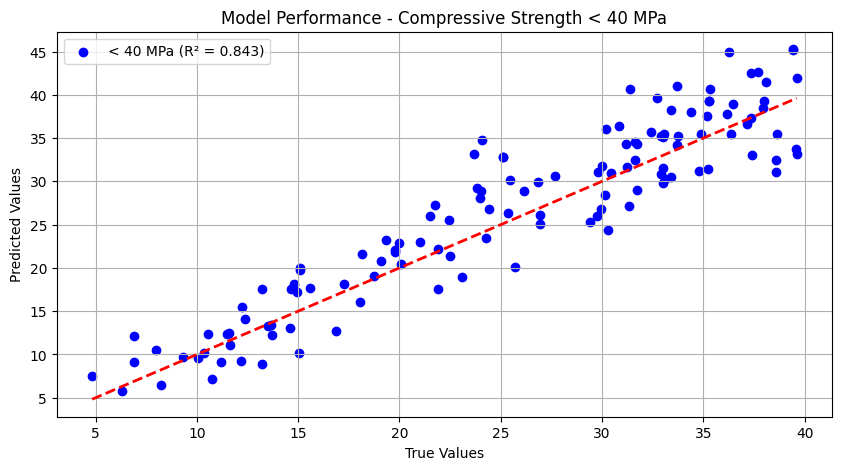

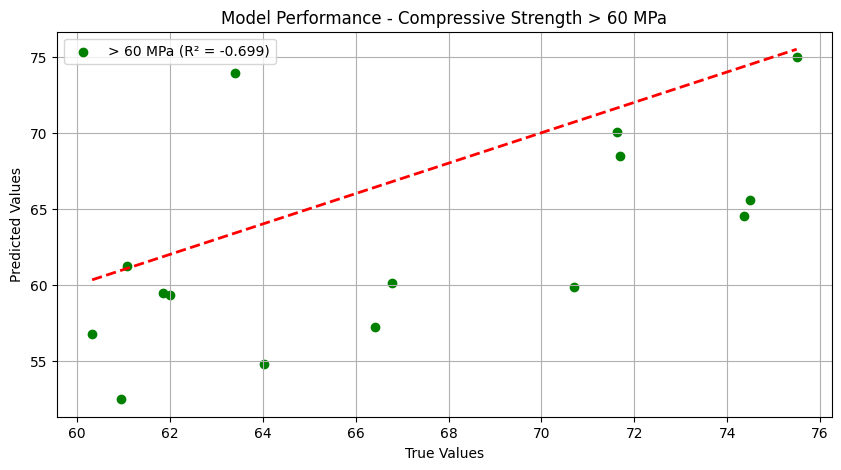

In [ ]:

# For samples with compressive strength < 40 MPa
y_test_below_40 = y_test[y_test < 40]
y_pred_test_below_40 = y_pred_test[y_test < 40]

# For samples with compressive strength > 60 MPa
y_test_above_60 = y_test[y_test > 60]
y_pred_test_above_60 = y_pred_test[y_test > 60]

# Performance metrics for samples with compressive strength < 40 MPa
mae_below_40 = mean_absolute_error(y_test_below_40, y_pred_test_below_40)
rmse_below_40 = mean_squared_error(y_test_below_40, y_pred_test_below_40, squared=False)
r2_below_40 = r2_score(y_test_below_40, y_pred_test_below_40)

# Performance metrics for samples with compressive strength > 60 MPa
mae_above_60 = mean_absolute_error(y_test_above_60, y_pred_test_above_60)
rmse_above_60 = mean_squared_error(y_test_above_60, y_pred_test_above_60, squared=False)
r2_above_60 = r2_score(y_test_above_60, y_pred_test_above_60)

# Print the results
print("Performance for compressive strength < 40 MPa:")
print("Mean Absolute Error (MAE):", mae_below_40)
print("Root Mean Squared Error (RMSE):", rmse_below_40)
print("R-squared (R²):", r2_below_40)

print("\nPerformance for compressive strength > 60 MPa:")
print("Mean Absolute Error (MAE):", mae_above_60)
print("Root Mean Squared Error (RMSE):", rmse_above_60)
print("R-squared (R²):", r2_above_60)

# Plot for compressive strength < 40 MPa
plt.figure(figsize=(10, 5))
plt.scatter(y_test_below_40, y_pred_test_below_40, color='blue', label=f'< 40 MPa (R² = {r2_below_40:.3f})')
plt.plot([min(y_test_below_40), max(y_test_below_40)], [min(y_test_below_40), max(y_test_below_40)], color='red', linestyle='--', lw=2)
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title("Model Performance - Compressive Strength < 40 MPa")
plt.legend()
plt.grid(True)
plt.show()

# Plot for compressive strength > 60 MPa
plt.figure(figsize=(10, 5))
plt.scatter(y_test_above_60, y_pred_test_above_60, color='green', label=f'> 60 MPa (R² = {r2_above_60:.3f})')
plt.plot([min(y_test_above_60), max(y_test_above_60)], [min(y_test_above_60), max(y_test_above_60)], color='red', linestyle='--', lw=2)
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title("Model Performance - Compressive Strength > 60 MPa")
plt.legend()
plt.grid(True)
plt.show()


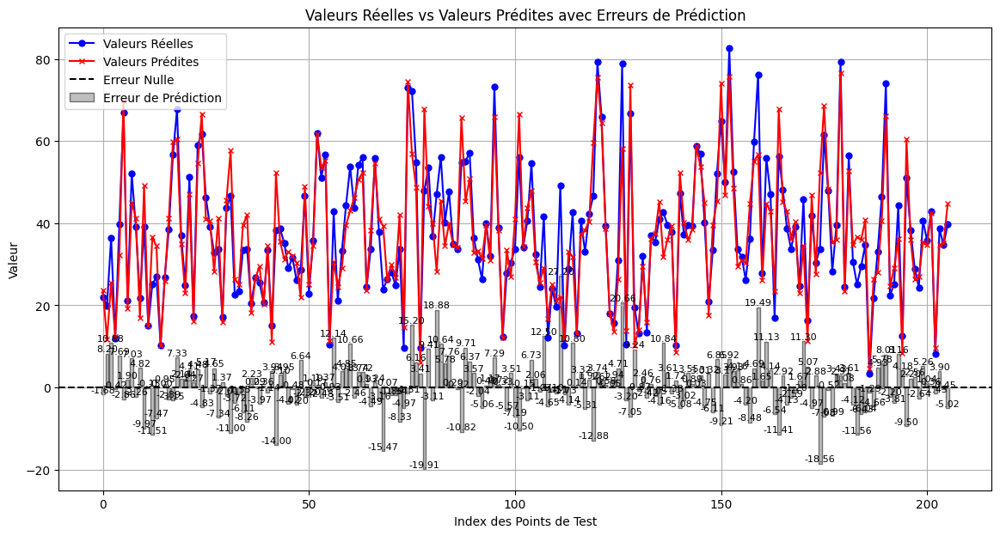

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor

# Charger les données
data = pd.read_excel("Concrete_Data.xls")

# Renommer les colonnes
data.columns = ['cement', 'blastFurnace', 'flyAsh', 'water', 'superplasticizer', 'courseAggregate', 'fineaggregate', 'age', 'strength']

# Séparer les données en caractéristiques et cible
X = data.drop(["strength"], axis=1)
Y = data["strength"]

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.20, random_state=1)

# Standardisation des données
scaler = StandardScaler()
X_train_standardized = scaler.fit_transform(X_train)
X_test_standardized = scaler.transform(X_test)

# Définir et entraîner le modèle MLP
model = MLPRegressor(hidden_layer_sizes=16, activation='tanh', solver='sgd', max_iter=5000, alpha=0.0001, random_state=42)
model.fit(X_train_standardized, Y_train)

# Faire des prédictions sur l'ensemble de test
Y_pred_test = model.predict(X_test_standardized)

# Calculer les erreurs de prédiction
errors = Y_test - Y_pred_test

# Créer le graphique
plt.figure(figsize=(14, 7))

# Courbes des valeurs prédites et réelles
plt.plot(Y_test.values, label='Valeurs Réelles', color='blue', linestyle='-', marker='o', markersize=5)
plt.plot(Y_pred_test, label='Valeurs Prédites', color='red', linestyle='-', marker='x', markersize=5)

# Ajouter l'histogramme des erreurs de prédiction avec ligne horizontale
plt.bar(range(len(errors)), errors, color='gray', edgecolor='black', alpha=0.5, label='Erreur de Prédiction')
plt.axhline(y=0, color='black', linestyle='--', label='Erreur Nulle')

# Ajouter des labels et une légende
plt.xlabel('Index des Points de Test')
plt.ylabel('Valeur')
plt.title('Valeurs Réelles vs Valeurs Prédites avec Erreurs de Prédiction')
plt.legend()
plt.grid(True)

# Afficher les erreurs pour chaque point
for i in range(len(errors)):
    plt.text(i, errors.iloc[i], f'{errors.iloc[i]:.2f}', fontsize=8, ha='center', va='bottom')

plt.show()


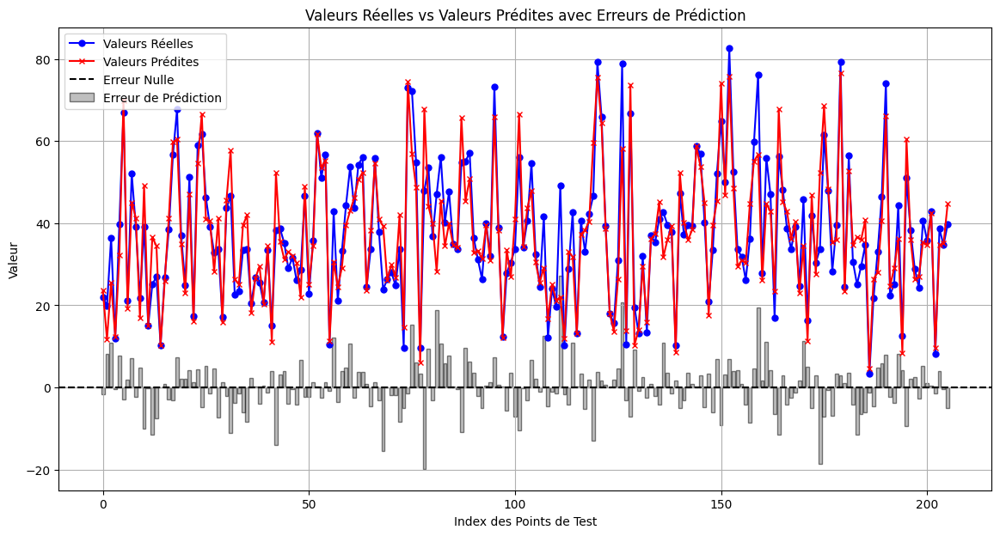

Tableau des Erreurs de Prédiction:
     Index  Valeur Réelle  Valeur Prédite     Erreur
339      0      21.911547       23.591035  -1.679487
244      1      19.932751       11.731250   8.201501
882      2      36.438807       25.558187  10.880620
567      3      11.957582       12.378649  -0.421067
923      4      39.844818       32.150635   7.694183


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor

# Charger les données
data = pd.read_excel("Concrete_Data.xls")

# Renommer les colonnes
data.columns = ['cement', 'blastFurnace', 'flyAsh', 'water', 'superplasticizer', 'courseAggregate', 'fineaggregate', 'age', 'strength']

# Séparer les données en caractéristiques et cible
X = data.drop(["strength"], axis=1)
Y = data["strength"]

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.20, random_state=1)

# Standardisation des données
scaler = StandardScaler()
X_train_standardized = scaler.fit_transform(X_train)
X_test_standardized = scaler.transform(X_test)

# Définir et entraîner le modèle MLP
model = MLPRegressor(hidden_layer_sizes=16, activation='tanh', solver='sgd', max_iter=5000, alpha=0.0001, random_state=42)
model.fit(X_train_standardized, Y_train)

# Faire des prédictions sur l'ensemble de test
Y_pred_test = model.predict(X_test_standardized)

# Calculer les erreurs de prédiction
errors = Y_test - Y_pred_test

# Créer le graphique
plt.figure(figsize=(14, 7))

# Courbes des valeurs prédites et réelles
plt.plot(Y_test.values, label='Valeurs Réelles', color='blue', linestyle='-', marker='o', markersize=5)
plt.plot(Y_pred_test, label='Valeurs Prédites', color='red', linestyle='-', marker='x', markersize=5)

# Ajouter l'histogramme des erreurs de prédiction avec ligne horizontale
plt.bar(range(len(errors)), errors, color='gray', edgecolor='black', alpha=0.5, label='Erreur de Prédiction')
plt.axhline(y=0, color='black', linestyle='--', label='Erreur Nulle')

# Ajouter des labels et une légende
plt.xlabel('Index des Points de Test')
plt.ylabel('Valeur')
plt.title('Valeurs Réelles vs Valeurs Prédites avec Erreurs de Prédiction')
plt.legend()
plt.grid(True)

# Supprimer les annotations des erreurs pour une meilleure visibilité
# Ajouter une ligne horizontale pour l'erreur nulle
plt.axhline(y=0, color='black', linestyle='--')

plt.show()

# Afficher les erreurs dans un tableau
error_df = pd.DataFrame({
    'Index': range(len(errors)),
    'Valeur Réelle': Y_test,
    'Valeur Prédite': Y_pred_test,
    'Erreur': errors
})

print("Tableau des Erreurs de Prédiction:")
print(error_df.head())


Summary of Mean Absolute Errors:
  Strength Interval  Mean Absolute Error
0           <20 MPa             2.628709
1         20-40 MPa             3.818899
2           >40 MPa             6.944909


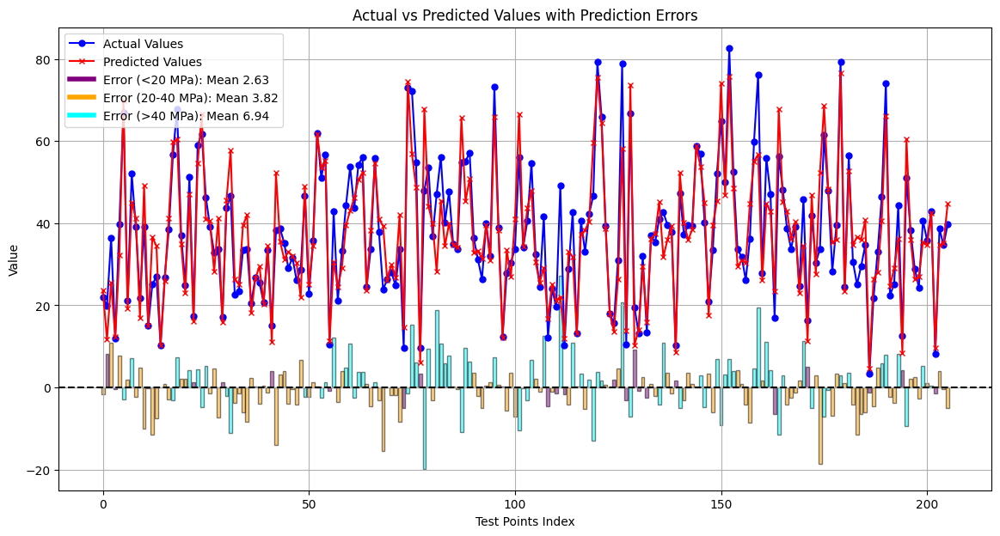

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor
from matplotlib.lines import Line2D

# Load the data
data = pd.read_excel("Concrete_Data.xls")

# Rename the columns
data.columns = ['cement', 'blastFurnace', 'flyAsh', 'water', 'superplasticizer', 'courseAggregate', 'fineaggregate', 'age', 'strength']

# Separate features and target
X = data.drop(["strength"], axis=1)
Y = data["strength"]

# Split the data into training and test sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.20, random_state=1)

# Standardize the data
scaler = StandardScaler()
X_train_standardized = scaler.fit_transform(X_train)
X_test_standardized = scaler.transform(X_test)

# Define and train the MLP model
model = MLPRegressor(hidden_layer_sizes=16, activation='tanh', solver='sgd', max_iter=5000, alpha=0.0001, random_state=42)
model.fit(X_train_standardized, Y_train)

# Make predictions on the test set
Y_pred_test = model.predict(X_test_standardized)

# Calculate prediction errors
errors = Y_test - Y_pred_test

# Calculate absolute errors
abs_errors = np.abs(errors)

# Calculate mean absolute errors for each interval
mean_abs_error_low = abs_errors[Y_test < 20].mean()
mean_abs_error_mid = abs_errors[(Y_test >= 20) & (Y_test <= 40)].mean()
mean_abs_error_high = abs_errors[Y_test > 40].mean()

# Create the plot
plt.figure(figsize=(14, 7))

# Plot actual and predicted values
plt.plot(Y_test.values, label='Actual Values', color='blue', linestyle='-', marker='o', markersize=5)
plt.plot(Y_pred_test, label='Predicted Values', color='red', linestyle='-', marker='x', markersize=5)

# Add the prediction error histogram with different colors for intervals
colors = np.where(Y_test < 20, 'purple', np.where(Y_test <= 40, 'orange', 'cyan'))

# Add the prediction error histogram
bars = plt.bar(range(len(errors)), errors, color=colors, edgecolor='black', alpha=0.5, label='Prediction Error')
plt.axhline(y=0, color='black', linestyle='--', label='Zero Error')

# Add labels and legend
plt.xlabel('Test Points Index')
plt.ylabel('Value')
plt.title('Actual vs Predicted Values with Prediction Errors')

# Create custom legend elements for colors
legend_elements = [
    Line2D([0], [0], color='blue', linestyle='-', marker='o', markersize=5, label='Actual Values'),
    Line2D([0], [0], color='red', linestyle='-', marker='x', markersize=5, label='Predicted Values'),
    Line2D([0], [0], color='purple', lw=4, label=f'Error (<20 MPa): Mean {mean_abs_error_low:.2f}'),
    Line2D([0], [0], color='orange', lw=4, label=f'Error (20-40 MPa): Mean {mean_abs_error_mid:.2f}'),
    Line2D([0], [0], color='cyan', lw=4, label=f'Error (>40 MPa): Mean {mean_abs_error_high:.2f}')
]

plt.legend(handles=legend_elements)
plt.grid(True)

# Create a DataFrame for the mean errors
error_summary = pd.DataFrame({
    'Strength Interval': ['<20 MPa', '20-40 MPa', '>40 MPa'],
    'Mean Absolute Error': [mean_abs_error_low, mean_abs_error_mid, mean_abs_error_high]
})

print("Summary of Mean Absolute Errors:")
print(error_summary)

plt.show()


In [ ]:
# Calculate the overall MAE
overall_mae = mean_absolute_error(Y_test, Y_pred_test)

# Calculate the percentage MAE
mean_actual = Y_test.mean()
mae_percentage = (overall_mae / mean_actual) * 100

# Print the results
print(f"Overall Mean Absolute Error (MAE): {overall_mae:.2f} MPa")
print(f"Mean Absolute Error as Percentage: {mae_percentage:.2f}%")

# Optional: Add this information to your plot
plt.figtext(0.15, 0.85, f'Overall MAE: {overall_mae:.2f} MPa\nMAE as Percentage: {mae_percentage:.2f}%', bbox={"facecolor":"orange", "alpha":0.5, "pad":5})


Overall Mean Absolute Error (MAE): 4.82 MPa
Mean Absolute Error as Percentage: 12.86%


Text(0.15, 0.85, 'Overall MAE: 4.82 MPa\nMAE as Percentage: 12.86%')

<Figure size 640x480 with 0 Axes>

In [ ]:
# Calculate the average compressive strength within each interval
avg_strength_low = Y_test[Y_test < 20].mean()
avg_strength_mid = Y_test[(Y_test >= 20) & (Y_test <= 40)].mean()
avg_strength_high = Y_test[Y_test > 40].mean()

# Calculate the mean absolute error as a percentage of the average compressive strength
mean_abs_error_low_pct = (mean_abs_error_low / avg_strength_low) * 100
mean_abs_error_mid_pct = (mean_abs_error_mid / avg_strength_mid) * 100
mean_abs_error_high_pct = (mean_abs_error_high / avg_strength_high) * 100

# Create a DataFrame for the percentage errors
error_percentage_summary = pd.DataFrame({
    'Strength Interval': ['<20 MPa', '20-40 MPa', '>40 MPa'],
    'Mean Absolute Error (%)': [mean_abs_error_low_pct, mean_abs_error_mid_pct, mean_abs_error_high_pct]
})

print("Summary of Mean Absolute Errors (as percentage of average strength):")
print(error_percentage_summary)


Summary of Mean Absolute Errors (as percentage of average strength):
  Strength Interval  Mean Absolute Error (%)
0           <20 MPa                19.589167
1         20-40 MPa                12.172191
2           >40 MPa                12.803075


In [ ]:
# Calculate relative errors
relative_errors = abs_errors / Y_test * 100

# Calculate mean relative errors for each interval
mean_rel_error_low = relative_errors[Y_test < 20].mean()
mean_rel_error_mid = relative_errors[(Y_test >= 20) & (Y_test <= 40)].mean()
mean_rel_error_high = relative_errors[Y_test > 40].mean()

error_summary = pd.DataFrame({
    'Strength Interval': ['<20 MPa', '20-40 MPa', '>40 MPa'],
    'Mean Absolute Error': [mean_abs_error_low, mean_abs_error_mid, mean_abs_error_high],
    'Mean Relative Error (%)': [mean_rel_error_low, mean_rel_error_mid, mean_rel_error_high]
})

print("Summary of Errors:")
print(error_summary.to_string(index=False))

legend_elements = [
    Line2D([0], [0], color='blue', linestyle='-', marker='o', markersize=5, label='Actual Values'),
    Line2D([0], [0], color='red', linestyle='-', marker='x', markersize=5, label='Predicted Values'),
    Line2D([0], [0], color='purple', lw=4, label=f'Error (<20 MPa): {mean_rel_error_low:.2f}%'),
    Line2D([0], [0], color='orange', lw=4, label=f'Error (20-40 MPa): {mean_rel_error_mid:.2f}%'),
    Line2D([0], [0], color='cyan', lw=4, label=f'Error (>40 MPa): {mean_rel_error_high:.2f}%')
]

Summary of Errors:
Strength Interval  Mean Absolute Error  Mean Relative Error (%)
          <20 MPa             2.628709                20.013999
        20-40 MPa             3.818899                12.525102
          >40 MPa             6.944909                13.154231


<ipython-input-10-b4d9723a3d3d>:75: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, orientation='horizontal', label='Importance (%)')


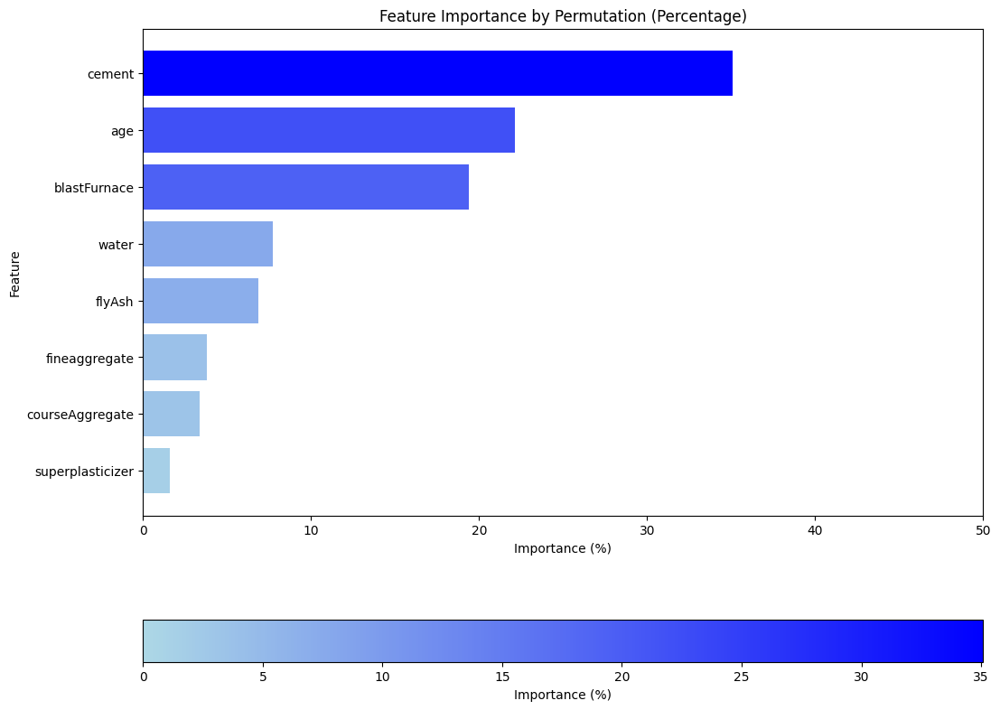

cement: 35.08%
age: 22.15%
blastFurnace: 19.42%
water: 7.71%
flyAsh: 6.87%
fineaggregate: 3.80%
courseAggregate: 3.35%
superplasticizer: 1.62%


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Charger les données
data = pd.read_excel("Concrete_Data.xls")

# Renommer les colonnes
data.columns = ['cement', 'blastFurnace', 'flyAsh', 'water', 'superplasticizer', 'courseAggregate', 'fineaggregate', 'age', 'strength']

# Séparer les données en caractéristiques et cible
X = data.drop(["strength"], axis=1)
Y = data["strength"]

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.20, random_state=1)

# Standardisation des données
scaler = StandardScaler()
X_train_standardized = scaler.fit_transform(X_train)
X_test_standardized = scaler.transform(X_test)

# Définir et entraîner le modèle MLP
model = MLPRegressor(hidden_layer_sizes=16, activation='tanh', solver='sgd', max_iter=5000, alpha=0.0001, random_state=42)
model.fit(X_train_standardized, Y_train)

# Faire des prédictions sur l'ensemble de test
Y_pred_test = model.predict(X_test_standardized)

# Importance des caractéristiques par permutation
result = permutation_importance(model, X_test_standardized, Y_test, n_repeats=10, random_state=42, scoring='neg_mean_squared_error')

# Extraire les résultats
feature_importances = result.importances_mean
features = X.columns

# Calculer les importances en pourcentage
total_importance = np.sum(feature_importances)
feature_importances_percent = (feature_importances / total_importance) * 100

# Trier les résultats
indices = np.argsort(feature_importances_percent)[::-1]

# Créer une colormap personnalisée
def custom_colormap():
    colors = ["lightblue", "blue"]  # Couleurs pour la dégradation
    cmap = mcolors.LinearSegmentedColormap.from_list("custom_blue", colors)
    return cmap

# Créer le graphique
plt.figure(figsize=(12, 10))
plt.title("Feature Importance by Permutation (Percentage)")

# Créer une colormap personnalisée
cmap = custom_colormap()
norm = plt.Normalize(vmin=0, vmax=max(feature_importances_percent))

# Ajouter les barres horizontales avec dégradé
bars = plt.barh(range(X.shape[1]), feature_importances_percent[indices], color=cmap(norm(feature_importances_percent[indices])), align="center")
plt.yticks(range(X.shape[1]), features[indices])
plt.xlim([0, 50])
plt.xlabel("Importance (%)")
plt.ylabel("Feature")
plt.gca().invert_yaxis()  # Inverser l'axe y pour avoir les caractéristiques les plus importantes en haut

# Ajouter une barre de couleur
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
plt.colorbar(sm, orientation='horizontal', label='Importance (%)')

plt.show()

# Afficher les importances en pourcentage
for feature, importance in zip(features[indices], feature_importances_percent[indices]):
    print(f'{feature}: {importance:.2f}%')


In [ ]:
import matplotlib.pyplot as plt

# Calculer la sensibilité
def calculate_sensitivity(model, X, y, feature_names):
    sensitivities = []
    base_preds = model.predict(X)
    base_error = mean_absolute_error(y, base_preds)

    for i, feature in enumerate(feature_names):
        X_modified = X.copy()
        X_modified[:, i] += X[:, i].std()  # Perturbation de la caractéristique
        modified_preds = model.predict(X_modified)
        modified_error = mean_absolute_error(y, modified_preds)
        sensitivity = (modified_error - base_error) / base_error
        sensitivities.append(sensitivity)

    sensitivity_df = pd.DataFrame({
        'Feature': feature_names,
        'Sensitivity (%)': 100 * np.array(sensitivities)
    }).sort_values(by='Sensitivity (%)', ascending=False)

    return sensitivity_df

# Calculer la sensibilité des caractéristiques
sensitivity_df = calculate_sensitivity(model, X_test_standardized, Y_test, X.columns)

# Tracer le graphique de sensibilité
plt.figure(figsize=(10, 8))
plt.barh(sensitivity_df['Feature'], sensitivity_df['Sensitivity (%)'], color='teal')
plt.xlabel('Sensitivity (%)')
plt.ylabel('Feature')
plt.title('Feature Sensitivity Analysis')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from math import pi

# Data from the table
metrics = ['MAE', 'RMSE', 'R²']
models = ['DT', 'SVM', 'ANN_MLP', 'RF', 'XGBoost']
values = {
    'MAE': [4.636, 4.473, 3.648, 3.358, 3.231],
    'RMSE': [7.272, 6.714, 5.13, 5.058, 4.746],
    'R²': [0.797, 0.827, 0.897, 0.902, 0.913]
}

# Create a figure with subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6), subplot_kw=dict(polar=True))

for i, metric in enumerate(metrics):
    values_list = values[metric]

    # Number of variables (i.e., models)
    num_vars = len(models)

    # Compute angle of each axis
    angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
    angles += angles[:1]  # To complete the circle

    # Create the radar chart in the subplot
    ax = axs[i]

    # Draw one axe per variable and add labels
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(models)

    # Draw y-labels (scaled according to metric range)
    if metric == 'R²':
        yticks = np.arange(0, 1.1, step=0.2)
        ax.set_yticks(yticks)
        ax.set_yticklabels([f'{i:.1f}' for i in yticks], color="grey", size=7)
        ax.set_ylim(0, 1)
    else:
        max_value = max(values_list)
        yticks = np.arange(0, max_value + max_value/4, step=max_value/4)
        ax.set_yticks(yticks)
        ax.set_yticklabels([f'{round(i, 2)}' for i in yticks], color="grey", size=7)
        ax.set_ylim(0, max_value)

    # Plot data
    values_list += values_list[:1]  # To complete the circle
    ax.plot(angles, values_list, linewidth=2, linestyle='solid', label=metric)
    ax.fill(angles, values_list, 'b', alpha=0.1)

    # Add a title
    ax.set_title(f' {metric}', size=15, color='blue', y=1.1)

# Adjust layout and save the figure
plt.tight_layout()
plt.savefig('/mnt/data/radar_charts_side_by_side_fixed.png')
plt.show()


# **Étude de cas : Béton 25 MPa**

In [ ]:
def predict_strength(model, scaler, inputs):
    scaled_inputs = scaler.transform([inputs])
    return model.predict(scaled_inputs)[0]

# Exemple d'utilisation :
# strength = predict_strength(model, scaler, [cement, blast_furnace, fly_ash, water, superplasticizer, coarse_aggregate, fine_aggregate, age])

In [ ]:
import random

def generate_random_composition():
    return [
        random.uniform(100, 500),  # cement
        random.uniform(0, 200),    # blast_furnace
        random.uniform(0, 200),    # fly_ash
        random.uniform(100, 250),  # water
        random.uniform(0, 30),     # superplasticizer
        random.uniform(700, 1200), # coarse_aggregate
        random.uniform(600, 1000), # fine_aggregate
        random.uniform(1, 365)     # age
    ]

num_samples = 100000
compositions = [generate_random_composition() for _ in range(num_samples)]
strengths = [predict_strength(model, scaler, comp) for comp in compositions]

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packag

In [ ]:
target_strength = 33
tolerance = 1  # MPa

close_compositions = [(comp, strength) for comp, strength in zip(compositions, strengths) if abs(strength - target_strength) <= tolerance]

print(f"Nombre de compositions proches de 25 MPa: {len(close_compositions)}")

Nombre de compositions proches de 25 MPa: 1944


In [ ]:
# Target strength range: 33 to 35 MPa
min_strength = 33
max_strength = 35

# Filter compositions that have strengths within the specified range
close_compositions = [(comp, strength) for comp, strength in zip(compositions, strengths) if min_strength <= strength <= max_strength]

# Print the number of compositions that fall within the specified range
print(f"Nombre de compositions avec une résistance entre {min_strength} et {max_strength} MPa: {len(close_compositions)}")

Nombre de compositions avec une résistance entre 33 et 35 MPa: 2039


In [ ]:
def evaluate_composition(composition, strength):
    cement = composition[0]
    age = composition[7]
    cost = cement * 0.1  # Supposons que le ciment coûte 0.1 unité par kg
    return cost, age, abs(strength - target_strength)

best_scenario = min(close_compositions, key=lambda x: evaluate_composition(*x)[0])
worst_scenario = max(close_compositions, key=lambda x: evaluate_composition(*x)[0])

print("Meilleur scénario:")
print(f"Composition: {best_scenario[0]}")
print(f"Résistance prédite: {best_scenario[1]:.2f} MPa")
print(f"Coût estimé: {evaluate_composition(*best_scenario)[0]:.2f}")
print(f"Âge: {best_scenario[0][7]:.0f} jours")

print("\nPire scénario:")
print(f"Composition: {worst_scenario[0]}")
print(f"Résistance prédite: {worst_scenario[1]:.2f} MPa")
print(f"Coût estimé: {evaluate_composition(*worst_scenario)[0]:.2f}")
print(f"Âge: {worst_scenario[0][7]:.0f} jours")

Meilleur scénario:
Composition: [100.09077658963888, 6.172360994658854, 138.706026828423, 105.30857040341482, 22.416407356222877, 807.662043608482, 601.4005123053274, 224.68253322571363]
Résistance prédite: 32.05 MPa
Coût estimé: 10.01
Âge: 225 jours

Pire scénario:
Composition: [499.80040235123977, 97.03720945345972, 139.3838794774581, 109.5386971957598, 6.799557432106138, 856.8026445311096, 623.9928270044549, 14.313373504364439]
Résistance prédite: 32.59 MPa
Coût estimé: 49.98
Âge: 14 jours


In [ ]:
import random
import numpy as np

def generate_composition(use_additives=True):
    cement = random.uniform(300, 450)  # kg/m³
    water = random.uniform(cement * 0.45, cement * 0.55)  # Pour respecter le rapport W/C

    if use_additives:
        slag = random.uniform(0, 200)
        fly_ash = random.uniform(0, 200)
        superplasticizer = random.uniform(0, 10)
    else:
        slag = fly_ash = superplasticizer = 0

    coarse_aggregate = random.uniform(700, 1200)
    fine_aggregate = random.uniform(600, 1000)

    return [cement, slag, fly_ash, water, superplasticizer, coarse_aggregate, fine_aggregate, 28]

def evaluate_composition(composition, strength):
    cement, slag, fly_ash, water, superplasticizer, _, _, _ = composition
    total_binder = cement + slag + fly_ash
    w_c_ratio = water / total_binder
    cost = cement * 0.1 + slag * 0.05 + fly_ash * 0.05 + superplasticizer * 2  # Coûts estimés
    co2 = cement * 0.9 + slag * 0.1 + fly_ash * 0.1  # Émissions de CO2 estimées
    return cost, w_c_ratio, co2, abs(strength - 30)  # 30 MPa est la résistance moyenne visée

# Génération des compositions
num_samples = 10000
compositions_with_additives = [generate_composition(True) for _ in range(num_samples)]
compositions_without_additives = [generate_composition(False) for _ in range(num_samples)]

# Prédiction des résistances
strengths_with_additives = [predict_strength(model, scaler, comp) for comp in compositions_with_additives]
strengths_without_additives = [predict_strength(model, scaler, comp) for comp in compositions_without_additives]

# Filtrage des compositions valides
valid_compositions_with_additives = [(comp, strength) for comp, strength in zip(compositions_with_additives, strengths_with_additives)
                                     if 29 <= strength <= 31 and 0.45 <= comp[3]/sum(comp[:3]) <= 0.55]

valid_compositions_without_additives = [(comp, strength) for comp, strength in zip(compositions_without_additives, strengths_without_additives)
                                        if 29 <= strength <= 31 and 0.45 <= comp[3]/comp[0] <= 0.55]

# Trouver les meilleurs scénarios
best_with_additives = min(valid_compositions_with_additives, key=lambda x: evaluate_composition(*x)[0])
best_without_additives = min(valid_compositions_without_additives, key=lambda x: evaluate_composition(*x)[0])

# Affichage des résultats
print("Meilleur scénario avec additifs:")
print(f"Composition: {best_with_additives[0]}")
print(f"Résistance prédite: {best_with_additives[1]:.2f} MPa")
cost, w_c_ratio, co2, _ = evaluate_composition(*best_with_additives)
print(f"Coût estimé: {cost:.2f}")
print(f"Rapport W/C: {w_c_ratio:.2f}")
print(f"Émissions de CO2 estimées: {co2:.2f}")

print("\nMeilleur scénario sans additifs:")
print(f"Composition: {best_without_additives[0]}")
print(f"Résistance prédite: {best_without_additives[1]:.2f} MPa")
cost, w_c_ratio, co2, _ = evaluate_composition(*best_without_additives)
print(f"Coût estimé: {cost:.2f}")
print(f"Rapport W/C: {w_c_ratio:.2f}")
print(f"Émissions de CO2 estimées: {co2:.2f}")

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packag

Meilleur scénario avec additifs:
Composition: [357.07539574335976, 9.326697892914716, 20.856255039285454, 184.923950368003, 0.6622492027989568, 865.4735176398634, 918.0118792752348, 28]
Résistance prédite: 30.87 MPa
Coût estimé: 38.54
Rapport W/C: 0.48
Émissions de CO2 estimées: 324.39

Meilleur scénario sans additifs:
Composition: [300.13795416733706, 0, 0, 154.08988170456806, 0, 871.2743544015827, 885.9428698888914, 28]
Résistance prédite: 29.34 MPa
Coût estimé: 30.01
Rapport W/C: 0.51
Émissions de CO2 estimées: 270.12


In [ ]:
import random
import numpy as np

def generate_composition(use_additives=True):
    cement = random.uniform(300, 450)  # kg/m³
    water = random.uniform(cement * 0.45, cement * 0.55)  # Pour respecter le rapport W/C

    if use_additives:
        slag = random.uniform(0, 200)
        fly_ash = random.uniform(0, 200)
        superplasticizer = random.uniform(0, 10)
    else:
        slag = fly_ash = superplasticizer = 0

    coarse_aggregate = random.uniform(700, 1200)
    fine_aggregate = random.uniform(600, 1000)

    return [cement, slag, fly_ash, water, superplasticizer, coarse_aggregate, fine_aggregate, 28]

def evaluate_composition(composition, strength):
    cement, slag, fly_ash, water, superplasticizer, _, _, _ = composition
    total_binder = cement + slag + fly_ash
    w_c_ratio = water / total_binder
    cost = cement * 0.1 + slag * 0.05 + fly_ash * 0.05 + superplasticizer * 2  # Coûts estimés
    co2 = cement * 0.9 + slag * 0.1 + fly_ash * 0.1  # Émissions de CO2 estimées
    return cost, w_c_ratio, co2, abs(strength - 30)  # 30 MPa est la résistance moyenne visée

# Génération des compositions
num_samples = 10000
compositions_with_additives = [generate_composition(True) for _ in range(num_samples)]
compositions_without_additives = [generate_composition(False) for _ in range(num_samples)]

# Prédiction des résistances
strengths_with_additives = [predict_strength(model, scaler, comp) for comp in compositions_with_additives]
strengths_without_additives = [predict_strength(model, scaler, comp) for comp in compositions_without_additives]

# Filtrage des compositions valides
valid_compositions_with_additives = [(comp, strength) for comp, strength in zip(compositions_with_additives, strengths_with_additives)
                                     if 29 <= strength <= 31 and 0.45 <= comp[3]/sum(comp[:3]) <= 0.55]

valid_compositions_without_additives = [(comp, strength) for comp, strength in zip(compositions_without_additives, strengths_without_additives)
                                        if 29 <= strength <= 31 and 0.45 <= comp[3]/comp[0] <= 0.55]

# Trouver les meilleurs scénarios
best_with_additives = min(valid_compositions_with_additives, key=lambda x: evaluate_composition(*x)[0])
best_without_additives = min(valid_compositions_without_additives, key=lambda x: evaluate_composition(*x)[0])

# Affichage des résultats
print("Meilleur scénario avec additifs:")
print(f"Composition: {best_with_additives[0]}")
print(f"Résistance prédite: {best_with_additives[1]:.2f} MPa")
cost, w_c_ratio, co2, _ = evaluate_composition(*best_with_additives)
print(f"Coût estimé: {cost:.2f}")
print(f"Rapport W/C: {w_c_ratio:.2f}")
print(f"Émissions de CO2 estimées: {co2:.2f}")

print("\nMeilleur scénario sans additifs:")
print(f"Composition: {best_without_additives[0]}")
print(f"Résistance prédite: {best_without_additives[1]:.2f} MPa")
cost, w_c_ratio, co2, _ = evaluate_composition(*best_without_additives)
print(f"Coût estimé: {cost:.2f}")
print(f"Rapport W/C: {w_c_ratio:.2f}")
print(f"Émissions de CO2 estimées: {co2:.2f}")

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packag

Meilleur scénario avec additifs:
Composition: [325.8318247429711, 0.054400047458691425, 13.649499709248246, 163.20243850689363, 0.263142143219518, 780.5705405705847, 974.9486627899178, 28]
Résistance prédite: 30.47 MPa
Coût estimé: 33.79
Rapport W/C: 0.48
Émissions de CO2 estimées: 294.62

Meilleur scénario sans additifs:
Composition: [300.0156652752121, 0, 0, 153.8404916452834, 0, 827.8630107098626, 996.1428981064446, 28]
Résistance prédite: 30.31 MPa
Coût estimé: 30.00
Rapport W/C: 0.51
Émissions de CO2 estimées: 270.01


In [ ]:
import random
import numpy as np

def generate_composition(scenario):
    cement = random.uniform(300, 450)  # kg/m³
    water = random.uniform(cement * 0.45, cement * 0.55)  # Pour respecter le rapport W/C

    if scenario == "all_additives":
        slag = random.uniform(0, 200)
        fly_ash = random.uniform(0, 200)
    elif scenario == "only_slag":
        slag = random.uniform(0, 200)
        fly_ash = 0
    elif scenario == "only_fly_ash":
        slag = 0
        fly_ash = random.uniform(0, 200)
    else:  # no_additives
        slag = fly_ash = 0

    superplasticizer = random.uniform(0, 10) if scenario != "no_additives" else 0
    coarse_aggregate = random.uniform(700, 1200)
    fine_aggregate = random.uniform(600, 1000)

    return [cement, slag, fly_ash, water, superplasticizer, coarse_aggregate, fine_aggregate, 28]

def evaluate_composition(composition, strength):
    cement, slag, fly_ash, water, superplasticizer, _, _, _ = composition
    total_binder = cement + slag + fly_ash
    w_c_ratio = water / total_binder
    cost = cement * 0.1 + slag * 0.05 + fly_ash * 0.05 + superplasticizer * 2  # Coûts estimés
    co2 = cement * 0.9 + slag * 0.1 + fly_ash * 0.1  # Émissions de CO2 estimées
    return cost, w_c_ratio, co2, abs(strength - 30)  # 30 MPa est la résistance moyenne visée

# Génération des compositions
num_samples = 10000
scenarios = ["all_additives", "only_slag", "only_fly_ash", "no_additives"]
all_compositions = {scenario: [generate_composition(scenario) for _ in range(num_samples)] for scenario in scenarios}

# Prédiction des résistances
all_strengths = {scenario: [predict_strength(model, scaler, comp) for comp in compositions]
                 for scenario, compositions in all_compositions.items()}

# Filtrage des compositions valides
valid_compositions = {scenario: [(comp, strength) for comp, strength in zip(all_compositions[scenario], all_strengths[scenario])
                                 if 29 <= strength <= 31 and 0.45 <= comp[3]/sum(comp[:3]) <= 0.55]
                      for scenario in scenarios}

# Affichage des résultats pour chaque scénario
for scenario in scenarios:
    print(f"\nScénario: {scenario}")
    print(f"Nombre de compositions valides: {len(valid_compositions[scenario])}")

    if valid_compositions[scenario]:
        best_composition = min(valid_compositions[scenario], key=lambda x: evaluate_composition(*x)[0])
        worst_composition = max(valid_compositions[scenario], key=lambda x: x[0])  # Basé sur la quantité de ciment

        print("\nMeilleur scénario:")
        print(f"Composition: {best_composition[0]}")
        print(f"Résistance prédite: {best_composition[1]:.2f} MPa")
        cost, w_c_ratio, co2, _ = evaluate_composition(*best_composition)
        print(f"Coût estimé: {cost:.2f}")
        print(f"Rapport W/C: {w_c_ratio:.2f}")
        print(f"Émissions de CO2 estimées: {co2:.2f}")
        print(f"Quantité de ciment: {best_composition[0][0]:.2f} kg/m³")

        print("\nPire scénario (basé sur la quantité de ciment):")
        print(f"Composition: {worst_composition[0]}")
        print(f"Résistance prédite: {worst_composition[1]:.2f} MPa")
        cost, w_c_ratio, co2, _ = evaluate_composition(*worst_composition)
        print(f"Coût estimé: {cost:.2f}")
        print(f"Rapport W/C: {w_c_ratio:.2f}")
        print(f"Émissions de CO2 estimées: {co2:.2f}")
        print(f"Quantité de ciment: {worst_composition[0][0]:.2f} kg/m³")
    else:
        print("Aucune composition valide trouvée pour ce scénario.")

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packag


Scénario: all_additives
Nombre de compositions valides: 26

Meilleur scénario:
Composition: [304.0689066248014, 43.15681639560787, 7.025138261338615, 165.7359726019136, 1.8590010785306743, 1173.498090916797, 615.933257152416, 28]
Résistance prédite: 30.04 MPa
Coût estimé: 36.63
Rapport W/C: 0.47
Émissions de CO2 estimées: 278.68
Quantité de ciment: 304.07 kg/m³

Pire scénario (basé sur la quantité de ciment):
Composition: [449.21197366318825, 80.33649230106772, 6.8264689277325985, 246.6855145463273, 6.184292635255195, 923.7507885117864, 834.3482651992824, 28]
Résistance prédite: 30.37 MPa
Coût estimé: 61.65
Rapport W/C: 0.46
Émissions de CO2 estimées: 413.01
Quantité de ciment: 449.21 kg/m³

Scénario: only_slag
Nombre de compositions valides: 204

Meilleur scénario:
Composition: [312.91152380032753, 15.373493085386114, 0, 169.7092348654771, 0.3176663585504369, 871.0935444804984, 906.6620576973467, 28]
Résistance prédite: 30.97 MPa
Coût estimé: 32.70
Rapport W/C: 0.52
Émissions de CO2 

In [ ]:
# Let's assume 'scenarios' is a list of scenario names and 'valid_compositions' is a dictionary
# with each scenario name as a key and a list of valid compositions as values.

for scenario in scenarios:
    print(f"\nScénario: {scenario}")

    if valid_compositions[scenario]:
        # Find the min and max values for each ingredient
        ingredients = np.array([comp[0] for comp in valid_compositions[scenario]])
        min_values = ingredients.min(axis=0)
        max_values = ingredients.max(axis=0)

        print("\nIntervalle de variation des ingrédients :")
        print(f"Quantité de ciment: {min_values[0]:.2f} kg/m³ à {max_values[0]:.2f} kg/m³")
        print(f"Quantité de laitier: {min_values[1]:.2f} kg/m³ à {max_values[1]:.2f} kg/m³")
        print(f"Quantité de cendres volantes: {min_values[2]:.2f} kg/m³ à {max_values[2]:.2f} kg/m³")
        print(f"Quantité d'eau: {min_values[3]:.2f} kg/m³ à {max_values[3]:.2f} kg/m³")
        print(f"Quantité de superplastifiant: {min_values[4]:.2f} kg/m³ à {max_values[4]:.2f} kg/m³")
        print(f"Quantité d'agrégats grossiers: {min_values[5]:.2f} kg/m³ à {max_values[5]:.2f} kg/m³")
        print(f"Quantité d'agrégats fins: {min_values[6]:.2f} kg/m³ à {max_values[6]:.2f} kg/m³")
    else:
        print("Aucune composition valide trouvée pour ce scénario.")



Scénario: all_additives
Aucune composition valide trouvée pour ce scénario.

Scénario: only_slag
Aucune composition valide trouvée pour ce scénario.

Scénario: only_fly_ash

Intervalle de variation des ingrédients :
Quantité de ciment: 304.92 kg/m³ à 449.72 kg/m³
Quantité de laitier: 0.00 kg/m³ à 0.00 kg/m³
Quantité de cendres volantes: 40.01 kg/m³ à 93.81 kg/m³
Quantité d'eau: 163.70 kg/m³ à 246.60 kg/m³
Quantité de superplastifiant: 0.01 kg/m³ à 9.99 kg/m³
Quantité d'agrégats grossiers: 705.96 kg/m³ à 1196.87 kg/m³
Quantité d'agrégats fins: 603.66 kg/m³ à 999.07 kg/m³

Scénario: no_additives

Intervalle de variation des ingrédients :
Quantité de ciment: 300.08 kg/m³ à 449.73 kg/m³
Quantité de laitier: 0.00 kg/m³ à 0.00 kg/m³
Quantité de cendres volantes: 0.00 kg/m³ à 0.00 kg/m³
Quantité d'eau: 136.64 kg/m³ à 244.88 kg/m³
Quantité de superplastifiant: 0.00 kg/m³ à 0.00 kg/m³
Quantité d'agrégats grossiers: 724.14 kg/m³ à 1199.98 kg/m³
Quantité d'agrégats fins: 600.31 kg/m³ à 999.46 kg

In [ ]:
import random
import numpy as np

def generate_composition(scenario):
    cement = random.uniform(300, 450)  # kg/m³
    water = random.uniform(cement * 0.45, cement * 0.55)  # Pour respecter le rapport W/C

    if scenario == "all_additives":
        total_binder = cement / 0.7  # Supposons que le ciment représente 70% du liant total
        fly_ash = random.uniform(0.1 * total_binder, 0.2 * total_binder)
        slag = total_binder - cement - fly_ash
    elif scenario == "only_slag":
        total_binder = cement / 0.8  # Supposons que le ciment représente 80% du liant total
        slag = total_binder - cement
        fly_ash = 0
    elif scenario == "only_fly_ash":
        total_binder = cement / 0.85  # Supposons que le ciment représente 85% du liant total
        fly_ash = random.uniform(0.1 * total_binder, 0.2 * total_binder)
        slag = 0
    else:  # no_additives
        slag = fly_ash = 0
        total_binder = cement

    superplasticizer = random.uniform(0, 10) if scenario != "no_additives" else 0
    coarse_aggregate = random.uniform(700, 1200)
    fine_aggregate = random.uniform(600, 1000)

    return [cement, slag, fly_ash, water, superplasticizer, coarse_aggregate, fine_aggregate, 28]

def evaluate_composition(composition, strength):
    cement, slag, fly_ash, water, superplasticizer, _, _, _ = composition
    total_binder = cement + slag + fly_ash
    w_c_ratio = water / total_binder
    cost = cement * 0.1 + slag * 0.05 + fly_ash * 0.05 + superplasticizer * 2  # Coûts estimés
    co2 = cement * 0.9 + slag * 0.1 + fly_ash * 0.1  # Émissions de CO2 estimées
    return cost, w_c_ratio, co2, abs(strength - 30)  # 30 MPa est la résistance moyenne visée

# Génération des compositions
num_samples = 10000
scenarios = ["all_additives", "only_slag", "only_fly_ash", "no_additives"]
all_compositions = {scenario: [generate_composition(scenario) for _ in range(num_samples)] for scenario in scenarios}

# Prédiction des résistances
all_strengths = {scenario: [predict_strength(model, scaler, comp) for comp in compositions]
                 for scenario, compositions in all_compositions.items()}

# Filtrage des compositions valides
valid_compositions = {scenario: [(comp, strength) for comp, strength in zip(all_compositions[scenario], all_strengths[scenario])
                                 if 29 <= strength <= 31 and 0.45 <= comp[3]/sum(comp[:3]) <= 0.55]
                      for scenario in scenarios}

# Affichage des résultats pour chaque scénario
for scenario in scenarios:
    print(f"\nScénario: {scenario}")
    print(f"Nombre de compositions valides: {len(valid_compositions[scenario])}")

    if valid_compositions[scenario]:
        best_composition = min(valid_compositions[scenario], key=lambda x: evaluate_composition(*x)[0])
        worst_composition = max(valid_compositions[scenario], key=lambda x: x[0])  # Basé sur la quantité de ciment

        print("\nMeilleur scénario:")
        print(f"Composition:")
        print(f"  Ciment: {best_composition[0][0]:.2f} kg/m³")
        print(f"  Laitier: {best_composition[0][1]:.2f} kg/m³")
        print(f"  Cendres volantes: {best_composition[0][2]:.2f} kg/m³")
        print(f"  Eau: {best_composition[0][3]:.2f} kg/m³")
        print(f"  Superplastifiant: {best_composition[0][4]:.2f} kg/m³")
        print(f"  Agrégats grossiers: {best_composition[0][5]:.2f} kg/m³")
        print(f"  Agrégats fins: {best_composition[0][6]:.2f} kg/m³")
        print(f"Résistance prédite: {best_composition[1]:.2f} MPa")
        cost, w_c_ratio, co2, _ = evaluate_composition(*best_composition)
        print(f"Coût estimé: {cost:.2f}")
        print(f"Rapport W/C: {w_c_ratio:.2f}")
        print(f"Émissions de CO2 estimées: {co2:.2f}")

        print("\nPire scénario (basé sur la quantité de ciment):")
        print(f"Composition:")
        print(f"  Ciment: {worst_composition[0][0]:.2f} kg/m³")
        print(f"  Laitier: {worst_composition[0][1]:.2f} kg/m³")
        print(f"  Cendres volantes: {worst_composition[0][2]:.2f} kg/m³")
        print(f"  Eau: {worst_composition[0][3]:.2f} kg/m³")
        print(f"  Superplastifiant: {worst_composition[0][4]:.2f} kg/m³")
        print(f"  Agrégats grossiers: {worst_composition[0][5]:.2f} kg/m³")
        print(f"  Agrégats fins: {worst_composition[0][6]:.2f} kg/m³")
        print(f"Résistance prédite: {worst_composition[1]:.2f} MPa")
        cost, w_c_ratio, co2, _ = evaluate_composition(*worst_composition)
        print(f"Coût estimé: {cost:.2f}")
        print(f"Rapport W/C: {w_c_ratio:.2f}")
        print(f"Émissions de CO2 estimées: {co2:.2f}")
    else:
        print("Aucune composition valide trouvée pour ce scénario.")

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packag


Scénario: all_additives
Nombre de compositions valides: 0
Aucune composition valide trouvée pour ce scénario.

Scénario: only_slag
Nombre de compositions valides: 0
Aucune composition valide trouvée pour ce scénario.

Scénario: only_fly_ash
Nombre de compositions valides: 184

Meilleur scénario:
Composition:
  Ciment: 312.00 kg/m³
  Laitier: 0.00 kg/m³
  Cendres volantes: 43.46 kg/m³
  Eau: 163.70 kg/m³
  Superplastifiant: 0.52 kg/m³
  Agrégats grossiers: 1191.33 kg/m³
  Agrégats fins: 825.96 kg/m³
Résistance prédite: 30.54 MPa
Coût estimé: 34.41
Rapport W/C: 0.46
Émissions de CO2 estimées: 285.14

Pire scénario (basé sur la quantité de ciment):
Composition:
  Ciment: 449.72 kg/m³
  Laitier: 0.00 kg/m³
  Cendres volantes: 56.82 kg/m³
  Eau: 229.02 kg/m³
  Superplastifiant: 1.22 kg/m³
  Agrégats grossiers: 1143.01 kg/m³
  Agrégats fins: 620.39 kg/m³
Résistance prédite: 29.40 MPa
Coût estimé: 50.26
Rapport W/C: 0.45
Émissions de CO2 estimées: 410.43

Scénario: no_additives
Nombre de com

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but 

In [ ]:
import random
import numpy as np

def generate_composition(scenario):
    cement = random.uniform(300, 450)  # kg/m³
    water = random.uniform(cement * 0.45, cement * 0.55)  # Pour respecter le rapport W/C

    if scenario == "all_additives":
        total_binder = cement / 0.7  # Supposons que le ciment représente 70% du liant total

        # Génération initiale des ajouts
        fly_ash = random.uniform(0.05 * total_binder, 0.1 * total_binder)
        slag = random.uniform(0.05 * total_binder, 0.1 * total_binder)

        # Assurez-vous que la somme des ajouts est entre 10% et 20% du liant total
        while not (0.1 * total_binder <= fly_ash + slag <= 0.2 * total_binder):
            fly_ash = random.uniform(0.05 * total_binder, 0.1 * total_binder)
            slag = random.uniform(0.05 * total_binder, 0.1 * total_binder)

    elif scenario == "only_slag":
        total_binder = cement / 0.8  # Supposons que le ciment représente 80% du liant total
        slag = total_binder - cement
        fly_ash = 0
    elif scenario == "only_fly_ash":
        total_binder = cement / 0.85  # Supposons que le ciment représente 85% du liant total
        fly_ash = random.uniform(0.1 * total_binder, 0.2 * total_binder)
        slag = 0
    else:  # no_additives
        slag = fly_ash = 0
        total_binder = cement

    superplasticizer = random.uniform(0, 10) if scenario != "no_additives" else 0
    coarse_aggregate = random.uniform(700, 1200)
    fine_aggregate = random.uniform(600, 1000)

    return [cement, slag, fly_ash, water, superplasticizer, coarse_aggregate, fine_aggregate, 28]

# Le reste du code reste inchangé pour générer et évaluer les compositions

# Génération des compositions
num_samples = 100000
scenarios = ["all_additives", "only_slag", "only_fly_ash", "no_additives"]
all_compositions = {scenario: [generate_composition(scenario) for _ in range(num_samples)] for scenario in scenarios}

# Prédiction des résistances
all_strengths = {scenario: [predict_strength(model, scaler, comp) for comp in compositions]
                 for scenario, compositions in all_compositions.items()}

# Filtrage des compositions valides
valid_compositions = {scenario: [(comp, strength) for comp, strength in zip(all_compositions[scenario], all_strengths[scenario])
                                 if 29 <= strength <= 31 and 0.45 <= comp[3]/sum(comp[:3]) <= 0.55]
                      for scenario in scenarios}

# Affichage des résultats pour chaque scénario
for scenario in scenarios:
    print(f"\nScénario: {scenario}")
    print(f"Nombre de compositions valides: {len(valid_compositions[scenario])}")

    if valid_compositions[scenario]:
        best_composition = min(valid_compositions[scenario], key=lambda x: evaluate_composition(*x)[0])
        worst_composition = max(valid_compositions[scenario], key=lambda x: x[0])  # Basé sur la quantité de ciment

        print("\nMeilleur scénario:")
        print(f"Composition:")
        print(f"  Ciment: {best_composition[0][0]:.2f} kg/m³")
        print(f"  Laitier: {best_composition[0][1]:.2f} kg/m³")
        print(f"  Cendres volantes: {best_composition[0][2]:.2f} kg/m³")
        print(f"  Eau: {best_composition[0][3]:.2f} kg/m³")
        print(f"  Superplastifiant: {best_composition[0][4]:.2f} kg/m³")
        print(f"  Agrégats grossiers: {best_composition[0][5]:.2f} kg/m³")
        print(f"  Agrégats fins: {best_composition[0][6]:.2f} kg/m³")
        print(f"Résistance prédite: {best_composition[1]:.2f} MPa")
        cost, w_c_ratio, co2, _ = evaluate_composition(*best_composition)
        print(f"Coût estimé: {cost:.2f}")
        print(f"Rapport W/C: {w_c_ratio:.2f}")
        print(f"Émissions de CO2 estimées: {co2:.2f}")

        print("\nPire scénario (basé sur la quantité de ciment):")
        print(f"Composition:")
        print(f"  Ciment: {worst_composition[0][0]:.2f} kg/m³")
        print(f"  Laitier: {worst_composition[0][1]:.2f} kg/m³")
        print(f"  Cendres volantes: {worst_composition[0][2]:.2f} kg/m³")
        print(f"  Eau: {worst_composition[0][3]:.2f} kg/m³")
        print(f"  Superplastifiant: {worst_composition[0][4]:.2f} kg/m³")
        print(f"  Agrégats grossiers: {worst_composition[0][5]:.2f} kg/m³")
        print(f"  Agrégats fins: {worst_composition[0][6]:.2f} kg/m³")
        print(f"Résistance prédite: {worst_composition[1]:.2f} MPa")
        cost, w_c_ratio, co2, _ = evaluate_composition(*worst_composition)
        print(f"Coût estimé: {cost:.2f}")
        print(f"Rapport W/C: {w_c_ratio:.2f}")
        print(f"Émissions de CO2 estimées: {co2:.2f}")
    else:
        print("Aucune composition valide trouvée pour ce scénario.")


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packag


Scénario: all_additives
Nombre de compositions valides: 560

Meilleur scénario:
Composition:
  Ciment: 315.23 kg/m³
  Laitier: 28.73 kg/m³
  Cendres volantes: 25.65 kg/m³
  Eau: 166.56 kg/m³
  Superplastifiant: 0.11 kg/m³
  Agrégats grossiers: 714.54 kg/m³
  Agrégats fins: 984.68 kg/m³
Résistance prédite: 29.21 MPa
Coût estimé: 34.45
Rapport W/C: 0.45
Émissions de CO2 estimées: 289.14

Pire scénario (basé sur la quantité de ciment):
Composition:
  Ciment: 449.71 kg/m³
  Laitier: 50.42 kg/m³
  Cendres volantes: 42.18 kg/m³
  Eau: 245.57 kg/m³
  Superplastifiant: 1.49 kg/m³
  Agrégats grossiers: 860.35 kg/m³
  Agrégats fins: 816.38 kg/m³
Résistance prédite: 29.95 MPa
Coût estimé: 52.58
Rapport W/C: 0.45
Émissions de CO2 estimées: 414.00

Scénario: only_slag
Nombre de compositions valides: 0
Aucune composition valide trouvée pour ce scénario.

Scénario: only_fly_ash
Nombre de compositions valides: 1877

Meilleur scénario:
Composition:
  Ciment: 300.20 kg/m³
  Laitier: 0.00 kg/m³
  Cendre

In [ ]:
# Let's assume 'scenarios' is a list of scenario names and 'valid_compositions' is a dictionary
# with each scenario name as a key and a list of valid compositions as values.

for scenario in scenarios:
    print(f"\nScénario: {scenario}")

    if valid_compositions[scenario]:
        # Find the min and max values for each ingredient
        ingredients = np.array([comp[0] for comp in valid_compositions[scenario]])
        min_values = ingredients.min(axis=0)
        max_values = ingredients.max(axis=0)

        print("\nIntervalle de variation des ingrédients :")
        print(f"Quantité de ciment: {min_values[0]:.2f} kg/m³ à {max_values[0]:.2f} kg/m³")
        print(f"Quantité de laitier: {min_values[1]:.2f} kg/m³ à {max_values[1]:.2f} kg/m³")
        print(f"Quantité de cendres volantes: {min_values[2]:.2f} kg/m³ à {max_values[2]:.2f} kg/m³")
        print(f"Quantité d'eau: {min_values[3]:.2f} kg/m³ à {max_values[3]:.2f} kg/m³")
        print(f"Quantité de superplastifiant: {min_values[4]:.2f} kg/m³ à {max_values[4]:.2f} kg/m³")
        print(f"Quantité d'agrégats grossiers: {min_values[5]:.2f} kg/m³ à {max_values[5]:.2f} kg/m³")
        print(f"Quantité d'agrégats fins: {min_values[6]:.2f} kg/m³ à {max_values[6]:.2f} kg/m³")
    else:
        print("Aucune composition valide trouvée pour ce scénario.")



Scénario: all_additives

Intervalle de variation des ingrédients :
Quantité de ciment: 300.32 kg/m³ à 449.71 kg/m³
Quantité de laitier: 22.11 kg/m³ à 57.30 kg/m³
Quantité de cendres volantes: 21.76 kg/m³ à 56.30 kg/m³
Quantité d'eau: 159.31 kg/m³ à 247.07 kg/m³
Quantité de superplastifiant: 0.02 kg/m³ à 9.97 kg/m³
Quantité d'agrégats grossiers: 701.38 kg/m³ à 1197.56 kg/m³
Quantité d'agrégats fins: 600.21 kg/m³ à 999.55 kg/m³

Scénario: only_slag
Aucune composition valide trouvée pour ce scénario.

Scénario: only_fly_ash

Intervalle de variation des ingrédients :
Quantité de ciment: 300.19 kg/m³ à 449.91 kg/m³
Quantité de laitier: 0.00 kg/m³ à 0.00 kg/m³
Quantité de cendres volantes: 35.93 kg/m³ à 96.06 kg/m³
Quantité d'eau: 151.61 kg/m³ à 246.65 kg/m³
Quantité de superplastifiant: 0.00 kg/m³ à 10.00 kg/m³
Quantité d'agrégats grossiers: 700.38 kg/m³ à 1199.50 kg/m³
Quantité d'agrégats fins: 600.11 kg/m³ à 999.62 kg/m³

Scénario: no_additives

Intervalle de variation des ingrédients :


In [ ]:
import random
import numpy as np

def generate_composition(scenario):
    cement = random.uniform(300, 450)  # kg/m³
    water = random.uniform(cement * 0.45, cement * 0.55)  # Pour respecter le rapport W/C

    if scenario == "all_additives":
        total_binder = cement / 0.7  # Supposons que le ciment représente 70% du liant total

        # Génération initiale des ajouts
        fly_ash = random.uniform(0.05 * total_binder, 0.1 * total_binder)
        slag = random.uniform(0.05 * total_binder, 0.1 * total_binder)

        # Assurez-vous que la somme des ajouts est entre 10% et 20% du liant total
        while not (0.1 * total_binder <= fly_ash + slag <= 0.2 * total_binder):
            fly_ash = random.uniform(0.05 * total_binder, 0.1 * total_binder)
            slag = random.uniform(0.05 * total_binder, 0.1 * total_binder)

    elif scenario == "only_slag":
        total_binder = cement / 0.8  # Supposons que le ciment représente 80% du liant total
        slag = total_binder - cement
        fly_ash = 0
    elif scenario == "only_fly_ash":
        total_binder = cement / 0.85  # Supposons que le ciment représente 85% du liant total
        fly_ash = random.uniform(0.1 * total_binder, 0.2 * total_binder)
        slag = 0
    else:  # no_additives
        slag = fly_ash = 0
        total_binder = cement

    superplasticizer = random.uniform(0, 10) if scenario != "no_additives" else 0
    coarse_aggregate = random.uniform(700, 1200)
    fine_aggregate = random.uniform(600, 1000)

    return [cement, slag, fly_ash, water, superplasticizer, coarse_aggregate, fine_aggregate, 28]

# Le reste du code reste inchangé pour générer et évaluer les compositions

# Génération des compositions
num_samples = 100000
scenarios = ["all_additives", "only_slag", "only_fly_ash", "no_additives"]
all_compositions = {scenario: [generate_composition(scenario) for _ in range(num_samples)] for scenario in scenarios}

# Prédiction des résistances
all_strengths = {scenario: [predict_strength(model, scaler, comp) for comp in compositions]
                 for scenario, compositions in all_compositions.items()}

# Filtrage des compositions valides
valid_compositions = {scenario: [(comp, strength) for comp, strength in zip(all_compositions[scenario], all_strengths[scenario])
                                 if 33 <= strength <= 35 and 0.45 <= comp[3]/sum(comp[:3]) <= 0.55]
                      for scenario in scenarios}

# Affichage des résultats pour chaque scénario
for scenario in scenarios:
    print(f"\nScénario: {scenario}")
    print(f"Nombre de compositions valides: {len(valid_compositions[scenario])}")

    if valid_compositions[scenario]:
        best_composition = min(valid_compositions[scenario], key=lambda x: evaluate_composition(*x)[0])
        worst_composition = max(valid_compositions[scenario], key=lambda x: x[0])  # Basé sur la quantité de ciment

        print("\nMeilleur scénario:")
        print(f"Composition:")
        print(f"  Ciment: {best_composition[0][0]:.2f} kg/m³")
        print(f"  Laitier: {best_composition[0][1]:.2f} kg/m³")
        print(f"  Cendres volantes: {best_composition[0][2]:.2f} kg/m³")
        print(f"  Eau: {best_composition[0][3]:.2f} kg/m³")
        print(f"  Superplastifiant: {best_composition[0][4]:.2f} kg/m³")
        print(f"  Agrégats grossiers: {best_composition[0][5]:.2f} kg/m³")
        print(f"  Agrégats fins: {best_composition[0][6]:.2f} kg/m³")
        print(f"Résistance prédite: {best_composition[1]:.2f} MPa")
        cost, w_c_ratio, co2, _ = evaluate_composition(*best_composition)
        print(f"Coût estimé: {cost:.2f}")
        print(f"Rapport W/C: {w_c_ratio:.2f}")
        print(f"Émissions de CO2 estimées: {co2:.2f}")

        print("\nPire scénario (basé sur la quantité de ciment):")
        print(f"Composition:")
        print(f"  Ciment: {worst_composition[0][0]:.2f} kg/m³")
        print(f"  Laitier: {worst_composition[0][1]:.2f} kg/m³")
        print(f"  Cendres volantes: {worst_composition[0][2]:.2f} kg/m³")
        print(f"  Eau: {worst_composition[0][3]:.2f} kg/m³")
        print(f"  Superplastifiant: {worst_composition[0][4]:.2f} kg/m³")
        print(f"  Agrégats grossiers: {worst_composition[0][5]:.2f} kg/m³")
        print(f"  Agrégats fins: {worst_composition[0][6]:.2f} kg/m³")
        print(f"Résistance prédite: {worst_composition[1]:.2f} MPa")
        cost, w_c_ratio, co2, _ = evaluate_composition(*worst_composition)
        print(f"Coût estimé: {cost:.2f}")
        print(f"Rapport W/C: {w_c_ratio:.2f}")
        print(f"Émissions de CO2 estimées: {co2:.2f}")
    else:
        print("Aucune composition valide trouvée pour ce scénario.")


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packag


Scénario: all_additives
Nombre de compositions valides: 829

Meilleur scénario:
Composition:
  Ciment: 302.85 kg/m³
  Laitier: 21.70 kg/m³
  Cendres volantes: 24.22 kg/m³
  Eau: 160.83 kg/m³
  Superplastifiant: 0.16 kg/m³
  Agrégats grossiers: 940.42 kg/m³
  Agrégats fins: 791.13 kg/m³
Résistance prédite: 33.53 MPa
Coût estimé: 32.90
Rapport W/C: 0.46
Émissions de CO2 estimées: 277.15

Pire scénario (basé sur la quantité de ciment):
Composition:
  Ciment: 449.94 kg/m³
  Laitier: 45.46 kg/m³
  Cendres volantes: 46.48 kg/m³
  Eau: 246.71 kg/m³
  Superplastifiant: 3.71 kg/m³
  Agrégats grossiers: 704.81 kg/m³
  Agrégats fins: 672.05 kg/m³
Résistance prédite: 33.55 MPa
Coût estimé: 57.01
Rapport W/C: 0.46
Émissions de CO2 estimées: 414.14

Scénario: only_slag
Nombre de compositions valides: 0
Aucune composition valide trouvée pour ce scénario.

Scénario: only_fly_ash
Nombre de compositions valides: 2264

Meilleur scénario:
Composition:
  Ciment: 302.80 kg/m³
  Laitier: 0.00 kg/m³
  Cendre

In [ ]:
# Calcul des intervalles des ingrédients pour chaque scénario
intervals = {}
for scenario in scenarios:
    if valid_compositions[scenario]:
        cement_values = [comp[0] for comp, _ in valid_compositions[scenario]]
        slag_values = [comp[1] for comp, _ in valid_compositions[scenario]]
        fly_ash_values = [comp[2] for comp, _ in valid_compositions[scenario]]
        water_values = [comp[3] for comp, _ in valid_compositions[scenario]]
        superplasticizer_values = [comp[4] for comp, _ in valid_compositions[scenario]]
        coarse_aggregate_values = [comp[5] for comp, _ in valid_compositions[scenario]]
        fine_aggregate_values = [comp[6] for comp, _ in valid_compositions[scenario]]

        intervals[scenario] = {
            "Cement (kg/m³)": (min(cement_values), max(cement_values)),
            "Slag (kg/m³)": (min(slag_values), max(slag_values)),
            "Fly Ash (kg/m³)": (min(fly_ash_values), max(fly_ash_values)),
            "Water (kg/m³)": (min(water_values), max(water_values)),
            "Superplasticizer (kg/m³)": (min(superplasticizer_values), max(superplasticizer_values)),
            "Coarse Aggregate (kg/m³)": (min(coarse_aggregate_values), max(coarse_aggregate_values)),
            "Fine Aggregate (kg/m³)": (min(fine_aggregate_values), max(fine_aggregate_values))
        }
    else:
        intervals[scenario] = "Aucune composition valide trouvée."

# Affichage des intervalles des ingrédients pour chaque scénario
for scenario, interval in intervals.items():
    print(f"\nScénario: {scenario}")
    if isinstance(interval, dict):
        for ingredient, (min_val, max_val) in interval.items():
            print(f"{ingredient}: {min_val:.2f} - {max_val:.2f} kg/m³")
    else:
        print(interval)


Scénario: all_additives
Cement (kg/m³): 301.07 - 449.94 kg/m³
Slag (kg/m³): 21.70 - 61.03 kg/m³
Fly Ash (kg/m³): 22.50 - 59.59 kg/m³
Water (kg/m³): 160.83 - 247.05 kg/m³
Superplasticizer (kg/m³): 0.01 - 9.98 kg/m³
Coarse Aggregate (kg/m³): 700.72 - 1199.41 kg/m³
Fine Aggregate (kg/m³): 600.76 - 997.48 kg/m³

Scénario: only_slag
Aucune composition valide trouvée.

Scénario: only_fly_ash
Cement (kg/m³): 300.06 - 449.91 kg/m³
Slag (kg/m³): 0.00 - 0.00 kg/m³
Fly Ash (kg/m³): 35.57 - 96.98 kg/m³
Water (kg/m³): 153.22 - 246.81 kg/m³
Superplasticizer (kg/m³): 0.00 - 10.00 kg/m³
Coarse Aggregate (kg/m³): 700.23 - 1199.80 kg/m³
Fine Aggregate (kg/m³): 600.05 - 999.90 kg/m³

Scénario: no_additives
Cement (kg/m³): 300.00 - 450.00 kg/m³
Slag (kg/m³): 0.00 - 0.00 kg/m³
Fly Ash (kg/m³): 0.00 - 0.00 kg/m³
Water (kg/m³): 136.21 - 246.81 kg/m³
Superplasticizer (kg/m³): 0.00 - 0.00 kg/m³
Coarse Aggregate (kg/m³): 785.94 - 1199.97 kg/m³
Fine Aggregate (kg/m³): 600.14 - 999.98 kg/m³


In [ ]:
# Let's assume 'scenarios' is a list of scenario names and 'valid_compositions' is a dictionary
# with each scenario name as a key and a list of valid compositions as values.

for scenario in scenarios:
    print(f"\nScénario: {scenario}")

    if valid_compositions[scenario]:
        # Find the min and max values for each ingredient
        ingredients = np.array([comp[0] for comp in valid_compositions[scenario]])
        min_values = ingredients.min(axis=0)
        max_values = ingredients.max(axis=0)

        print("\nIntervalle de variation des ingrédients :")
        print(f"Quantité de ciment: {min_values[0]:.2f} kg/m³ à {max_values[0]:.2f} kg/m³")
        print(f"Quantité de laitier: {min_values[1]:.2f} kg/m³ à {max_values[1]:.2f} kg/m³")
        print(f"Quantité de cendres volantes: {min_values[2]:.2f} kg/m³ à {max_values[2]:.2f} kg/m³")
        print(f"Quantité d'eau: {min_values[3]:.2f} kg/m³ à {max_values[3]:.2f} kg/m³")
        print(f"Quantité de superplastifiant: {min_values[4]:.2f} kg/m³ à {max_values[4]:.2f} kg/m³")
        print(f"Quantité d'agrégats grossiers: {min_values[5]:.2f} kg/m³ à {max_values[5]:.2f} kg/m³")
        print(f"Quantité d'agrégats fins: {min_values[6]:.2f} kg/m³ à {max_values[6]:.2f} kg/m³")
    else:
        print("Aucune composition valide trouvée pour ce scénario.")



Scénario: all_additives

Intervalle de variation des ingrédients :
Quantité de ciment: 301.07 kg/m³ à 449.94 kg/m³
Quantité de laitier: 21.70 kg/m³ à 61.03 kg/m³
Quantité de cendres volantes: 22.50 kg/m³ à 59.59 kg/m³
Quantité d'eau: 160.83 kg/m³ à 247.05 kg/m³
Quantité de superplastifiant: 0.01 kg/m³ à 9.98 kg/m³
Quantité d'agrégats grossiers: 700.72 kg/m³ à 1199.41 kg/m³
Quantité d'agrégats fins: 600.76 kg/m³ à 997.48 kg/m³

Scénario: only_slag
Aucune composition valide trouvée pour ce scénario.

Scénario: only_fly_ash

Intervalle de variation des ingrédients :
Quantité de ciment: 300.06 kg/m³ à 449.91 kg/m³
Quantité de laitier: 0.00 kg/m³ à 0.00 kg/m³
Quantité de cendres volantes: 35.57 kg/m³ à 96.98 kg/m³
Quantité d'eau: 153.22 kg/m³ à 246.81 kg/m³
Quantité de superplastifiant: 0.00 kg/m³ à 10.00 kg/m³
Quantité d'agrégats grossiers: 700.23 kg/m³ à 1199.80 kg/m³
Quantité d'agrégats fins: 600.05 kg/m³ à 999.90 kg/m³

Scénario: no_additives

Intervalle de variation des ingrédients :


In [ ]:
import random
import numpy as np

def generate_composition(scenario):
    cement = random.uniform(200, 500)  # kg/m³
    water = random.uniform(cement * 0.45, cement * 0.55)  # Pour respecter le rapport W/C

    if scenario == "all_additives":
        total_binder = cement / 0.7  # Supposons que le ciment représente 70% du liant total

        # Génération initiale des ajouts
        fly_ash = random.uniform(0.05 * total_binder, 0.1 * total_binder)
        slag = random.uniform(0.05 * total_binder, 0.1 * total_binder)

        # Assurez-vous que la somme des ajouts est entre 10% et 20% du liant total
        while not (0.1 * total_binder <= fly_ash + slag <= 0.2 * total_binder):
            fly_ash = random.uniform(0.05 * total_binder, 0.1 * total_binder)
            slag = random.uniform(0.05 * total_binder, 0.1 * total_binder)

    elif scenario == "only_slag":
        total_binder = cement / 0.8  # Supposons que le ciment représente 80% du liant total
        slag = total_binder - cement
        fly_ash = 0
    elif scenario == "only_fly_ash":
        total_binder = cement / 0.85  # Supposons que le ciment représente 85% du liant total
        fly_ash = random.uniform(0.1 * total_binder, 0.2 * total_binder)
        slag = 0
    else:  # no_additives
        slag = fly_ash = 0
        total_binder = cement

    superplasticizer = random.uniform(0, 10) if scenario != "no_additives" else 0
    coarse_aggregate = random.uniform(300, 1500)
    fine_aggregate = random.uniform(300, 1500)

    return [cement, slag, fly_ash, water, superplasticizer, coarse_aggregate, fine_aggregate, 28]

# Le reste du code reste inchangé pour générer et évaluer les compositions

# Génération des compositions
num_samples = 100000
scenarios = ["all_additives", "only_slag", "only_fly_ash", "no_additives"]
all_compositions = {scenario: [generate_composition(scenario) for _ in range(num_samples)] for scenario in scenarios}

# Prédiction des résistances
all_strengths = {scenario: [predict_strength(model, scaler, comp) for comp in compositions]
                 for scenario, compositions in all_compositions.items()}

# Filtrage des compositions valides
# Filtrage des compositions valides
valid_compositions = {scenario: [(comp, strength) for comp, strength in zip(all_compositions[scenario], all_strengths[scenario])
                                 if 33 <= strength <= 35
                                 and 0.45 <= comp[3]/sum(comp[:3]) <= 0.55
                                 and comp[5]/comp[6] > 1.2]  # Condition for coarse/fine aggregate ratio
                      for scenario in scenarios}

valid_compositions = {scenario: [(comp, strength) for comp, strength in zip(all_compositions[scenario], all_strengths[scenario])
                                 if 33 <= strength <= 35 and 0.45 <= comp[3]/sum(comp[:3]) <= 0.55]
                      for scenario in scenarios}

# Affichage des résultats pour chaque scénario
for scenario in scenarios:
    print(f"\nScénario: {scenario}")
    print(f"Nombre de compositions valides: {len(valid_compositions[scenario])}")

    if valid_compositions[scenario]:
        best_composition = min(valid_compositions[scenario], key=lambda x: evaluate_composition(*x)[0])
        worst_composition = max(valid_compositions[scenario], key=lambda x: x[0])  # Basé sur la quantité de ciment

        print("\nMeilleur scénario:")
        print(f"Composition:")
        print(f"  Ciment: {best_composition[0][0]:.2f} kg/m³")
        print(f"  Laitier: {best_composition[0][1]:.2f} kg/m³")
        print(f"  Cendres volantes: {best_composition[0][2]:.2f} kg/m³")
        print(f"  Eau: {best_composition[0][3]:.2f} kg/m³")
        print(f"  Superplastifiant: {best_composition[0][4]:.2f} kg/m³")
        print(f"  Agrégats grossiers: {best_composition[0][5]:.2f} kg/m³")
        print(f"  Agrégats fins: {best_composition[0][6]:.2f} kg/m³")
        print(f"Résistance prédite: {best_composition[1]:.2f} MPa")
        cost, w_c_ratio, co2, _ = evaluate_composition(*best_composition)
        print(f"Coût estimé: {cost:.2f}")
        print(f"Rapport W/C: {w_c_ratio:.2f}")
        print(f"Émissions de CO2 estimées: {co2:.2f}")

        print("\nPire scénario (basé sur la quantité de ciment):")
        print(f"Composition:")
        print(f"  Ciment: {worst_composition[0][0]:.2f} kg/m³")
        print(f"  Laitier: {worst_composition[0][1]:.2f} kg/m³")
        print(f"  Cendres volantes: {worst_composition[0][2]:.2f} kg/m³")
        print(f"  Eau: {worst_composition[0][3]:.2f} kg/m³")
        print(f"  Superplastifiant: {worst_composition[0][4]:.2f} kg/m³")
        print(f"  Agrégats grossiers: {worst_composition[0][5]:.2f} kg/m³")
        print(f"  Agrégats fins: {worst_composition[0][6]:.2f} kg/m³")
        print(f"Résistance prédite: {worst_composition[1]:.2f} MPa")
        cost, w_c_ratio, co2, _ = evaluate_composition(*worst_composition)
        print(f"Coût estimé: {cost:.2f}")
        print(f"Rapport W/C: {w_c_ratio:.2f}")
        print(f"Émissions de CO2 estimées: {co2:.2f}")
    else:
        print("Aucune composition valide trouvée pour ce scénario.")


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packag


Scénario: all_additives
Nombre de compositions valides: 380

Meilleur scénario:
Composition:
  Ciment: 202.00 kg/m³
  Laitier: 16.91 kg/m³
  Cendres volantes: 26.00 kg/m³
  Eau: 110.34 kg/m³
  Superplastifiant: 0.28 kg/m³
  Agrégats grossiers: 727.32 kg/m³
  Agrégats fins: 1214.49 kg/m³
Résistance prédite: 33.05 MPa
Coût estimé: 22.90
Rapport W/C: 0.45
Émissions de CO2 estimées: 186.09

Pire scénario (basé sur la quantité de ciment):
Composition:
  Ciment: 499.25 kg/m³
  Laitier: 45.43 kg/m³
  Cendres volantes: 48.23 kg/m³
  Eau: 268.22 kg/m³
  Superplastifiant: 6.81 kg/m³
  Agrégats grossiers: 1050.40 kg/m³
  Agrégats fins: 435.00 kg/m³
Résistance prédite: 33.94 MPa
Coût estimé: 68.22
Rapport W/C: 0.45
Émissions de CO2 estimées: 458.70

Scénario: only_slag
Nombre de compositions valides: 0
Aucune composition valide trouvée pour ce scénario.

Scénario: only_fly_ash
Nombre de compositions valides: 1140

Meilleur scénario:
Composition:
  Ciment: 202.16 kg/m³
  Laitier: 0.00 kg/m³
  Cend

In [ ]:
import random
import numpy as np

def generate_composition(scenario):
    cement = random.uniform(300, 450)  # kg/m³
    water = random.uniform(cement * 0.45, cement * 0.55)  # Pour respecter le rapport W/C

    if scenario == "all_additives":
        total_binder = cement / 0.7  # Supposons que le ciment représente 70% du liant total

        # Génération initiale des ajouts
        fly_ash = random.uniform(0.05 * total_binder, 0.1 * total_binder)
        slag = random.uniform(0.05 * total_binder, 0.1 * total_binder)

        # Assurez-vous que la somme des ajouts est entre 10% et 20% du liant total
        while not (0.1 * total_binder <= fly_ash + slag <= 0.2 * total_binder):
            fly_ash = random.uniform(0.05 * total_binder, 0.1 * total_binder)
            slag = random.uniform(0.05 * total_binder, 0.1 * total_binder)

    elif scenario == "only_slag":
        total_binder = cement / 0.8  # Supposons que le ciment représente 80% du liant total
        slag = total_binder - cement
        fly_ash = 0
    elif scenario == "only_fly_ash":
        total_binder = cement / 0.85  # Supposons que le ciment représente 85% du liant total
        fly_ash = random.uniform(0.1 * total_binder, 0.2 * total_binder)
        slag = 0
    else:  # no_additives
        slag = fly_ash = 0
        total_binder = cement

    superplasticizer = random.uniform(0, 10) if scenario != "no_additives" else 0
    coarse_aggregate = random.uniform(700, 1200)
    fine_aggregate = random.uniform(600, 1000)

    return [cement, slag, fly_ash, water, superplasticizer, coarse_aggregate, fine_aggregate, 28]

# Le reste du code reste inchangé pour générer et évaluer les compositions

# Génération des compositions
num_samples = 100000
scenarios = ["all_additives", "only_slag", "only_fly_ash", "no_additives"]
all_compositions = {scenario: [generate_composition(scenario) for _ in range(num_samples)] for scenario in scenarios}

# Prédiction des résistances
all_strengths = {scenario: [predict_strength(model, scaler, comp) for comp in compositions]
                 for scenario, compositions in all_compositions.items()}

# Filtrage des compositions valides
valid_compositions = {scenario: [(comp, strength) for comp, strength in zip(all_compositions[scenario], all_strengths[scenario])
                                 if 33 <= strength <= 35
                                 and 0.45 <= comp[3]/sum(comp[:3]) <= 0.55
                                 and comp[5]/comp[6] > 1.2]  # Condition for coarse/fine aggregate ratio
                      for scenario in scenarios}


# Affichage des résultats pour chaque scénario
for scenario in scenarios:
    print(f"\nScénario: {scenario}")
    print(f"Nombre de compositions valides: {len(valid_compositions[scenario])}")

    if valid_compositions[scenario]:
        best_composition = min(valid_compositions[scenario], key=lambda x: evaluate_composition(*x)[0])
        worst_composition = max(valid_compositions[scenario], key=lambda x: x[0])  # Basé sur la quantité de ciment

        print("\nMeilleur scénario:")
        print(f"Composition:")
        print(f"  Ciment: {best_composition[0][0]:.2f} kg/m³")
        print(f"  Laitier: {best_composition[0][1]:.2f} kg/m³")
        print(f"  Cendres volantes: {best_composition[0][2]:.2f} kg/m³")
        print(f"  Eau: {best_composition[0][3]:.2f} kg/m³")
        print(f"  Superplastifiant: {best_composition[0][4]:.2f} kg/m³")
        print(f"  Agrégats grossiers: {best_composition[0][5]:.2f} kg/m³")
        print(f"  Agrégats fins: {best_composition[0][6]:.2f} kg/m³")
        print(f"Résistance prédite: {best_composition[1]:.2f} MPa")
        cost, w_c_ratio, co2, _ = evaluate_composition(*best_composition)
        print(f"Coût estimé: {cost:.2f}")
        print(f"Rapport W/C: {w_c_ratio:.2f}")
        print(f"Émissions de CO2 estimées: {co2:.2f}")

        print("\nPire scénario (basé sur la quantité de ciment):")
        print(f"Composition:")
        print(f"  Ciment: {worst_composition[0][0]:.2f} kg/m³")
        print(f"  Laitier: {worst_composition[0][1]:.2f} kg/m³")
        print(f"  Cendres volantes: {worst_composition[0][2]:.2f} kg/m³")
        print(f"  Eau: {worst_composition[0][3]:.2f} kg/m³")
        print(f"  Superplastifiant: {worst_composition[0][4]:.2f} kg/m³")
        print(f"  Agrégats grossiers: {worst_composition[0][5]:.2f} kg/m³")
        print(f"  Agrégats fins: {worst_composition[0][6]:.2f} kg/m³")
        print(f"Résistance prédite: {worst_composition[1]:.2f} MPa")
        cost, w_c_ratio, co2, _ = evaluate_composition(*worst_composition)
        print(f"Coût estimé: {cost:.2f}")
        print(f"Rapport W/C: {w_c_ratio:.2f}")
        print(f"Émissions de CO2 estimées: {co2:.2f}")
    else:
        print("Aucune composition valide trouvée pour ce scénario.")


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packag


Scénario: all_additives
Nombre de compositions valides: 382

Meilleur scénario:
Composition:
  Ciment: 303.53 kg/m³
  Laitier: 27.84 kg/m³
  Cendres volantes: 25.76 kg/m³
  Eau: 164.92 kg/m³
  Superplastifiant: 0.24 kg/m³
  Agrégats grossiers: 1030.14 kg/m³
  Agrégats fins: 620.47 kg/m³
Résistance prédite: 34.57 MPa
Coût estimé: 33.52
Rapport W/C: 0.46
Émissions de CO2 estimées: 278.54

Pire scénario (basé sur la quantité de ciment):
Composition:
  Ciment: 449.79 kg/m³
  Laitier: 44.35 kg/m³
  Cendres volantes: 33.97 kg/m³
  Eau: 244.02 kg/m³
  Superplastifiant: 7.84 kg/m³
  Agrégats grossiers: 892.75 kg/m³
  Agrégats fins: 714.52 kg/m³
Résistance prédite: 33.26 MPa
Coût estimé: 64.58
Rapport W/C: 0.46
Émissions de CO2 estimées: 412.64

Scénario: only_slag
Nombre de compositions valides: 0
Aucune composition valide trouvée pour ce scénario.

Scénario: only_fly_ash
Nombre de compositions valides: 1129

Meilleur scénario:
Composition:
  Ciment: 303.28 kg/m³
  Laitier: 0.00 kg/m³
  Cendr

In [ ]:
import pandas as pd

# Convertir les formulations valides en DataFrame pour faciliter l'analyse
df_valid_compositions = pd.DataFrame({
    'Ciment': [comp[0] for comp, _ in valid_compositions['all_additives']],
    'Laitier': [comp[1] for comp, _ in valid_compositions['all_additives']],
    'Cendres volantes': [comp[2] for comp, _ in valid_compositions['all_additives']],
    'Eau': [comp[3] for comp, _ in valid_compositions['all_additives']],
    'Superplastifiant': [comp[4] for comp, _ in valid_compositions['all_additives']],
    'Agrégats grossiers': [comp[5] for comp, _ in valid_compositions['all_additives']],
    'Agrégats fins': [comp[6] for comp, _ in valid_compositions['all_additives']],
    'Résistance': [strength for _, strength in valid_compositions['all_additives']]
})

# Sélectionner un échantillon aléatoire de 100 formulations valides
sampled_compositions = df_valid_compositions.sample(n=100, random_state=1)

# Afficher les échantillons aléatoires
print("Échantillons aléatoires :")
print(sampled_compositions)

# Vérifier que toutes les formulations respectent les conditions spécifiées
def check_conditions(df):
    conditions_met = True
    if not df['Résistance'].between(33, 35).all():
        print("Certaines formulations ne respectent pas la condition de résistance.")
        conditions_met = False
    if not df.apply(lambda row: 0.45 <= row['Eau'] / (row[['Ciment', 'Laitier', 'Cendres volantes']].sum()) <= 0.55, axis=1).all():
        print("Certaines formulations ne respectent pas la condition W/C.")
        conditions_met = False
    if not (df['Agrégats grossiers'] / df['Agrégats fins'] > 1.2).all():
        print("Certaines formulations ne respectent pas la condition Fine/Couarse.")
        conditions_met = False
    return conditions_met

# Vérifiez les conditions sur les échantillons sélectionnés
print("\nVérification des conditions pour les échantillons sélectionnés :")
if check_conditions(sampled_compositions):
    print("Tous les échantillons respectent les conditions spécifiées.")
else:
    print("Certains échantillons ne respectent pas les conditions spécifiées.")


Échantillons aléatoires :
         Ciment    Laitier  Cendres volantes         Eau  Superplastifiant  \
189  449.472496  47.121208         40.849086  244.351335          2.907139   
380  352.126752  27.381360         31.761045  185.242638          2.973223   
120  325.376036  25.400939         29.747944  178.124374          0.319681   
207  409.884230  45.119056         30.604841  223.509888          1.123373   
320  332.557705  26.849532         30.807280  176.740635          2.908211   
..          ...        ...               ...         ...               ...   
332  366.966020  30.351692         49.806688  201.817178          9.692323   
146  303.664421  36.367033         22.320744  163.198887          8.670104   
102  325.147596  36.459330         26.771525  177.997530          1.802827   
236  416.676055  46.269868         32.696508  227.291043          1.380962   
39   405.876238  40.071345         41.237827  221.633063          3.094393   

     Agrégats grossiers  Agrégats fin

           Ciment     Laitier  Cendres volantes         Eau  Superplastifiant  \
count  382.000000  382.000000        382.000000  382.000000        382.000000   
mean   392.459262   35.813643         35.597720  212.617961          4.160476   
std     45.534211    7.745497          7.133106   24.731352          2.834044   
min    302.496526   22.527657         22.247913  161.145546          0.010068   
25%    352.071744   30.142016         30.609526  189.894646          1.752410   
50%    407.090457   34.417124         34.585828  220.935371          3.638351   
75%    431.364742   40.046255         39.858907  233.491648          6.186010   
max    449.785770   60.193614         58.728545  246.350844          9.964247   

       Agrégats grossiers  Agrégats fins  
count          382.000000     382.000000  
mean          1043.182550     720.621523  
std            112.103424      98.938906  
min            779.122871     600.073571  
25%            963.781128     637.326672  
50%         

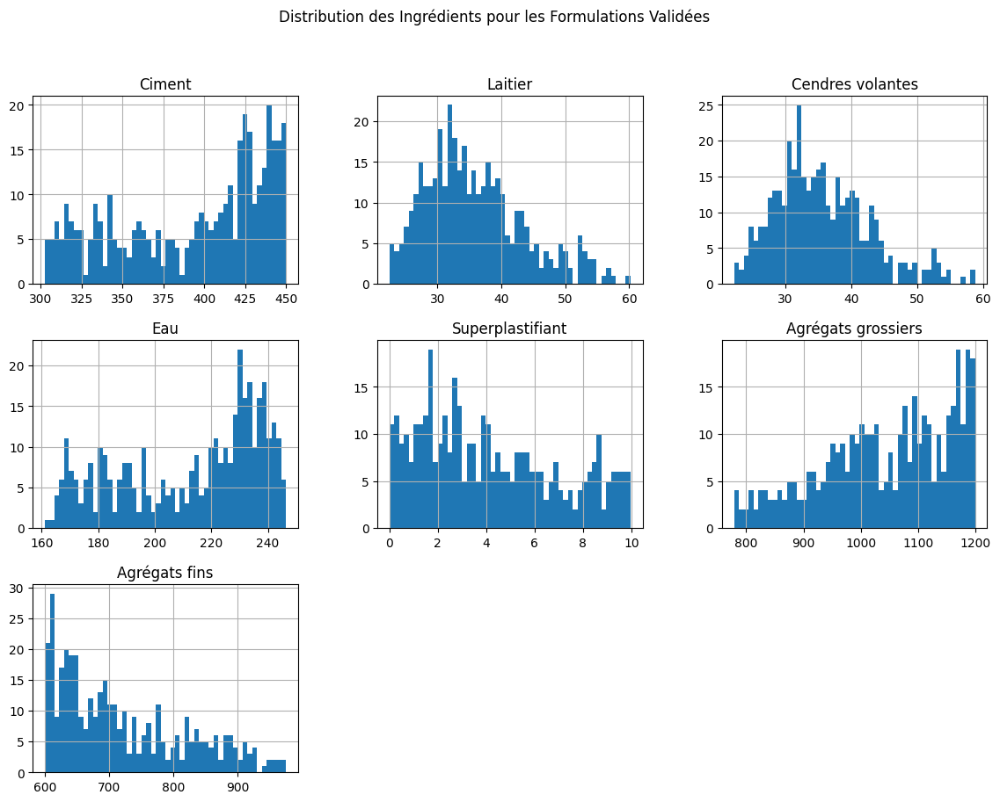

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Convertir les formulations valides en DataFrame pour faciliter l'analyse
df_valid_compositions = pd.DataFrame({
    'Ciment': [comp[0] for comp, _ in valid_compositions['all_additives']],
    'Laitier': [comp[1] for comp, _ in valid_compositions['all_additives']],
    'Cendres volantes': [comp[2] for comp, _ in valid_compositions['all_additives']],
    'Eau': [comp[3] for comp, _ in valid_compositions['all_additives']],
    'Superplastifiant': [comp[4] for comp, _ in valid_compositions['all_additives']],
    'Agrégats grossiers': [comp[5] for comp, _ in valid_compositions['all_additives']],
    'Agrégats fins': [comp[6] for comp, _ in valid_compositions['all_additives']]
})

# Calculer les statistiques descriptives
stats = df_valid_compositions.describe()

print(stats)

# Visualisation des distributions avec des histogrammes
df_valid_compositions.hist(bins=50, figsize=(14, 10))
plt.suptitle('Distribution des Ingrédients pour les Formulations Validées')
plt.show()


In [ ]:
import pandas as pd

# Filtrage des compositions valides avec la résistance spécifiée
filtered_compositions = {
    scenario: [(comp, strength) for comp, strength in zip(all_compositions[scenario], all_strengths[scenario])
                if 33 <= strength <= 35
                and 0.45 <= comp[3]/sum(comp[:3]) <= 0.55
                and comp[5]/comp[6] > 1.2]
    for scenario in scenarios
}

# Convertir les formulations valides en DataFrame pour faciliter l'analyse
df_valid_compositions = pd.DataFrame({
    'Ciment': [comp[0] for comp, _ in filtered_compositions['all_additives']],
    'Laitier': [comp[1] for comp, _ in filtered_compositions['all_additives']],
    'Cendres volantes': [comp[2] for comp, _ in filtered_compositions['all_additives']],
    'Eau': [comp[3] for comp, _ in filtered_compositions['all_additives']],
    'Superplastifiant': [comp[4] for comp, _ in filtered_compositions['all_additives']],
    'Agrégats grossiers': [comp[5] for comp, _ in filtered_compositions['all_additives']],
    'Agrégats fins': [comp[6] for comp, _ in filtered_compositions['all_additives']],
    'Résistance': [strength for _, strength in filtered_compositions['all_additives']]
})

# Vérifiez le nombre de formulations valides après filtrage
print(f"Nombre de formulations valides après filtrage: {len(df_valid_compositions)}")

# Sélectionner un échantillon aléatoire de 100 formulations valides
sampled_compositions = df_valid_compositions.sample(n=100, random_state=1)

# Afficher les échantillons aléatoires
print(sampled_compositions)


Nombre de formulations valides après filtrage: 382
         Ciment    Laitier  Cendres volantes         Eau  Superplastifiant  \
189  449.472496  47.121208         40.849086  244.351335          2.907139   
380  352.126752  27.381360         31.761045  185.242638          2.973223   
120  325.376036  25.400939         29.747944  178.124374          0.319681   
207  409.884230  45.119056         30.604841  223.509888          1.123373   
320  332.557705  26.849532         30.807280  176.740635          2.908211   
..          ...        ...               ...         ...               ...   
332  366.966020  30.351692         49.806688  201.817178          9.692323   
146  303.664421  36.367033         22.320744  163.198887          8.670104   
102  325.147596  36.459330         26.771525  177.997530          1.802827   
236  416.676055  46.269868         32.696508  227.291043          1.380962   
39   405.876238  40.071345         41.237827  221.633063          3.094393   

     Agrégat

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Données pour les meilleurs scénarios
best_scenarios = {
    'all_additives': [202.00, 16.91, 26.00, 110.34, 0.28, 727.32, 1214.49],
    'only_fly_ash': [202.16, 0, 35.22, 108.65, 1.12, 1365.14, 926.37],
    'no_additives': [300.04, 0, 0, 158.07, 0, 1163.32, 861.80]
}

# Données pour les pires scénarios
worst_scenarios = {
    'all_additives': [499.25, 40.43, 41.23, 268.22, 6.81, 1050.40, 600.00],
    'only_fly_ash': [499.90, 0, 50.21, 274.61, 9.64, 944.45, 600.37],
    'no_additives': [450.00, 0, 0, 226.74, 0, 1075.30, 618.76]
}

# Noms des ingrédients et leurs intervalles
ingredients = ['Ciment', 'Laitier', 'Cendres volantes', 'Eau', 'Superplastifiant', 'Agrégats grossiers', 'Agrégats fins']
intervals = [(200, 500), (0, 50), (0, 50), (100, 275), (0, 10), (700, 1200), (600, 1000)]

# Fonction pour normaliser les données
def normalize(value, min_val, max_val):
    return (value - min_val) / (max_val - min_val)

# Fonction pour créer le graphique radar
def create_radar_chart(data, title):
    num_vars = len(ingredients)

    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(projection='polar'))

    for scenario, values in data.items():
        normalized_values = [normalize(v, intervals[i][0], intervals[i][1]) for i, v in enumerate(values)]
        normalized_values += normalized_values[:1]
        ax.plot(angles, normalized_values, linewidth=2, linestyle='solid', label=scenario)
        ax.fill(angles, normalized_values, alpha=0.1)

    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
    ax.set_thetagrids(np.degrees(angles[:-1]), ingredients)

    for i, (ingredient, interval) in enumerate(zip(ingredients, intervals)):
        ax.text(angles[i], 1.1, f"{interval[0]}-{interval[1]}", ha='center', va='center')

    ax.set_ylim(0, 1)
    ax.set_yticks([])

    plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
    plt.title(title, y=1.08)
    plt.tight_layout()

# Créer les graphiques
create_radar_chart(best_scenarios, "Meilleurs scénarios")
plt.savefig('best_scenarios_radar.png', dpi=30, bbox_inches='tight')
plt.close()

create_radar_chart(worst_scenarios, "Pires scénarios")
plt.savefig('worst_scenarios_radar.png', dpi=30, bbox_inches='tight')
plt.close()

print("Les graphiques ont été sauvegardés sous 'best_scenarios_radar.png' et 'worst_scenarios_radar.png'.")

Les graphiques ont été sauvegardés sous 'best_scenarios_radar.png' et 'worst_scenarios_radar.png'.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Données pour les meilleurs scénarios
best_scenarios = {
    'all_additives': [202.00, 16.91, 26.00, 110.34, 0.28, 727.32, 1214.49],
    'only_fly_ash': [202.16, 0, 35.22, 108.65, 1.12, 1365.14, 926.37],
    'no_additives': [300.04, 0, 0, 158.07, 0, 1163.32, 861.80]
}

# Données pour les pires scénarios
worst_scenarios = {
    'all_additives': [499.25, 40.43, 41.23, 268.22, 6.81, 1050.40, 600.00],
    'only_fly_ash': [499.90, 0, 50.21, 274.61, 9.64, 944.45, 600.37],
    'no_additives': [450.00, 0, 0, 226.74, 0, 1075.30, 618.76]
}

# Noms des ingrédients et leurs intervalles
ingredients = ['Ciment', 'Laitier', 'Cendres volantes', 'Eau', 'Superplastifiant', 'Agrégats grossiers', 'Agrégats fins']
intervals = [(200, 500), (0, 50), (0, 50), (100, 275), (0, 10), (700, 1200), (600, 1000)]

# Fonction pour normaliser les données
def normalize(value, min_val, max_val):
    return (value - min_val) / (max_val - min_val)

# Fonction pour créer le graphique radar
def create_radar_chart(data, title):
    num_vars = len(ingredients)

    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(12, 12), subplot_kw=dict(projection='polar'))

    colors = plt.get_cmap('tab10').colors  # Utilisation d'un colormap pour des couleurs distinctes

    for idx, (scenario, values) in enumerate(data.items()):
        normalized_values = [normalize(v, intervals[i][0], intervals[i][1]) for i, v in enumerate(values)]
        normalized_values += normalized_values[:1]
        ax.plot(angles, normalized_values, linewidth=2, linestyle='solid', label=scenario, color=colors[idx])
        ax.fill(angles, normalized_values, alpha=0.25, color=colors[idx])

    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
    ax.set_thetagrids(np.degrees(angles[:-1]), ingredients, fontsize=12)

    for i, (ingredient, interval) in enumerate(zip(ingredients, intervals)):
        ax.text(angles[i], 1.1, f"{interval[0]}-{interval[1]}", ha='center', va='center', fontsize=10)

    ax.set_ylim(0, 1)
    ax.set_yticks([])

    plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1.0))
    plt.title(title, y=1.15, fontsize=16)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()

# Créer les graphiques
create_radar_chart(best_scenarios, "Meilleurs scénarios")
plt.savefig('best_scenarios_radar.png', dpi=300, bbox_inches='tight')
plt.close()

create_radar_chart(worst_scenarios, "Pires scénarios")
plt.savefig('worst_scenarios_radar.png', dpi=300, bbox_inches='tight')
plt.close()

print("Les graphiques améliorés ont été sauvegardés sous 'best_scenarios_radar.png' et 'worst_scenarios_radar.png'.")


Les graphiques améliorés ont été sauvegardés sous 'best_scenarios_radar.png' et 'worst_scenarios_radar.png'.


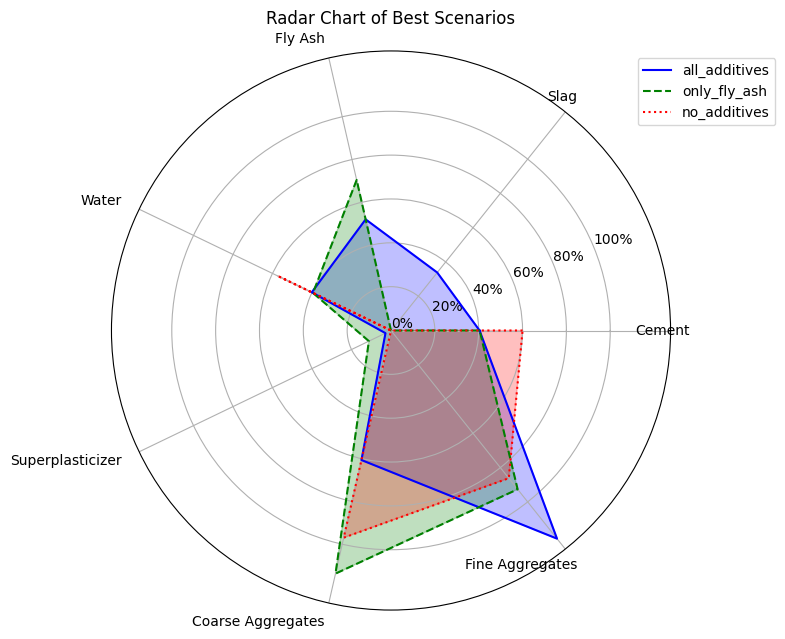

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from math import pi

# Data for the best scenarios
ingredients = ['Cement', 'Slag', 'Fly Ash', 'Water', 'Superplasticizer', 'Coarse Aggregates', 'Fine Aggregates']
intervals = [(200, 500), (0, 50), (0, 50), (100, 275), (0, 10), (700, 1200), (600, 1000)]

best_scenarios = {
    'all_additives': [202.00, 16.91, 26.00, 110.34, 0.28, 727.32, 1214.49],
    'only_fly_ash': [202.16, 0, 35.22, 108.65, 1.12, 1365.14, 926.37],
    'no_additives': [300.04, 0, 0, 158.07, 0, 1163.32, 861.80]
}

# Normalize the data
def normalize(values, intervals):
    max_values = [interval[1] for interval in intervals]
    return [v / max_value for v, max_value in zip(values, max_values)]

# Number of variables
num_vars = len(ingredients)

# Angle for each axis of the radar
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# Repeat the first value to close the radar
angles += angles[:1]

# Create the radar chart
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

# Line styles and colors for clarity
styles = ['solid', 'dashed', 'dotted']
colors = ['b', 'g', 'r']

for (i, (scenario, values)) in enumerate(best_scenarios.items()):
    normalized_values = normalize(values, intervals)
    normalized_values += normalized_values[:1]  # Repeat the first value to close the radar
    ax.plot(angles, normalized_values, label=scenario, linestyle=styles[i % len(styles)], color=colors[i % len(colors)])
    ax.fill(angles, normalized_values, alpha=0.25, color=colors[i % len(colors)])

# Add labels and legend
ax.set_yticks(np.linspace(0, 1, 6))  # Limits between 0 and 1 for normalized values
ax.set_yticklabels([f'{int(i*100)}%' for i in np.linspace(0, 1, 6)])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(ingredients, rotation=45, ha='right')
plt.title('Radar Chart of Best Scenarios')
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()
plt.show()


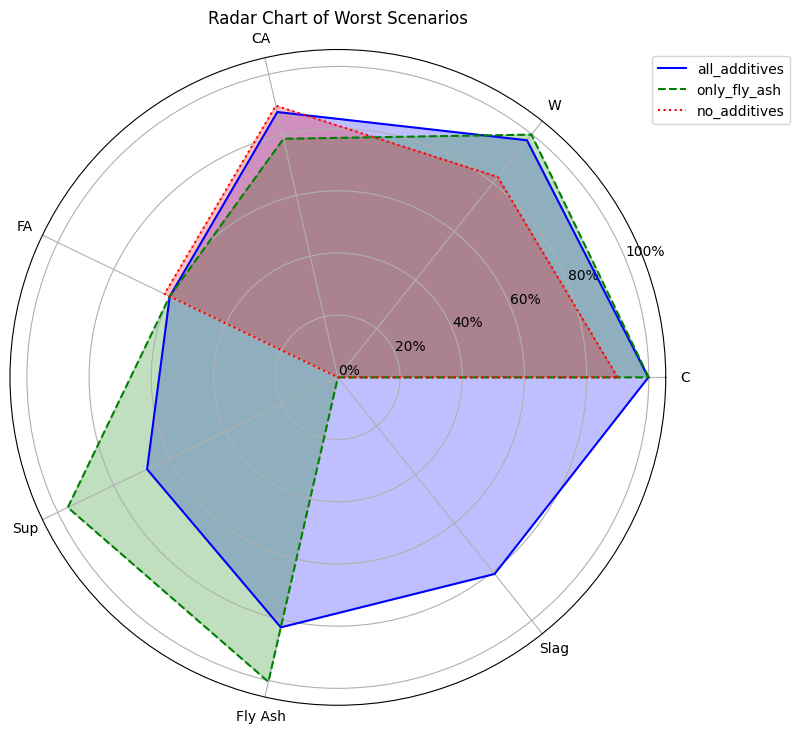

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from math import pi

# New order for ingredients with Slag at the end
ingredients = ['C', 'W', 'CA', 'FA', 'Sup', 'Fly Ash', 'Slag']
intervals = [(200, 500), (100, 275), (700, 1200), (600, 1000), (0, 10), (0, 50), (0, 50)]

# Rearranged worst scenarios data according to the new ingredient order
worst_scenarios = {
    'all_additives': [499.25, 268.22, 1050.40, 600.00, 6.81, 41.23, 40.43],
    'only_fly_ash': [499.90, 274.61, 944.45, 600.37, 9.64, 50.21, 0],
    'no_additives': [450.00, 226.74, 1075.30, 618.76, 0, 0, 0]
}

# Normalize the data
def normalize(values, intervals):
    max_values = [interval[1] for interval in intervals]
    return [v / max_value for v, max_value in zip(values, max_values)]

# Number of variables
num_vars = len(ingredients)

# Angle for each axis of the radar
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# Repeat the first value to close the radar
angles += angles[:1]

# Create the radar chart
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

# Line styles and colors for clarity
styles = ['solid', 'dashed', 'dotted']
colors = ['b', 'g', 'r']

for (i, (scenario, values)) in enumerate(worst_scenarios.items()):
    normalized_values = normalize(values, intervals)
    normalized_values += normalized_values[:1]  # Repeat the first value to close the radar
    ax.plot(angles, normalized_values, label=scenario, linestyle=styles[i % len(styles)], color=colors[i % len(colors)])
    ax.fill(angles, normalized_values, alpha=0.25, color=colors[i % len(colors)])

# Add labels and legend
ax.set_yticks(np.linspace(0, 1, 6))  # Limits between 0 and 1 for normalized values
ax.set_yticklabels([f'{int(i*100)}%' for i in np.linspace(0, 1, 6)])

# Adjust the position of the axis labels
ax.set_xticks(angles[:-1])
ax.set_xticklabels(ingredients, rotation=0, ha='center')
for label, angle in zip(ax.get_xticklabels(), angles):
    x, y = label.get_position()
    label.set_position((x * 1.5, y * 1.5))  # Increase the distance of labels from the center

plt.title('Radar Chart of Worst Scenarios')
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()
plt.show()


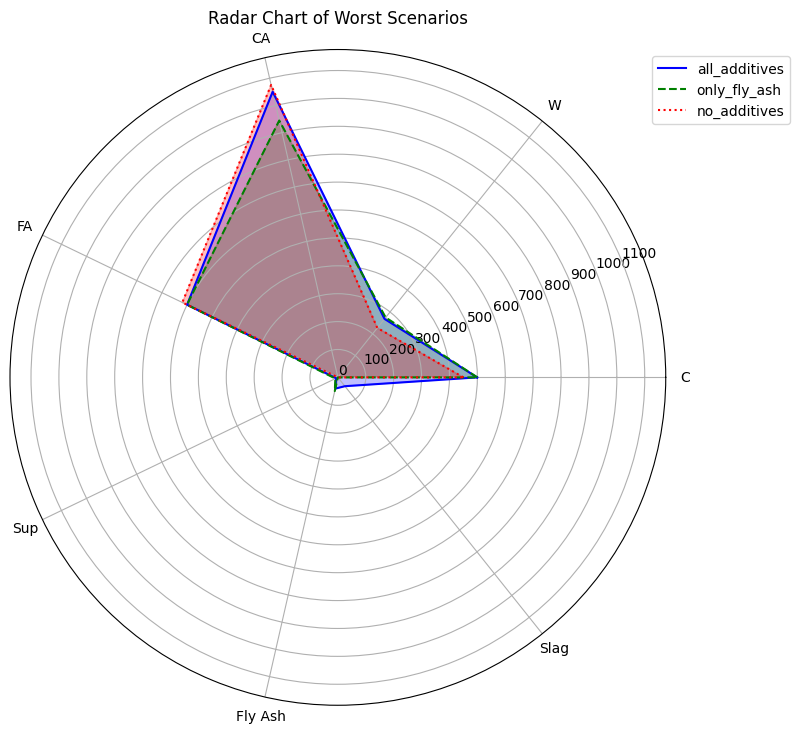

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from math import pi

# New order for ingredients with Slag at the end
ingredients = ['C', 'W', 'CA', 'FA', 'Sup', 'Fly Ash', 'Slag']
intervals = [(200, 500), (100, 275), (700, 1200), (600, 1000), (0, 10), (0, 50), (0, 50)]

# Rearranged worst scenarios data according to the new ingredient order
worst_scenarios = {
    'all_additives': [499.25, 268.22, 1050.40, 600.00, 6.81, 41.23, 40.43],
    'only_fly_ash': [499.90, 274.61, 944.45, 600.37, 9.64, 50.21, 0],
    'no_additives': [450.00, 226.74, 1075.30, 618.76, 0, 0, 0]
}

# Number of variables
num_vars = len(ingredients)

# Angle for each axis of the radar
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# Repeat the first value to close the radar
angles += angles[:1]

# Create the radar chart
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

# Line styles and colors for clarity
styles = ['solid', 'dashed', 'dotted']
colors = ['b', 'g', 'r']

for (i, (scenario, values)) in enumerate(worst_scenarios.items()):
    values += values[:1]  # Repeat the first value to close the radar
    ax.plot(angles, values, label=scenario, linestyle=styles[i % len(styles)], color=colors[i % len(colors)])
    ax.fill(angles, values, alpha=0.25, color=colors[i % len(colors)])

# Adjust the limits of the radial axis
max_value = max(max(values) for values in worst_scenarios.values())
ax.set_ylim(0, max_value + 100)

# Add labels and legend
ax.set_yticks(np.arange(0, max_value + 100, step=100))  # Adjust the radial ticks
ax.set_yticklabels([f'{int(i)}' for i in np.arange(0, max_value + 100, step=100)])

# Adjust the position of the axis labels
ax.set_xticks(angles[:-1])
ax.set_xticklabels(ingredients, rotation=0, ha='center')
for label, angle in zip(ax.get_xticklabels(), angles):
    x, y = label.get_position()
    label.set_position((x * 1.5, y * 1.5))  # Increase the distance of labels from the center

plt.title('Radar Chart of Worst Scenarios')
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()
plt.show()


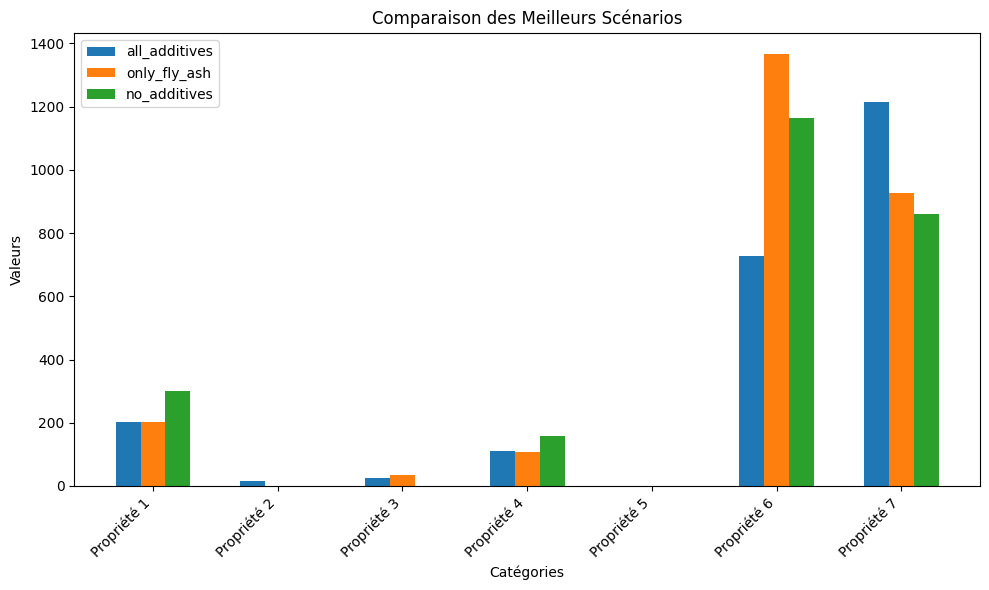

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Données pour les meilleurs scénarios
categories = ['Propriété 1', 'Propriété 2', 'Propriété 3', 'Propriété 4', 'Propriété 5', 'Propriété 6', 'Propriété 7']
best_scenarios = {
    'all_additives': [202.00, 16.91, 26.00, 110.34, 0.28, 727.32, 1214.49],
    'only_fly_ash': [202.16, 0, 35.22, 108.65, 1.12, 1365.14, 926.37],
    'no_additives': [300.04, 0, 0, 158.07, 0, 1163.32, 861.80]
}

# Configuration des barres
bar_width = 0.2
index = np.arange(len(categories))

# Création du graphique
fig, ax = plt.subplots(figsize=(10, 6))

for i, (scenario, values) in enumerate(best_scenarios.items()):
    ax.bar(index + i * bar_width, values, bar_width, label=scenario)

# Ajouter des labels, une légende et des titres
ax.set_xlabel('Catégories')
ax.set_ylabel('Valeurs')
ax.set_title('Comparaison des Meilleurs Scénarios')
ax.set_xticks(index + bar_width)
ax.set_xticklabels(categories, rotation=45, ha='right')
ax.legend()

plt.tight_layout()
plt.show()


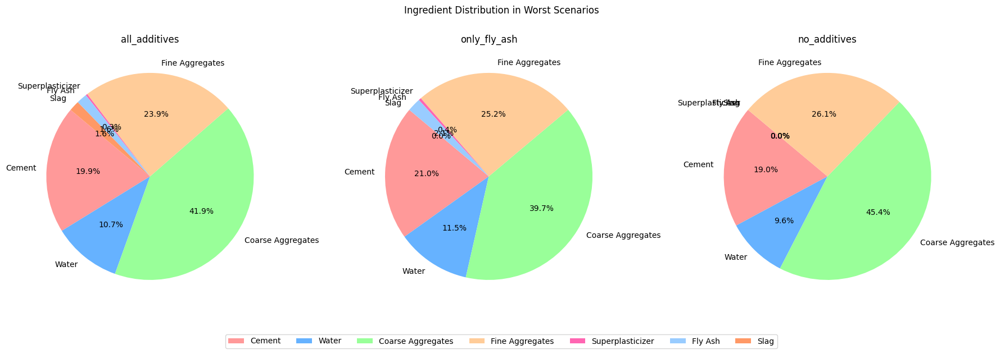

In [ ]:
import matplotlib.pyplot as plt

# Data for the worst scenarios
ingredients = ['Cement', 'Water', 'Coarse Aggregates', 'Fine Aggregates', 'Superplasticizer', 'Fly Ash', 'Slag']
colors = ['#FF9999', '#66B2FF', '#99FF99', '#FFCC99', '#FF66B2', '#99CCFF', '#FF9966']

worst_scenarios = {
    'all_additives': [499.25, 268.22, 1050.40, 600.00, 6.81, 41.23, 40.43],
    'only_fly_ash': [499.90, 274.61, 944.45, 600.37, 9.64, 50.21, 0],
    'no_additives': [450.00, 226.74, 1075.30, 618.76, 0, 0, 0]
}

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Plotting each scenario in a separate circle
for ax, (scenario, values) in zip(axes, worst_scenarios.items()):
    ax.pie(values, labels=ingredients, colors=colors, autopct='%1.1f%%', startangle=140)
    ax.set_title(scenario)

# Add a legend
fig.legend(ingredients, loc='lower center', bbox_to_anchor=(0.5, -0.05), ncol=7)

plt.suptitle('Ingredient Distribution in Worst Scenarios')
plt.tight_layout()
plt.show()


ValueError: not enough values to unpack (expected 3, got 2)

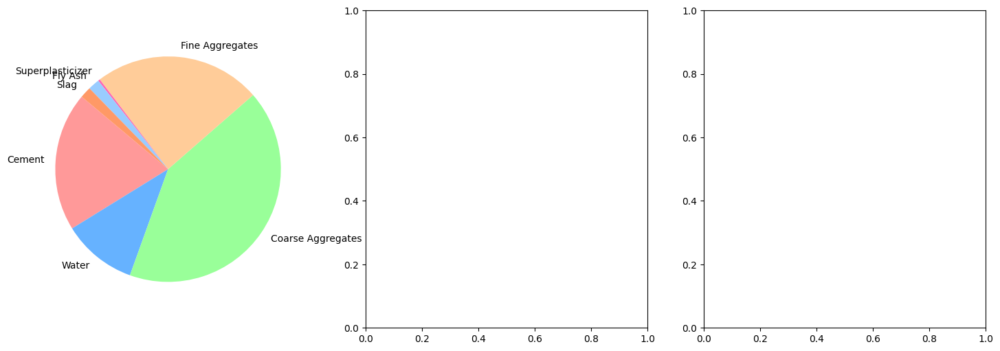

In [ ]:
import matplotlib.pyplot as plt

# Data for the worst scenarios
ingredients = ['Cement', 'Water', 'Coarse Aggregates', 'Fine Aggregates', 'Superplasticizer', 'Fly Ash', 'Slag']
colors = ['#FF9999', '#66B2FF', '#99FF99', '#FFCC99', '#FF66B2', '#99CCFF', '#FF9966']

worst_scenarios = {
    'all_additives': [499.25, 268.22, 1050.40, 600.00, 6.81, 41.23, 40.43],
    'only_fly_ash': [499.90, 274.61, 944.45, 600.37, 9.64, 50.21, 0],
    'no_additives': [450.00, 226.74, 1075.30, 618.76, 0, 0, 0]
}

# Function to handle small values by using arrows
def plot_pie(ax, values, scenario):
    wedges, texts, autotexts = ax.pie(values, labels=ingredients, colors=colors, startangle=140)
    ax.set_title(scenario)

    # Check for small or zero values
    for i, (value, wedge) in enumerate(zip(values, wedges)):
        if value == 0:
            wedge.set_visible(False)
        elif value < 20:  # Threshold for small values
            # Adding an annotation with an arrow for small values
            angle = (wedge.theta2 + wedge.theta1) / 2
            x = wedge.r * 0.7 * np.cos(np.deg2rad(angle))
            y = wedge.r * 0.7 * np.sin(np.deg2rad(angle))
            ax.annotate(f'{ingredients[i]}: {value:.2f} kg/m³',
                        xy=(x, y), xytext=(1.5*x, 1.5*y),
                        arrowprops=dict(facecolor='black', arrowstyle="->"),
                        horizontalalignment='center', verticalalignment='center')

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Plotting each scenario in a separate circle
for ax, (scenario, values) in zip(axes, worst_scenarios.items()):
    plot_pie(ax, values, scenario)

# Add a legend
fig.legend(ingredients, loc='lower center', bbox_to_anchor=(0.5, -0.1), ncol=7)

plt.suptitle('Ingredient Distribution in Worst Scenarios', fontsize=16)
plt.tight_layout()
plt.show()


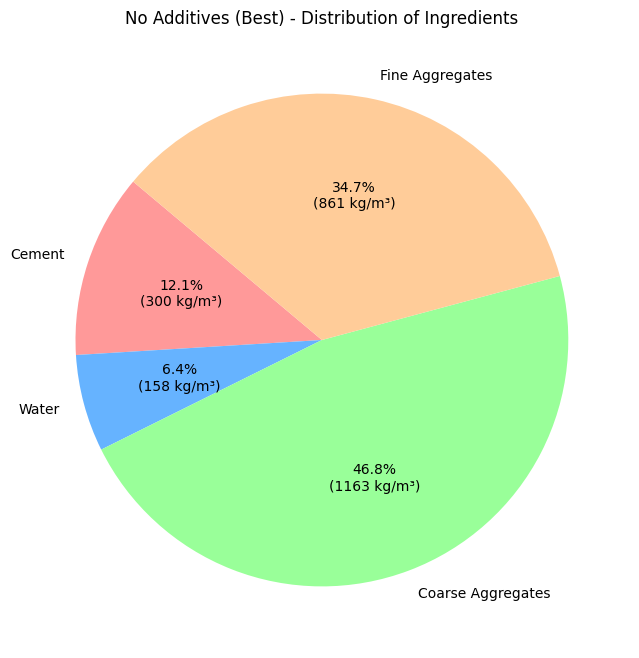

In [ ]:
import matplotlib.pyplot as plt

# Données pour le scénario "No Additives (Best)"
ingredients = ['Cement', 'Water', 'Coarse Aggregates', 'Fine Aggregates']
quantities = [300.04, 158.07, 1163.32, 861.80]

# Couleurs pour les secteurs
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99']

# Fonction pour formater les labels avec pourcentages et quantités
def func(pct, allvals):
    absolute = int(pct/100.*sum(allvals))
    return "{:.1f}%\n({:d} kg/m³)".format(pct, absolute)

# Création du graphique en secteurs
plt.figure(figsize=(8, 8))
plt.pie(quantities, labels=ingredients, colors=colors, autopct=lambda pct: func(pct, quantities), startangle=140)

# Titre
plt.title('No Additives (Best) - Distribution of Ingredients')

# Affichage du graphique
plt.show()


In [ ]:
import random
import numpy as np

def generate_composition(scenario):
    cement = random.uniform(300, 450)  # kg/m³
    water = random.uniform(cement * 0.45, cement * 0.55)  # Pour respecter le rapport W/C

    if scenario == "all_additives":
        total_binder = cement / 0.7  # Supposons que le ciment représente 70% du liant total

        # Génération initiale des ajouts
        fly_ash = random.uniform(0.05 * total_binder, 0.1 * total_binder)
        slag = random.uniform(0.05 * total_binder, 0.1 * total_binder)

        # Assurez-vous que la somme des ajouts est entre 10% et 20% du liant total
        while not (0.1 * total_binder <= fly_ash + slag <= 0.2 * total_binder):
            fly_ash = random.uniform(0.05 * total_binder, 0.1 * total_binder)
            slag = random.uniform(0.05 * total_binder, 0.1 * total_binder)

    elif scenario == "only_slag":
        total_binder = cement / 0.8  # Supposons que le ciment représente 80% du liant total
        slag = total_binder - cement
        fly_ash = 0
    elif scenario == "only_fly_ash":
        total_binder = cement / 0.85  # Supposons que le ciment représente 85% du liant total
        fly_ash = random.uniform(0.1 * total_binder, 0.2 * total_binder)
        slag = 0
    else:  # no_additives
        slag = fly_ash = 0
        total_binder = cement

    superplasticizer = random.uniform(0, 10) if scenario != "no_additives" else 0
    coarse_aggregate = random.uniform(700, 1200)
    fine_aggregate = random.uniform(600, 1000)

    return [cement, slag, fly_ash, water, superplasticizer, coarse_aggregate, fine_aggregate, 28]

# Le reste du code reste inchangé pour générer et évaluer les compositions

# Génération des compositions
num_samples = 100000
scenarios = ["all_additives", "only_slag", "only_fly_ash", "no_additives"]
all_compositions = {scenario: [generate_composition(scenario) for _ in range(num_samples)] for scenario in scenarios}

# Prédiction des résistances
all_strengths = {scenario: [predict_strength(model, scaler, comp) for comp in compositions]
                 for scenario, compositions in all_compositions.items()}

# Filtrage des compositions valides
valid_compositions = {scenario: [(comp, strength) for comp, strength in zip(all_compositions[scenario], all_strengths[scenario])
                                 if 33 <= strength <= 35
                                 and 0.45 <= comp[3]/sum(comp[:3]) <= 0.55
                                 and comp[5]/comp[6] > 1.2]  # Condition pour le ratio agrégats grossiers/fins
                      for scenario in scenarios}

# Filtrer spécifiquement pour le scénario "no_additives" avec 350 kg/m³ de ciment
if "no_additives" in valid_compositions:
    specific_cement_amount = 350
    specific_valid_compositions = [comp for comp in valid_compositions["no_additives"] if comp[0][0] == specific_cement_amount]

    if specific_valid_compositions:
        best_composition = min(specific_valid_compositions, key=lambda x: evaluate_composition(*x)[0])
        worst_composition = max(specific_valid_compositions, key=lambda x: x[0])  # Basé sur la quantité de ciment

        print(f"\nScénario: no_additives avec {specific_cement_amount} kg/m³ de ciment")
        print(f"Nombre de compositions valides avec {specific_cement_amount} kg/m³ de ciment: {len(specific_valid_compositions)}")

        print("\nMeilleur scénario:")
        print(f"Composition:")
        print(f"  Ciment: {best_composition[0][0]:.2f} kg/m³")
        print(f"  Laitier: {best_composition[0][1]:.2f} kg/m³")
        print(f"  Cendres volantes: {best_composition[0][2]:.2f} kg/m³")
        print(f"  Eau: {best_composition[0][3]:.2f} kg/m³")
        print(f"  Superplastifiant: {best_composition[0][4]:.2f} kg/m³")
        print(f"  Agrégats grossiers: {best_composition[0][5]:.2f} kg/m³")
        print(f"  Agrégats fins: {best_composition[0][6]:.2f} kg/m³")
        print(f"Résistance prédite: {best_composition[1]:.2f} MPa")
        cost, w_c_ratio, co2, _ = evaluate_composition(*best_composition)
        print(f"Coût estimé: {cost:.2f}")
        print(f"Rapport W/C: {w_c_ratio:.2f}")
        print(f"Émissions de CO2 estimées: {co2:.2f}")

        print("\nPire scénario (basé sur la quantité de ciment):")
        print(f"Composition:")
        print(f"  Ciment: {worst_composition[0][0]:.2f} kg/m³")
        print(f"  Laitier: {worst_composition[0][1]:.2f} kg/m³")
        print(f"  Cendres volantes: {worst_composition[0][2]:.2f} kg/m³")
        print(f"  Eau: {worst_composition[0][3]:.2f} kg/m³")
        print(f"  Superplastifiant: {worst_composition[0][4]:.2f} kg/m³")
        print(f"  Agrégats grossiers: {worst_composition[0][5]:.2f} kg/m³")
        print(f"  Agrégats fins: {worst_composition[0][6]:.2f} kg/m³")
        print(f"Résistance prédite: {worst_composition[1]:.2f} MPa")
        cost, w_c_ratio, co2, _ = evaluate_composition(*worst_composition)
        print(f"Coût estimé: {cost:.2f}")
        print(f"Rapport W/C: {w_c_ratio:.2f}")
        print(f"Émissions de CO2 estimées: {co2:.2f}")
    else:
        print(f"Aucune composition valide trouvée pour le scénario 'no_additives' avec {specific_cement_amount} kg/m³ de ciment.")
else:
    print("Aucune composition valide trouvée pour le scénario 'no_additives'.")


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packag

Aucune composition valide trouvée pour le scénario 'no_additives' avec 350 kg/m³ de ciment.


In [ ]:
import random
import numpy as np

def generate_composition(scenario):
    cement = random.uniform(250, 500)  # kg/m³
    water = random.uniform(cement * 0.45, cement * 0.55)  # Pour respecter le rapport W/C

    if scenario == "all_additives":
        total_binder = cement / 0.7  # Supposons que le ciment représente 70% du liant total

        # Génération initiale des ajouts
        fly_ash = random.uniform(0.05 * total_binder, 0.1 * total_binder)
        slag = random.uniform(0.05 * total_binder, 0.1 * total_binder)

        # Assurez-vous que la somme des ajouts est entre 10% et 20% du liant total
        while not (0.1 * total_binder <= fly_ash + slag <= 0.2 * total_binder):
            fly_ash = random.uniform(0.05 * total_binder, 0.1 * total_binder)
            slag = random.uniform(0.05 * total_binder, 0.1 * total_binder)

    elif scenario == "only_slag":
        total_binder = cement / 0.8  # Supposons que le ciment représente 80% du liant total
        slag = total_binder - cement
        fly_ash = 0
    elif scenario == "only_fly_ash":
        total_binder = cement / 0.85  # Supposons que le ciment représente 85% du liant total
        fly_ash = random.uniform(0.1 * total_binder, 0.2 * total_binder)
        slag = 0
    else:  # no_additives
        slag = fly_ash = 0
        total_binder = cement

    superplasticizer = random.uniform(0, 10) if scenario != "no_additives" else 0
    coarse_aggregate = random.uniform(700, 1200)
    fine_aggregate = random.uniform(600, 1000)

    return [cement, slag, fly_ash, water, superplasticizer, coarse_aggregate, fine_aggregate, 28]

# Le reste du code reste inchangé pour générer et évaluer les compositions

# Génération des compositions
num_samples = 100000
scenarios = ["all_additives", "only_slag", "only_fly_ash", "no_additives"]
all_compositions = {scenario: [generate_composition(scenario) for _ in range(num_samples)] for scenario in scenarios}

# Prédiction des résistances
all_strengths = {scenario: [predict_strength(model, scaler, comp) for comp in compositions]
                 for scenario, compositions in all_compositions.items()}

# Filtrage des compositions valides
# Filtrage des compositions valides
valid_compositions = {scenario: [(comp, strength) for comp, strength in zip(all_compositions[scenario], all_strengths[scenario])
                                 if 33 <= strength <= 35
                                 and 0.45 <= comp[3]/sum(comp[:3]) <= 0.55
                                 and comp[5]/comp[6] > 1.2]  # Condition for coarse/fine aggregate ratio
                      for scenario in scenarios}

valid_compositions = {scenario: [(comp, strength) for comp, strength in zip(all_compositions[scenario], all_strengths[scenario])
                                 if 33 <= strength <= 35 and 0.45 <= comp[3]/sum(comp[:3]) <= 0.55]
                      for scenario in scenarios}

# Affichage des résultats pour chaque scénario
for scenario in scenarios:
    print(f"\nScénario: {scenario}")
    print(f"Nombre de compositions valides: {len(valid_compositions[scenario])}")

    if valid_compositions[scenario]:
        best_composition = min(valid_compositions[scenario], key=lambda x: evaluate_composition(*x)[0])
        worst_composition = max(valid_compositions[scenario], key=lambda x: x[0])  # Basé sur la quantité de ciment

        print("\nMeilleur scénario:")
        print(f"Composition:")
        print(f"  Ciment: {best_composition[0][0]:.2f} kg/m³")
        print(f"  Laitier: {best_composition[0][1]:.2f} kg/m³")
        print(f"  Cendres volantes: {best_composition[0][2]:.2f} kg/m³")
        print(f"  Eau: {best_composition[0][3]:.2f} kg/m³")
        print(f"  Superplastifiant: {best_composition[0][4]:.2f} kg/m³")
        print(f"  Agrégats grossiers: {best_composition[0][5]:.2f} kg/m³")
        print(f"  Agrégats fins: {best_composition[0][6]:.2f} kg/m³")
        print(f"Résistance prédite: {best_composition[1]:.2f} MPa")
        cost, w_c_ratio, co2, _ = evaluate_composition(*best_composition)
        print(f"Coût estimé: {cost:.2f}")
        print(f"Rapport W/C: {w_c_ratio:.2f}")
        print(f"Émissions de CO2 estimées: {co2:.2f}")

        print("\nPire scénario (basé sur la quantité de ciment):")
        print(f"Composition:")
        print(f"  Ciment: {worst_composition[0][0]:.2f} kg/m³")
        print(f"  Laitier: {worst_composition[0][1]:.2f} kg/m³")
        print(f"  Cendres volantes: {worst_composition[0][2]:.2f} kg/m³")
        print(f"  Eau: {worst_composition[0][3]:.2f} kg/m³")
        print(f"  Superplastifiant: {worst_composition[0][4]:.2f} kg/m³")
        print(f"  Agrégats grossiers: {worst_composition[0][5]:.2f} kg/m³")
        print(f"  Agrégats fins: {worst_composition[0][6]:.2f} kg/m³")
        print(f"Résistance prédite: {worst_composition[1]:.2f} MPa")
        cost, w_c_ratio, co2, _ = evaluate_composition(*worst_composition)
        print(f"Coût estimé: {cost:.2f}")
        print(f"Rapport W/C: {w_c_ratio:.2f}")
        print(f"Émissions de CO2 estimées: {co2:.2f}")
    else:
        print("Aucune composition valide trouvée pour ce scénario.")


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packag


Scénario: all_additives
Nombre de compositions valides: 770

Meilleur scénario:
Composition:
  Ciment: 250.35 kg/m³
  Laitier: 21.23 kg/m³
  Cendres volantes: 24.92 kg/m³
  Eau: 134.89 kg/m³
  Superplastifiant: 9.68 kg/m³
  Agrégats grossiers: 1132.17 kg/m³
  Agrégats fins: 796.74 kg/m³
Résistance prédite: 34.05 MPa


ValueError: not enough values to unpack (expected 4, got 3)

In [ ]:
import random
import numpy as np

def generate_composition(scenario):
    cement = random.uniform(250, 500)  # kg/m³
    water = random.uniform(cement * 0.45, cement * 0.55)  # Pour respecter le rapport W/C

    if scenario == "all_additives":
        total_binder = cement / 0.7  # Supposons que le ciment représente 70% du liant total

        # Génération initiale des ajouts
        fly_ash = random.uniform(0.05 * total_binder, 0.1 * total_binder)
        slag = random.uniform(0.05 * total_binder, 0.1 * total_binder)

        # Assurez-vous que la somme des ajouts est entre 10% et 20% du liant total
        while not (0.1 * total_binder <= fly_ash + slag <= 0.2 * total_binder):
            fly_ash = random.uniform(0.05 * total_binder, 0.1 * total_binder)
            slag = random.uniform(0.05 * total_binder, 0.1 * total_binder)

    elif scenario == "only_slag":
        total_binder = cement / 0.8  # Supposons que le ciment représente 80% du liant total
        slag = total_binder - cement
        fly_ash = 0
    elif scenario == "only_fly_ash":
        total_binder = cement / 0.85  # Supposons que le ciment représente 85% du liant total
        fly_ash = random.uniform(0.1 * total_binder, 0.2 * total_binder)
        slag = 0
    else:  # no_additives
        slag = fly_ash = 0
        total_binder = cement

    superplasticizer = random.uniform(0, 10) if scenario != "no_additives" else 0
    coarse_aggregate = random.uniform(700, 1200)
    fine_aggregate = random.uniform(600, 1000)

    return [cement, slag, fly_ash, water, superplasticizer, coarse_aggregate, fine_aggregate, 28]

# Exemple de fonction evaluate_composition
def evaluate_composition(cement, slag, fly_ash, water, superplasticizer, coarse_aggregate, fine_aggregate, age):
    cost = (cement * 0.1 + slag * 0.05 + fly_ash * 0.03 + water * 0.02 + superplasticizer * 0.1)
    w_c_ratio = water / cement
    co2 = (cement * 0.9 + slag * 0.6 + fly_ash * 0.5)  # Exemple simplifié
    other_factor = age  # Par exemple

    return cost, w_c_ratio, co2, other_factor

# Prédiction des résistances (exemple fictif)
def predict_strength(model, scaler, composition):
    # Vous devez utiliser le modèle et le scaler pour prédire la résistance ici
    scaled_composition = scaler.transform([composition])  # Assurez-vous que le scaler est adapté
    strength = model.predict(scaled_composition)[0]
    return strength

# Dummy model and scaler for the example
class DummyModel:
    def predict(self, X):
        return np.random.uniform(30, 40, size=X.shape[0])

class DummyScaler:
    def transform(self, X):
        return X  # Pas de transformation pour l'exemple

# Initialisation du modèle et du scaler fictifs
model = DummyModel()
scaler = DummyScaler()

# Génération des compositions
num_samples = 100000
scenarios = ["all_additives", "only_slag", "only_fly_ash", "no_additives"]
all_compositions = {scenario: [generate_composition(scenario) for _ in range(num_samples)] for scenario in scenarios}

# Prédiction des résistances
all_strengths = {scenario: [predict_strength(model, scaler, comp) for comp in compositions]
                 for scenario, compositions in all_compositions.items()}

# Filtrage des compositions valides
valid_compositions = {scenario: [(comp, strength) for comp, strength in zip(all_compositions[scenario], all_strengths[scenario])
                                 if 33 <= strength <= 35
                                 and 0.45 <= comp[3]/sum(comp[:3]) <= 0.55
                                 and (comp[5]/comp[6] > 1.2 if scenario != "no_additives" else True)]
                      for scenario in scenarios}

# Affichage des résultats pour chaque scénario
for scenario in scenarios:
    print(f"\nScénario: {scenario}")
    print(f"Nombre de compositions valides: {len(valid_compositions[scenario])}")

    if valid_compositions[scenario]:
        best_composition = min(valid_compositions[scenario], key=lambda x: evaluate_composition(*x[0])[0])
        worst_composition = max(valid_compositions[scenario], key=lambda x: x[1])  # Basé sur la résistance

        print("\nMeilleur scénario:")
        print(f"Composition:")
        print(f"  Ciment: {best_composition[0][0]:.2f} kg/m³")
        print(f"  Laitier: {best_composition[0][1]:.2f} kg/m³")
        print(f"  Cendres volantes: {best_composition[0][2]:.2f} kg/m³")
        print(f"  Eau: {best_composition[0][3]:.2f} kg/m³")
        print(f"  Superplastifiant: {best_composition[0][4]:.2f} kg/m³")
        print(f"  Agrégats grossiers: {best_composition[0][5]:.2f} kg/m³")
        print(f"  Agrégats fins: {best_composition[0][6]:.2f} kg/m³")
        print(f"Résistance prédite: {best_composition[1]:.2f} MPa")
        cost, w_c_ratio, co2, _ = evaluate_composition(*best_composition[0])
        print(f"Coût estimé: {cost:.2f}")
        print(f"Rapport W/C: {w_c_ratio:.2f}")
        print(f"Émissions de CO2 estimées: {co2:.2f}")

        print("\nPire scénario (basé sur la quantité de ciment):")
        print(f"Composition:")
        print(f"  Ciment: {worst_composition[0][0]:.2f} kg/m³")
        print(f"  Laitier: {worst_composition[0][1]:.2f} kg/m³")
        print(f"  Cendres volantes: {worst_composition[0][2]:.2f} kg/m³")
        print(f"  Eau: {worst_composition[0][3]:.2f} kg/m³")
        print(f"  Superplastifiant: {worst_composition[0][4]:.2f} kg/m³")
        print(f"  Agrégats grossiers: {worst_composition[0][5]:.2f} kg/m³")
        print(f"  Agrégats fins: {worst_composition[0][6]:.2f} kg/m³")
        print(f"Résistance prédite: {worst_composition[1]:.2f} MPa")
        cost, w_c_ratio, co2, _ = evaluate_composition(*worst_composition[0])
        print(f"Coût estimé: {cost:.2f}")
        print(f"Rapport W/C: {w_c_ratio:.2f}")
        print(f"Émissions de CO2 estimées: {co2:.2f}")
    else:
        print("Aucune composition valide trouvée pour ce scénario.")


In [ ]:


# Target strength range: 33 to 35 MPa
min_strength = 33
max_strength = 35

def filter_compositions(compositions, strengths, scenario):
    filtered = []
    for comp, strength in zip(compositions, strengths):
        cement, slag, fly_ash, water, superplast, coarse_agg, fine_agg, age = comp
        w_c_ratio = water / (cement + slag + fly_ash)
        if min_strength <= strength <= max_strength and 0.45 <= w_c_ratio <= 0.55 and age == 28 and fine_agg / coarse_agg > 1.2:
            if scenario == "all_additives" and 250 <= cement <= 300 and slag > 0 and fly_ash > 0:
                filtered.append((comp, strength))
            elif scenario == "only_slag" and 250 <= cement <= 300 and slag > 0 and fly_ash == 0:
                filtered.append((comp, strength))
            elif scenario == "only_flyash" and 250 <= cement <= 300 and slag == 0 and fly_ash > 0:
                filtered.append((comp, strength))
            elif scenario == "no_additives" and 350 <= cement <= 400 and slag == 0 and fly_ash == 0:
                filtered.append((comp, strength))
    return filtered

scenarios = ["all_additives", "only_slag", "only_flyash", "no_additives"]

for scenario in scenarios:
    filtered_comps = filter_compositions(compositions, strengths, scenario)

    if filtered_comps:
        best_scenario = min(filtered_comps, key=lambda x: x[0][0])  # Minimum cement
        worst_scenario = max(filtered_comps, key=lambda x: x[0][0])  # Maximum cement

        print(f"\nScénario: {scenario}")
        print(f"Nombre de compositions valides: {len(filtered_comps)}")
        print("Meilleur scénario:")
        print(f"Composition: {best_scenario[0]}")
        print(f"Résistance prédite: {best_scenario[1]:.2f} MPa")
        print(f"Rapport W/C: {best_scenario[0][3] / (best_scenario[0][0] + best_scenario[0][1] + best_scenario[0][2]):.2f}")
        print("Pire scénario:")
        print(f"Composition: {worst_scenario[0]}")
        print(f"Résistance prédite: {worst_scenario[1]:.2f} MPa")
        print(f"Rapport W/C: {worst_scenario[0][3] / (worst_scenario[0][0] + worst_scenario[0][1] + worst_scenario[0][2]):.2f}")
    else:
        print(f"\nAucune composition valide trouvée pour le scénario: {scenario}")


Aucune composition valide trouvée pour le scénario: all_additives

Aucune composition valide trouvée pour le scénario: only_slag

Aucune composition valide trouvée pour le scénario: only_flyash

Aucune composition valide trouvée pour le scénario: no_additives


CINETIQUE D4HYDRATATION


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Charger le dataset et renommer les colonnes
dataset = pd.read_excel("Concrete_Data_modif.xlsx")
dataset.rename(columns={
    'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Blast Furnace Slag (component 2)(kg in a m^3 mixture)': 'Slag (kg/m³)',
    'Fly Ash (component 3)(kg in a m^3 mixture)': 'FlyAsh (kg/m³)',
    'Water  (component 4)(kg in a m^3 mixture)': 'Water (kg/m³)',
    'Superplasticizer (component 5)(kg in a m^3 mixture)': 'Superplasticizer (kg/m³)',
    'Coarse Aggregate  (component 6)(kg in a m^3 mixture)': 'CoarseAggr (kg/m³)',
    'Fine Aggregate (component 7)(kg in a m^3 mixture)': 'FineAggr (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}, inplace=True)

# Tracer la résistance à la compression en fonction de l'âge pour les différents dosages de ciment
plt.figure(figsize=(10, 6))

# On suppose que les 9 dosages de ciment sont dans la colonne 'Cement (kg/m³)'
cement_dosages = dataset['Cement (kg/m³)'].unique()

for dosage in cement_dosages:
    subset = dataset[dataset['Cement (kg/m³)'] == dosage]
    plt.plot(subset['Age (day)'], subset['Strength (MPa)'], marker='o', label=f'Cement: {dosage} kg/m³')

plt.title('Compressive Strength vs Age for Different Cement Dosages')
plt.xlabel('Age (days)')
plt.ylabel('Compressive Strength (MPa)')
plt.legend(title='Cement Dosage (kg/m³)', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Charger le dataset et renommer les colonnes
dataset = pd.read_excel("Concrete_Data_modif.xlsx")
dataset.rename(columns={
    'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Blast Furnace Slag (component 2)(kg in a m^3 mixture)': 'Slag (kg/m³)',
    'Fly Ash (component 3)(kg in a m^3 mixture)': 'FlyAsh (kg/m³)',
    'Water  (component 4)(kg in a m^3 mixture)': 'Water (kg/m³)',
    'Superplasticizer (component 5)(kg in a m^3 mixture)': 'Superplasticizer (kg/m³)',
    'Coarse Aggregate  (component 6)(kg in a m^3 mixture)': 'CoarseAggr (kg/m³)',
    'Fine Aggregate (component 7)(kg in a m^3 mixture)': 'FineAggr (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}, inplace=True)

# Filtrer pour les dosages spécifiques
selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Tracer la résistance à la compression en fonction de l'âge pour les dosages sélectionnés
plt.figure(figsize=(10, 6))

for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage]
    plt.plot(subset['Age (day)'], subset['Strength (MPa)'], marker='o', label=f'Cement: {dosage} kg/m³')

plt.title('Compressive Strength vs Age for Selected Cement Dosages')
plt.xlabel('Age (days)')
plt.ylabel('Compressive Strength (MPa)')
plt.legend(title='Cement Dosage (kg/m³)', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from numpy.polynomial.polynomial import Polynomial

# Charger le dataset et renommer les colonnes
dataset = pd.read_excel("Concrete_Data_modif.xlsx")
dataset.rename(columns={
    'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Blast Furnace Slag (component 2)(kg in a m^3 mixture)': 'Slag (kg/m³)',
    'Fly Ash (component 3)(kg in a m^3 mixture)': 'FlyAsh (kg/m³)',
    'Water  (component 4)(kg in a m^3 mixture)': 'Water (kg/m³)',
    'Superplasticizer (component 5)(kg in a m^3 mixture)': 'Superplasticizer (kg/m³)',
    'Coarse Aggregate  (component 6)(kg in a m^3 mixture)': 'CoarseAggr (kg/m³)',
    'Fine Aggregate (component 7)(kg in a m^3 mixture)': 'FineAggr (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}, inplace=True)

# Filtrer pour les dosages spécifiques
selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Tracer la vitesse de durcissement (dérivée lissée) en fonction de l'âge pour les dosages sélectionnés
plt.figure(figsize=(10, 6))

for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage]
    # Vérifier s'il y a suffisamment de points pour ajuster un polynôme
    if len(subset) < 4:  # Par exemple, on s'assure qu'il y a au moins 4 points
        print(f"Pas assez de points pour un ajustement polynomial pour le dosage de ciment: {dosage} kg/m³")
        continue

    # Trier les données par âge pour un calcul correct de la dérivée
    subset = subset.sort_values(by='Age (day)')

    # Ajuster un polynôme de degré 2 ou 3 aux données
    p = Polynomial.fit(subset['Age (day)'], subset['Strength (MPa)'], deg=3)

    # Calculer la dérivée du polynôme
    dp = p.deriv()

    # Générer les valeurs pour l'axe x (âge) et y (vitesse de durcissement)
    age_values = np.linspace(subset['Age (day)'].min(), subset['Age (day)'].max(), 100)
    hardening_rate = dp(age_values)

    # Tracer la dérivée lissée
    plt.plot(age_values, hardening_rate, marker='o', label=f'Cement: {dosage} kg/m³')

plt.title('Rate of Hardening (Smoothed) vs Age for Selected Cement Dosages')
plt.xlabel('Age (days)')
plt.ylabel('Rate of Hardening (MPa/day)')
plt.legend(title='Cement Dosage (kg/m³)', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from numpy.polynomial.polynomial import Polynomial

# Charger le dataset et renommer les colonnes
dataset = pd.read_excel("Concrete_Data_modif.xlsx")
dataset.rename(columns={
    'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Blast Furnace Slag (component 2)(kg in a m^3 mixture)': 'Slag (kg/m³)',
    'Fly Ash (component 3)(kg in a m^3 mixture)': 'FlyAsh (kg/m³)',
    'Water  (component 4)(kg in a m^3 mixture)': 'Water (kg/m³)',
    'Superplasticizer (component 5)(kg in a m^3 mixture)': 'Superplasticizer (kg/m³)',
    'Coarse Aggregate  (component 6)(kg in a m^3 mixture)': 'CoarseAggr (kg/m³)',
    'Fine Aggregate (component 7)(kg in a m^3 mixture)': 'FineAggr (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}, inplace=True)

# Filtrer pour les dosages spécifiques
selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Créer une figure et un axe primaire
fig, ax1 = plt.subplots(figsize=(10, 6))

# Tracer la résistance à la compression en fonction de l'âge sur l'axe primaire
for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage]
    ax1.plot(subset['Age (day)'], subset['Strength (MPa)'], marker='o', label=f'Cement: {dosage} kg/m³')

ax1.set_xlabel('Age (days)')
ax1.set_ylabel('Compressive Strength (MPa)', color='b')
ax1.tick_params(axis='y', labelcolor='b')
ax1.legend(title='Cement Dosage (kg/m³)', bbox_to_anchor=(1.05, 1), loc='upper left')
ax1.grid(True)

# Créer un deuxième axe y pour la vitesse de durcissement
ax2 = ax1.twinx()

# Tracer la vitesse de durcissement (dérivée lissée) en fonction de l'âge sur le deuxième axe y
for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage]

    if len(subset) < 4:  # S'assurer qu'il y a assez de points
        print(f"Pas assez de points pour un ajustement polynomial pour le dosage de ciment: {dosage} kg/m³")
        continue

    subset = subset.sort_values(by='Age (day)')

    # Ajuster un polynôme de degré 3 aux données
    p = Polynomial.fit(subset['Age (day)'], subset['Strength (MPa)'], deg=3)

    # Calculer la dérivée du polynôme
    dp = p.deriv()

    # Générer les valeurs pour l'axe x (âge) et y (vitesse de durcissement)
    age_values = np.linspace(subset['Age (day)'].min(), subset['Age (day)'].max(), 100)
    hardening_rate = dp(age_values)

    # Tracer la dérivée lissée sur l'axe secondaire
    ax2.plot(age_values, hardening_rate, '--', label=f'Hardening Rate (Cement: {dosage} kg/m³)')

ax2.set_ylabel('Rate of Hardening (MPa/day)', color='r')
ax2.tick_params(axis='y', labelcolor='r')

# Ajuster la mise en page pour éviter les chevauchements de légendes
fig.tight_layout()
plt.title('Compressive Strength and Rate of Hardening vs Age for Selected Cement Dosages')
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Charger le dataset et renommer les colonnes
dataset = pd.read_excel("Concrete_Data_modif.xlsx")
dataset.rename(columns={
    'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Blast Furnace Slag (component 2)(kg in a m^3 mixture)': 'Slag (kg/m³)',
    'Fly Ash (component 3)(kg in a m^3 mixture)': 'FlyAsh (kg/m³)',
    'Water  (component 4)(kg in a m^3 mixture)': 'Water (kg/m³)',
    'Superplasticizer (component 5)(kg in a m^3 mixture)': 'Superplasticizer (kg/m³)',
    'Coarse Aggregate  (component 6)(kg in a m^3 mixture)': 'CoarseAggr (kg/m³)',
    'Fine Aggregate (component 7)(kg in a m^3 mixture)': 'FineAggr (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}, inplace=True)

# Filtrer pour les dosages spécifiques
selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Fonction pour calculer la vitesse de durcissement
def calculate_hardening_rate(ages, strengths):
    # Interpolation pour obtenir une courbe lisse
    f = interp1d(ages, strengths, kind='cubic', fill_value='extrapolate')

    # Calculer la dérivée numérique
    delta_t = 1  # intervalle de 1 jour
    ages_smooth = np.linspace(min(ages), max(ages), 100)
    strengths_smooth = f(ages_smooth)
    hardening_rate = np.gradient(strengths_smooth, delta_t)

    return ages_smooth, hardening_rate

# Tracer la vitesse de durcissement en fonction de l'âge pour les dosages sélectionnés
plt.figure(figsize=(10, 6))

for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage]
    ages = subset['Age (day)'].sort_values().values
    strengths = subset['Strength (MPa)'].values[np.argsort(ages)]

    ages_smooth, hardening_rate = calculate_hardening_rate(ages, strengths)

    plt.plot(ages_smooth, hardening_rate, label=f'Cement: {dosage} kg/m³')

plt.title('Hardening Rate vs Age for Selected Cement Dosages')
plt.xlabel('Age (days)')
plt.ylabel('Hardening Rate (MPa/day)')
plt.legend(title='Cement Dosage (kg/m³)', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Charger le dataset et renommer les colonnes (comme dans votre code original)
# ...

# Filtrer pour les dosages spécifiques
selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Fonction logistique pour modéliser la résistance
def logistic_func(x, L, k, x0):
    return L / (1 + np.exp(-k * (x - x0)))

# Dérivée de la fonction logistique (vitesse de durcissement)
def logistic_derivative(x, L, k, x0):
    return L * k * np.exp(-k * (x - x0)) / (1 + np.exp(-k * (x - x0)))**2

# Tracer la résistance à la compression et sa dérivée en fonction de l'âge
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12), sharex=True)

for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage]
    ages = subset['Age (day)'].values
    strengths = subset['Strength (MPa)'].values

    # Ajustement de la courbe logistique
    popt, _ = curve_fit(logistic_func, ages, strengths, p0=[max(strengths), 0.1, np.median(ages)])

    # Génération de points lisses pour le tracé
    ages_smooth = np.linspace(0, max(ages), 1000)
    strengths_smooth = logistic_func(ages_smooth, *popt)

    # Tracé de la résistance à la compression
    ax1.scatter(ages, strengths, label=f'Data {dosage} kg/m³')
    ax1.plot(ages_smooth, strengths_smooth, label=f'Fit {dosage} kg/m³')

    # Calcul et tracé de la vitesse de durcissement (dérivée)
    hardening_rate = logistic_derivative(ages_smooth, *popt)
    ax2.plot(ages_smooth, hardening_rate, label=f'Cement: {dosage} kg/m³')

ax1.set_title('Compressive Strength vs Age for Selected Cement Dosages')
ax1.set_ylabel('Compressive Strength (MPa)')
ax1.legend()
ax1.grid(True)

ax2.set_title('Hardening Rate vs Age for Selected Cement Dosages')
ax2.set_xlabel('Age (days)')
ax2.set_ylabel('Hardening Rate (MPa/day)')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Charger le dataset et renommer les colonnes (comme dans votre code original)
# ...

# Filtrer pour les dosages spécifiques
selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Fonction logistique pour modéliser la résistance
def logistic_func(x, L, k, x0):
    return L / (1 + np.exp(-k * (x - x0)))

# Dérivée de la fonction logistique (vitesse de durcissement)
def logistic_derivative(x, L, k, x0):
    return L * k * np.exp(-k * (x - x0)) / (1 + np.exp(-k * (x - x0)))**2

# Tracer la résistance à la compression et sa dérivée en fonction de l'âge
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12), sharex=True)

for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage]
    ages = subset['Age (day)'].values
    strengths = subset['Strength (MPa)'].values

    # Filtrer les données pour ne garder que les âges <= 100 jours
    ages_filtered = ages[ages <= 100]
    strengths_filtered = strengths[:len(ages_filtered)]

    # Ajustement de la courbe logistique
    popt, _ = curve_fit(logistic_func, ages_filtered, strengths_filtered, p0=[max(strengths_filtered), 0.1, np.median(ages_filtered)])

    # Génération de points lisses pour le tracé
    ages_smooth = np.linspace(0, 100, 1000)
    strengths_smooth = logistic_func(ages_smooth, *popt)

    # Tracé de la résistance à la compression
    ax1.scatter(ages_filtered, strengths_filtered, label=f'Data {dosage} kg/m³')
    ax1.plot(ages_smooth, strengths_smooth, label=f'Fit {dosage} kg/m³')

    # Calcul et tracé de la vitesse de durcissement (dérivée)
    hardening_rate = logistic_derivative(ages_smooth, *popt)
    ax2.plot(ages_smooth, hardening_rate, label=f'Cement: {dosage} kg/m³')

ax1.set_title('Compressive Strength vs Age for Selected Cement Dosages (Up to 100 Days)')
ax1.set_ylabel('Compressive Strength (MPa)')
ax1.legend()
ax1.grid(True)

ax2.set_title('Hardening Rate vs Age for Selected Cement Dosages (Up to 100 Days)')
ax2.set_xlabel('Age (days)')
ax2.set_ylabel('Hardening Rate (MPa/day)')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
# Points d'âges précoces
early_ages = np.array([0, 0.1, 0.5, 1, 1.5, 2])

# Tracer la résistance à la compression et sa dérivée en fonction de l'âge
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12), sharex=True)

for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage]
    ages = subset['Age (day)'].values
    strengths = subset['Strength (MPa)'].values

    # Filtrer les données pour ne garder que les âges <= 100 jours
    ages_filtered = ages[ages <= 380]
    strengths_filtered = strengths[:len(ages_filtered)]

    # Ajustement de la courbe logistique
    popt, _ = curve_fit(logistic_func, ages_filtered, strengths_filtered, p0=[max(strengths_filtered), 0.1, np.median(ages_filtered)])

    # Combinaison des âges très précoces avec les âges filtrés
    all_ages = np.concatenate([early_ages, ages_filtered])
    all_ages_sorted_indices = np.argsort(all_ages)

    # Calcul des résistances pour tous les âges (y compris les précoces)
    all_strengths = logistic_func(all_ages, *popt)

    # Tracé de la résistance à la compression
    ax1.scatter(ages_filtered, strengths_filtered, label=f'Data {dosage} kg/m³')
    ax1.plot(all_ages[all_ages_sorted_indices], all_strengths[all_ages_sorted_indices], label=f'Fit {dosage} kg/m³')

    # Calcul et tracé de la vitesse de durcissement (dérivée)
    hardening_rate = logistic_derivative(all_ages, *popt)
    ax2.plot(all_ages[all_ages_sorted_indices], hardening_rate[all_ages_sorted_indices], label=f'Cement: {dosage} kg/m³')

ax1.set_title('Compressive Strength vs Age for Selected Cement Dosages (Up to 100 Days)')
ax1.set_ylabel('Compressive Strength (MPa)')
ax1.legend()
ax1.grid(True)

ax2.set_title('Hardening Rate vs Age for Selected Cement Dosages (Up to 100 Days)')
ax2.set_xlabel('Age (days)')
ax2.set_ylabel('Hardening Rate (MPa/day)')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Charger le dataset (assurez-vous que le chemin est correct)
# dataset = pd.read_csv('votre_fichier.csv')

# Filtrer pour les dosages spécifiques
selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Définition des fonctions d'ajustement
def logistic_func(x, L, k, x0):
    return L / (1 + np.exp(-k * (x - x0)))

def power_func(x, a, b, c):
    return a * (1 - np.exp(-b * x**c))

def exp_func(x, a, b, c):
    return a * (1 - np.exp(-b * x)) + c

def gompertz_func(x, a, b, c):
    return a * np.exp(-b * np.exp(-c * x))

def log_func(x, a, b, c):
    return a * np.log(1 + b * x) + c

# Définition des dérivées correspondantes
def logistic_derivative(x, L, k, x0):
    return L * k * np.exp(-k * (x - x0)) / (1 + np.exp(-k * (x - x0)))**2

def power_derivative(x, a, b, c):
    return a * b * c * x**(c-1) * np.exp(-b * x**c)

def exp_derivative(x, a, b, c):
    return a * b * np.exp(-b * x)

def gompertz_derivative(x, a, b, c):
    return a * b * c * np.exp(-b * np.exp(-c * x) - c * x)

def log_derivative(x, a, b, c):
    return a * b / (1 + b * x)

# Création des figures
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 16), sharex=True)

# Liste des fonctions à tester
functions = [logistic_func, power_func, exp_func, gompertz_func, log_func]
derivatives = [logistic_derivative, power_derivative, exp_derivative, gompertz_derivative, log_derivative]
function_names = ['Logistic', 'Power', 'Exponential', 'Gompertz', 'Logarithmic']

for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage]
    ages = subset['Age (day)'].values
    strengths = subset['Strength (MPa)'].values

    best_fit = None
    best_popt = None
    best_rmse = float('inf')
    best_func_name = ''

    for func, deriv, name in zip(functions, derivatives, function_names):
        try:
            popt, _ = curve_fit(func, ages, strengths, maxfev=10000)
            y_pred = func(ages, *popt)
            rmse = np.sqrt(np.mean((strengths - y_pred)**2))

            if rmse < best_rmse:
                best_fit = func
                best_deriv = deriv
                best_popt = popt
                best_rmse = rmse
                best_func_name = name

        except RuntimeError as e:
            print(f"Ajustement échoué pour {name} avec le dosage {dosage} kg/m³ : {e}")

    if best_fit:
        print(f"Dosage {dosage} kg/m³ : Meilleur ajustement avec {best_func_name}, RMSE = {best_rmse:.4f}")
        ages_smooth = np.linspace(0, max(ages), 1000)
        strengths_smooth = best_fit(ages_smooth, *best_popt)

        # Tracé de la résistance à la compression
        ax1.scatter(ages, strengths, label=f'Data {dosage} kg/m³')
        ax1.plot(ages_smooth, strengths_smooth, label=f'Fit {dosage} kg/m³ ({best_func_name})')

        # Calcul et tracé de la vitesse de durcissement (dérivée)
        hardening_rate = best_deriv(ages_smooth, *best_popt)
        ax2.plot(ages_smooth, hardening_rate, label=f'Cement: {dosage} kg/m³ ({best_func_name})')

# Configuration des graphiques
ax1.set_title('Compressive Strength vs Age for Selected Cement Dosages')
ax1.set_ylabel('Compressive Strength (MPa)')
ax1.legend()
ax1.grid(True)

ax2.set_title('Hardening Rate vs Age for Selected Cement Dosages')
ax2.set_xlabel('Age (days)')
ax2.set_ylabel('Hardening Rate (MPa/day)')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Charger le dataset (assurez-vous que le chemin est correct)
# dataset = pd.read_csv('votre_fichier.csv')

# Filtrer pour les dosages spécifiques
selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Définition des fonctions d'ajustement
def logistic_func(x, L, k, x0):
    return L / (1 + np.exp(-k * (x - x0)))

def power_func(x, a, b, c):
    return a * (1 - np.exp(-b * x**c))

def exp_func(x, a, b, c):
    return a * (1 - np.exp(-b * x)) + c

def gompertz_func(x, a, b, c):
    return a * np.exp(-b * np.exp(-c * x))

def log_func(x, a, b, c):
    return a * np.log(1 + b * x) + c

# Création de la figure
fig, ax = plt.subplots(figsize=(12, 8))

# Liste des fonctions à tester
functions = [logistic_func, power_func, exp_func, gompertz_func, log_func]
function_names = ['Logistic', 'Power', 'Exponential', 'Gompertz', 'Logarithmic']

for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage]
    ages = subset['Age (day)'].values
    strengths = subset['Strength (MPa)'].values

    best_fit = None
    best_popt = None
    best_rmse = float('inf')
    best_func_name = ''

    for func, name in zip(functions, function_names):
        try:
            popt, _ = curve_fit(func, ages, strengths, maxfev=10000)
            y_pred = func(ages, *popt)
            rmse = np.sqrt(np.mean((strengths - y_pred)**2))

            if rmse < best_rmse:
                best_fit = func
                best_popt = popt
                best_rmse = rmse
                best_func_name = name

        except RuntimeError as e:
            print(f"Ajustement échoué pour {name} avec le dosage {dosage} kg/m³ : {e}")

    if best_fit:
        print(f"Dosage {dosage} kg/m³ : Meilleur ajustement avec {best_func_name}, RMSE = {best_rmse:.4f}")
        ages_smooth = np.linspace(0, max(ages), 1000)
        strengths_smooth = best_fit(ages_smooth, *best_popt)

        # Tracé de la résistance à la compression
        ax.scatter(ages, strengths, label=f'Data {dosage} kg/m³')
        ax.plot(ages_smooth, strengths_smooth, label=f'Fit {dosage} kg/m³ ({best_func_name})')

# Configuration des graphiques
ax.set_title('Compressive Strength vs Age for Selected Cement Dosages')
ax.set_xlabel('Age (days)')
ax.set_ylabel('Compressive Strength (MPa)')
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Charger le dataset (assurez-vous que le chemin est correct)
# dataset = pd.read_csv('votre_fichier.csv')

# Filtrer pour les dosages spécifiques
selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Définition des fonctions d'ajustement
def logistic_func(x, L, k, x0):
    return L / (1 + np.exp(-k * (x - x0)))

def power_func(x, a, b, c):
    return a * (1 - np.exp(-b * x**c))

def exp_func(x, a, b, c):
    return a * (1 - np.exp(-b * x)) + c

def gompertz_func(x, a, b, c):
    return a * np.exp(-b * np.exp(-c * x))

def log_func(x, a, b, c):
    return a * np.log(1 + b * x) + c

# Création de la figure
fig, ax = plt.subplots(figsize=(12, 8))

# Liste des fonctions à tester
functions = [logistic_func, power_func, exp_func, gompertz_func, log_func]
function_names = ['Logistic', 'Power', 'Exponential', 'Gompertz', 'Logarithmic']

for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage]
    ages = subset['Age (day)'].values
    strengths = subset['Strength (MPa)'].values

    best_fit = None
    best_popt = None
    best_rmse = float('inf')
    best_func_name = ''

    for func, name in zip(functions, function_names):
        try:
            popt, _ = curve_fit(func, ages, strengths, maxfev=10000)
            y_pred = func(ages, *popt)
            rmse = np.sqrt(np.mean((strengths - y_pred)**2))

            if rmse < best_rmse:
                best_fit = func
                best_popt = popt
                best_rmse = rmse
                best_func_name = name

        except RuntimeError as e:
            print(f"Ajustement échoué pour {name} avec le dosage {dosage} kg/m³ : {e}")

    if best_fit:
        print(f"Dosage {dosage} kg/m³ : Meilleur ajustement avec {best_func_name}, RMSE = {best_rmse:.4f}")
        print(f"Expression: {best_func_name} function: a={best_popt[0]}, b={best_popt[1]}, c={best_popt[2]}")
        ages_smooth = np.linspace(0, max(ages), 1000)
        strengths_smooth = best_fit(ages_smooth, *best_popt)

        # Tracé de la résistance à la compression
        ax.scatter(ages, strengths, label=f'Data {dosage} kg/m³')
        ax.plot(ages_smooth, strengths_smooth, label=f'Fit {dosage} kg/m³ ({best_func_name})')

# Configuration des graphiques
ax.set_title('Compressive Strength vs Age for Selected Cement Dosages')
ax.set_xlabel('Age (days)')
ax.set_ylabel('Compressive Strength (MPa)')
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Charger le dataset
# dataset = pd.read_csv('votre_fichier.csv')

# Filtrer pour les dosages spécifiques
selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Définition de la fonction logistique
def logistic_func(x, L, k, x0):
    return L / (1 + np.exp(-k * (x - x0)))

# Création de la figure
fig, ax = plt.subplots(figsize=(12, 8))

for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage]
    ages = subset['Age (day)'].values
    strengths = subset['Strength (MPa)'].values

    try:
        # Ajustement avec la fonction logistique
        popt, _ = curve_fit(logistic_func, ages, strengths, maxfev=10000)
        ages_smooth = np.linspace(0, max(ages), 1000)
        strengths_smooth = logistic_func(ages_smooth, *popt)

        # Limiter la plage d'âge
        max_age = 20  # Par exemple, on limite à 100 jours
        ages_limited = ages_smooth[ages_smooth <= max_age]
        strengths_limited = strengths_smooth[ages_smooth <= max_age]

        # Calcul de la vitesse (dérivée de la courbe)
        velocity = np.gradient(strengths_limited, ages_limited)

        # Tracé de la vitesse
        ax.plot(ages_limited, velocity, label=f'Velocity {dosage} kg/m³ (Logistic)')

    except RuntimeError as e:
        print(f"Ajustement échoué avec la fonction logistique pour le dosage {dosage} kg/m³ : {e}")

# Configuration des graphiques
ax.set_yscale('linear')  # Échelle linéaire
ax.set_title('Rate of Compressive Strength Development vs Age for Selected Cement Dosages (Limited Age Range)')
ax.set_xlabel('Age (days)')
ax.set_ylabel('Rate of Strength Development (MPa/day)')
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from sklearn.preprocessing import MinMaxScaler

# Charger le dataset
# dataset = pd.read_csv('votre_fichier.csv')

# Filtrer pour les dosages spécifiques
selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Normaliser les résistances à la compression
scaler = MinMaxScaler()
filtered_data['Strength (MPa)'] = scaler.fit_transform(filtered_data[['Strength (MPa)']])

# Définition de la fonction logistique
def logistic_func(x, L, k, x0):
    return L / (1 + np.exp(-k * (x - x0)))

# Création de la figure
fig, ax = plt.subplots(figsize=(12, 8))

for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage]
    ages = subset['Age (day)'].values
    strengths = subset['Strength (MPa)'].values

    try:
        # Ajustement avec la fonction logistique
        popt, _ = curve_fit(logistic_func, ages, strengths, maxfev=10000)
        ages_smooth = np.linspace(0, max(ages), 1000)
        strengths_smooth = logistic_func(ages_smooth, *popt)

        # Calcul de la vitesse (dérivée de la courbe)
        velocity = np.gradient(strengths_smooth, ages_smooth)

        # Tracé de la vitesse
        ax.plot(ages_smooth, velocity, label=f'Velocity {dosage} kg/m³ (Logistic - Normalized)')

    except RuntimeError as e:
        print(f"Ajustement échoué avec la fonction logistique pour le dosage {dosage} kg/m³ : {e}")

# Configuration des graphiques
ax.set_yscale('linear')  # Échelle linéaire
ax.set_title('Rate of Compressive Strength Development vs Age for Selected Cement Dosages (Normalized Data)')
ax.set_xlabel('Age (days)')
ax.set_ylabel('Rate of Strength Development (MPa/day)')
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from sklearn.preprocessing import MinMaxScaler

# Charger le dataset
# dataset = pd.read_csv('votre_fichier.csv')

# Filtrer pour les dosages spécifiques
selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Normaliser les résistances à la compression
scaler = MinMaxScaler()
filtered_data['Strength (MPa)'] = scaler.fit_transform(filtered_data[['Strength (MPa)']])

# Définition de la fonction Gompertz
def gompertz_func(x, L, k, x0):
    return L * np.exp(-np.exp(-k * (x - x0)))

# Création de la figure
fig, ax = plt.subplots(figsize=(12, 8))

for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage]
    ages = subset['Age (day)'].values
    strengths = subset['Strength (MPa)'].values

    try:
        # Ajustement avec la fonction Gompertz
        popt, _ = curve_fit(gompertz_func, ages, strengths, maxfev=10000)
        ages_smooth = np.linspace(0, 100, 1000)  # Limiter la plage d'âge à 100 jours
        strengths_smooth = gompertz_func(ages_smooth, *popt)

        # Calcul de la vitesse (dérivée de la courbe)
        velocity = np.gradient(strengths_smooth, ages_smooth)

        # Tracé de la vitesse
        ax.plot(ages_smooth, velocity, label=f'Velocity {dosage} kg/m³ (Gompertz - Normalized)')

    except RuntimeError as e:
        print(f"Ajustement échoué avec la fonction Gompertz pour le dosage {dosage} kg/m³ : {e}")

# Configuration des graphiques
ax.set_yscale('linear')  # Échelle linéaire
ax.set_title('Rate of Compressive Strength Development vs Age for Selected Cement Dosages (Gompertz Function)')
ax.set_xlabel('Age (days)')
ax.set_ylabel('Rate of Strength Development (MPa/day)')
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Charger le dataset et renommer les colonnes
dataset = pd.read_excel("Concrete_Data_modif.xlsx")
dataset.rename(columns={
    'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Blast Furnace Slag (component 2)(kg in a m^3 mixture)': 'Slag (kg/m³)',
    'Fly Ash (component 3)(kg in a m^3 mixture)': 'FlyAsh (kg/m³)',
    'Water  (component 4)(kg in a m^3 mixture)': 'Water (kg/m³)',
    'Superplasticizer (component 5)(kg in a m^3 mixture)': 'Superplasticizer (kg/m³)',
    'Coarse Aggregate  (component 6)(kg in a m^3 mixture)': 'CoarseAggr (kg/m³)',
    'Fine Aggregate (component 7)(kg in a m^3 mixture)': 'FineAggr (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}, inplace=True)

# Filtrer pour les dosages spécifiques
selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Fonction pour le lissage exponentiel
def exponential_smoothing(series, alpha):
    result = [series.iloc[0]]  # Valeur initiale
    for n in range(1, len(series)):
        result.append(alpha * series.iloc[n] + (1 - alpha) * result[n-1])
    return pd.Series(result, index=series.index)

# Appliquer le lissage exponentiel
filtered_data['Smoothed Strength (MPa)'] = exponential_smoothing(filtered_data['Strength (MPa)'], alpha=0.3)

# Moyennes mobiles
filtered_data['Smoothed Strength (MPa)'] = filtered_data['Strength (MPa)'].rolling(window=3, min_periods=1).mean()

# Fonction sigmoïde pour la régression
def sigmoid(x, L, x0, k, b):
    return L / (1 + np.exp(-k*(x-x0))) + b

# Ajustement du modèle sigmoïde aux données
popt, pcov = curve_fit(sigmoid, filtered_data['Age (day)'], filtered_data['Strength (MPa)'],
                       method='dogbox', bounds=([0, 0, 0, 0], [100, 100, 100, 100]))

# Générer les valeurs ajustées
filtered_data['Fitted Strength (MPa)'] = sigmoid(filtered_data['Age (day)'], *popt)

# Calcul de la vitesse de développement de la résistance
filtered_data['Smoothed Strength Rate (MPa/day)'] = filtered_data['Smoothed Strength (MPa)'].diff() / filtered_data['Age (day)'].diff()
filtered_data['Fitted Strength Rate (MPa/day)'] = filtered_data['Fitted Strength (MPa)'].diff() / filtered_data['Age (day)'].diff()

# Remplir les valeurs NaN et remplacer la première vitesse par 0
filtered_data['Smoothed Strength Rate (MPa/day)'].fillna(0, inplace=True)
filtered_data['Fitted Strength Rate (MPa/day)'].fillna(0, inplace=True)

# Tracer la vitesse de développement de la résistance en fonction de l'âge
plt.figure(figsize=(10, 6))

for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage]
    plt.plot(subset['Age (day)'], subset['Smoothed Strength Rate (MPa/day)'], marker='o', label=f'Smoothed Cement: {dosage} kg/m³')
    plt.plot(subset['Age (day)'], subset['Fitted Strength Rate (MPa/day)'], marker='x', linestyle='--', label=f'Fitted Cement: {dosage} kg/m³')

plt.title('Smoothed and Fitted Rate of Strength Development vs Age for Selected Cement Dosages')
plt.xlabel('Age (days)')
plt.ylabel('Strength Development Rate (MPa/day)')
plt.legend(title='Cement Dosage (kg/m³)', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Charger le dataset et renommer les colonnes
dataset = pd.read_excel("Concrete_Data_modif.xlsx")
dataset.rename(columns={
    'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Blast Furnace Slag (component 2)(kg in a m^3 mixture)': 'Slag (kg/m³)',
    'Fly Ash (component 3)(kg in a m^3 mixture)': 'FlyAsh (kg/m³)',
    'Water  (component 4)(kg in a m^3 mixture)': 'Water (kg/m³)',
    'Superplasticizer (component 5)(kg in a m^3 mixture)': 'Superplasticizer (kg/m³)',
    'Coarse Aggregate  (component 6)(kg in a m^3 mixture)': 'CoarseAggr (kg/m³)',
    'Fine Aggregate (component 7)(kg in a m^3 mixture)': 'FineAggr (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}, inplace=True)

# Filtrer pour les dosages spécifiques
selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Fonction pour le lissage exponentiel
def exponential_smoothing(series, alpha):
    result = [series.iloc[0]]  # Valeur initiale
    for n in range(1, len(series)):
        result.append(alpha * series.iloc[n] + (1 - alpha) * result[n-1])
    return pd.Series(result, index=series.index)

# Appliquer le lissage exponentiel sur les données de résistance
filtered_data['Smoothed Strength (MPa)'] = exponential_smoothing(filtered_data['Strength (MPa)'], alpha=0.3)

# Calculer la vitesse de développement de la résistance sur les données lissées
filtered_data['Smoothed Strength Rate (MPa/day)'] = filtered_data['Smoothed Strength (MPa)'].diff() / filtered_data['Age (day)'].diff()
filtered_data['Smoothed Strength Rate (MPa/day)'].fillna(0, inplace=True)

# Tracer la vitesse de développement de la résistance en fonction de l'âge
plt.figure(figsize=(10, 6))

for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage]
    plt.plot(subset['Age (day)'], subset['Smoothed Strength Rate (MPa/day)'], marker='o', label=f'Smoothed Cement: {dosage} kg/m³')

plt.title('Smoothed Rate of Strength Development vs Age for Selected Cement Dosages (Exponential Smoothing)')
plt.xlabel('Age (days)')
plt.ylabel('Strength Development Rate (MPa/day)')
plt.legend(title='Cement Dosage (kg/m³)', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Charger et préparer les données
dataset = pd.read_excel("Concrete_Data_modif.xlsx")
dataset.rename(columns={
    'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}, inplace=True)

selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Fonction sigmoïde pour la régression
def sigmoid(x, L, k, x0):
    return L / (1 + np.exp(-k * (x - x0)))

# Fonction pour calculer le taux de développement
def calculate_rate(x, y):
    return np.gradient(y, x)

# Préparation des graphiques
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 16))

# Pour chaque dosage de ciment
for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage].sort_values('Age (day)')

    # Supprimer les valeurs aberrantes et les doublons
    subset = subset.drop_duplicates(subset=['Age (day)'])
    subset = subset[(np.abs(subset['Strength (MPa)'] - subset['Strength (MPa)'].mean()) <= (3 * subset['Strength (MPa)'].std()))]

    x_data = subset['Age (day)'].values
    y_data = subset['Strength (MPa)'].values

    try:
        # Ajuster la courbe sigmoïde
        popt, _ = curve_fit(sigmoid, x_data, y_data, p0=[max(y_data), 0.1, np.median(x_data)])

        # Générer des points pour une courbe lisse
        x_smooth = np.linspace(min(x_data), max(x_data), 1000)
        y_smooth = sigmoid(x_smooth, *popt)

        # Calculer le taux de développement
        rate = calculate_rate(x_smooth, y_smooth)

        # Tracer la résistance
        ax1.scatter(x_data, y_data, label=f'Data (Cement: {dosage} kg/m³)')
        ax1.plot(x_smooth, y_smooth, '--', label=f'Fit (Cement: {dosage} kg/m³)')

        # Tracer le taux de développement
        ax2.plot(x_smooth[1:], rate[1:], label=f'Rate (Cement: {dosage} kg/m³)')

    except RuntimeError as e:
        print(f"Erreur d'ajustement pour le dosage {dosage}: {str(e)}")

# Configurer les graphiques
ax1.set_title('Compressive Strength Development over Time')
ax1.set_xlabel('Age (days)')
ax1.set_ylabel('Compressive Strength (MPa)')
ax1.set_xscale('log')
ax1.legend()
ax1.grid(True)

ax2.set_title('Rate of Strength Development over Time')
ax2.set_xlabel('Age (days)')
ax2.set_ylabel('Strength Development Rate (MPa/day)')
ax2.set_xscale('log')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Charger et préparer les données
dataset = pd.read_excel("Concrete_Data_modif.xlsx")
dataset.rename(columns={
    'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}, inplace=True)

selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Fonction sigmoïde pour la régression
def sigmoid(x, L, k, x0):
    return L / (1 + np.exp(-k * (x - x0)))

# Fonction pour calculer le taux de développement
def calculate_rate(x, y):
    return np.gradient(y, x)

# Préparation des graphiques
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 16))

# Pour chaque dosage de ciment
for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage].sort_values('Age (day)')

    # Supprimer les valeurs aberrantes et les doublons
    subset = subset.drop_duplicates(subset=['Age (day)'])
    subset = subset[(np.abs(subset['Strength (MPa)'] - subset['Strength (MPa)'].mean()) <= (3 * subset['Strength (MPa)'].std()))]

    x_data = subset['Age (day)'].values
    y_data = subset['Strength (MPa)'].values

    try:
        # Ajouter un point à (0, 0)
        x_data = np.insert(x_data, 0, 0)
        y_data = np.insert(y_data, 0, 0)

        # Ajuster la courbe sigmoïde
        popt, _ = curve_fit(sigmoid, x_data, y_data, p0=[max(y_data), 0.1, np.median(x_data)])

        # Générer des points pour une courbe lisse
        x_smooth = np.linspace(min(x_data), max(x_data), 1000)
        y_smooth = sigmoid(x_smooth, *popt)

        # Calculer le taux de développement
        rate = calculate_rate(x_smooth, y_smooth)

        # Tracer la résistance
        ax1.scatter(x_data, y_data, label=f'Data (Cement: {dosage} kg/m³)')
        ax1.plot(x_smooth, y_smooth, '--', label=f'Fit (Cement: {dosage} kg/m³)')

        # Tracer le taux de développement
        ax2.plot(x_smooth[1:], rate[1:], label=f'Rate (Cement: {dosage} kg/m³)')

    except RuntimeError as e:
        print(f"Erreur d'ajustement pour le dosage {dosage}: {str(e)}")

# Configurer les graphiques
ax1.set_title('Compressive Strength Development over Time')
ax1.set_xlabel('Age (days)')
ax1.set_ylabel('Compressive Strength (MPa)')
ax1.set_xscale('log')
ax1.legend()
ax1.grid(True)

ax2.set_title('Rate of Strength Development over Time')
ax2.set_xlabel('Age (days)')
ax2.set_ylabel('Strength Development Rate (MPa/day)')
ax2.set_xscale('log')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Charger et préparer les données
dataset = pd.read_excel("Concrete_Data_modif.xlsx")
dataset.rename(columns={
    'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}, inplace=True)

selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Fonction sigmoïde pour la régression
def sigmoid(x, L, k, x0):
    return L / (1 + np.exp(-k * (x - x0)))

# Fonction pour calculer le taux de développement
def calculate_rate(x, y):
    return np.gradient(y, x)

# Préparation des graphiques
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 16))

# Pour chaque dosage de ciment
for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage].sort_values('Age (day)')

    # Supprimer les valeurs aberrantes et les doublons
    subset = subset.drop_duplicates(subset=['Age (day)'])
    subset = subset[(np.abs(subset['Strength (MPa)'] - subset['Strength (MPa)'].mean()) <= (3 * subset['Strength (MPa)'].std()))]

    x_data = subset['Age (day)'].values
    y_data = subset['Strength (MPa)'].values

    try:
        # Ajouter un point à (0, 0)
        x_data = np.insert(x_data, 0, 0)
        y_data = np.insert(y_data, 0, 0)

        # Ajuster la courbe sigmoïde
        popt, _ = curve_fit(sigmoid, x_data, y_data, p0=[max(y_data), 0.1, np.median(x_data)])

        # Générer des points pour une courbe lisse
        x_smooth = np.linspace(min(x_data), max(x_data), 1000)
        y_smooth = sigmoid(x_smooth, *popt)

        # Calculer le taux de développement
        rate = calculate_rate(x_smooth, y_smooth)

        # Tracer la résistance
        ax1.scatter(x_data, y_data, label=f'Data (Cement: {dosage} kg/m³)')
        ax1.plot(x_smooth, y_smooth, '--', label=f'Fit (Cement: {dosage} kg/m³)')

        # Tracer le taux de développement
        ax2.plot(x_smooth[1:], rate[1:], label=f'Rate (Cement: {dosage} kg/m³)')

    except RuntimeError as e:
        print(f"Erreur d'ajustement pour le dosage {dosage}: {str(e)}")

# Configurer les graphiques
ax1.set_title('Compressive Strength Development over Time')
ax1.set_xlabel('Age (days)')
ax1.set_ylabel('Compressive Strength (MPa)')
ax1.legend()
ax1.grid(True)

ax2.set_title('Rate of Strength Development over Time')
ax2.set_xlabel('Age (days)')
ax2.set_ylabel('Strength Development Rate (MPa/day)')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Charger et préparer les données
dataset = pd.read_excel("Concrete_Data_modif.xlsx")
dataset.rename(columns={
    'Cement (component 1)(kg in a m^3 mixture)': 'Cement (kg/m³)',
    'Age (day)': 'Age (day)',
    'Concrete compressive strength(MPa, megapascals) ': 'Strength (MPa)'
}, inplace=True)

selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Fonction sigmoïde modifiée pour mieux capturer le comportement asymptotique
def modified_sigmoid(x, L, k, x0, a):
    return L / (1 + np.exp(-k * (x - x0))) + a * x

# Fonction pour calculer le taux de développement en utilisant une différentiation centrée
def calculate_rate_central(x, y):
    rate = np.zeros_like(y)
    rate[1:-1] = (y[2:] - y[:-2]) / (x[2:] - x[:-2])
    rate[0] = (y[1] - y[0]) / (x[1] - x[0])
    rate[-1] = (y[-1] - y[-2]) / (x[-1] - x[-2])
    return rate

# Préparation des graphiques
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 16))

# Pour chaque dosage de ciment
for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage].sort_values('Age (day)')

    # Supprimer les valeurs aberrantes et les doublons
    subset = subset.drop_duplicates(subset=['Age (day)'])
    subset = subset[(np.abs(subset['Strength (MPa)'] - subset['Strength (MPa)'].mean()) <= (3 * subset['Strength (MPa)'].std()))]

    x_data = subset['Age (day)'].values
    y_data = subset['Strength (MPa)'].values

    try:
        # Ajouter un point à (0, 0) et à un âge avancé avec une résistance proche de 0
        x_data = np.insert(x_data, 0, 0)
        y_data = np.insert(y_data, 0, 0)

        x_data = np.append(x_data, [200])
        y_data = np.append(y_data, [0])

        # Ajuster la courbe sigmoïde modifiée
        popt, _ = curve_fit(modified_sigmoid, x_data, y_data, p0=[max(y_data), 0.1, np.median(x_data), 0.01])

        # Générer des points pour une courbe lisse
        x_smooth = np.linspace(min(x_data), max(x_data), 1000)
        y_smooth = modified_sigmoid(x_smooth, *popt)

        # Calculer le taux de développement avec la dérivée centrée
        rate = calculate_rate_central(x_smooth, y_smooth)

        # Tracer la résistance
        ax1.scatter(x_data, y_data, label=f'Data (Cement: {dosage} kg/m³)')
        ax1.plot(x_smooth, y_smooth, '--', label=f'Fit (Cement: {dosage} kg/m³)')

        # Tracer le taux de développement
        ax2.plot(x_smooth, rate, label=f'Rate (Cement: {dosage} kg/m³)')

    except RuntimeError as e:
        print(f"Erreur d'ajustement pour le dosage {dosage}: {str(e)}")

# Configurer les graphiques
ax1.set_title('Compressive Strength Development over Time')
ax1.set_xlabel('Age (days)')
ax1.set_ylabel('Compressive Strength (MPa)')
ax1.set_xscale('log')
ax1.legend()
ax1.grid(True)

ax2.set_title('Rate of Strength Development over Time')
ax2.set_xlabel('Age (days)')
ax2.set_ylabel('Strength Development Rate (MPa/day)')
ax2.set_xscale('log')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Charger le dataset (assurez-vous que le chemin est correct)
# dataset = pd.read_csv('votre_fichier.csv')

# Filtrer pour les dosages spécifiques
selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Définition des fonctions d'ajustement
def sigmoid(x, L, k, x0):
    return L / (1 + np.exp(-k * (x - x0)))

def calculate_rate(x, y):
    return np.gradient(y, x)

# Création de la figure
fig, ax1 = plt.subplots(figsize=(12, 8))

ax2 = ax1.twinx()  # Pour ajouter une seconde courbe sur le même graphique

# Pour chaque dosage de ciment
for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage].sort_values('Age (day)')

    # Supprimer les valeurs aberrantes et les doublons
    subset = subset.drop_duplicates(subset=['Age (day)'])
    subset = subset[(np.abs(subset['Strength (MPa)'] - subset['Strength (MPa)'].mean()) <= (3 * subset['Strength (MPa)'].std()))]

    x_data = subset['Age (day)'].values
    y_data = subset['Strength (MPa)'].values

    try:
        # Ajouter un point à (0, 0)
        x_data = np.insert(x_data, 0, 0)
        y_data = np.insert(y_data, 0, 0)

        # Ajuster la courbe sigmoïde
        popt, _ = curve_fit(sigmoid, x_data, y_data, p0=[max(y_data), 0.1, np.median(x_data)])

        # Générer des points pour une courbe lisse
        x_smooth = np.linspace(min(x_data), max(x_data), 1000)
        y_smooth = sigmoid(x_smooth, *popt)

        # Calculer le taux de développement
        rate = calculate_rate(x_smooth, y_smooth)

        # Tracer la résistance à la compression
        ax1.scatter(x_data, y_data, label=f'Data (Cement: {dosage} kg/m³)')
        ax1.plot(x_smooth, y_smooth, '--', label=f'Fit (Cement: {dosage} kg/m³)')

        # Tracer la vitesse de durcissement
        ax2.plot(x_smooth[1:], rate[1:], label=f'Rate (Cement: {dosage} kg/m³)', linestyle='--')

    except RuntimeError as e:
        print(f"Erreur d'ajustement pour le dosage {dosage}: {str(e)}")

# Configurer les graphiques
ax1.set_title('Compressive Strength and Rate of Strength Development over Time')
ax1.set_xlabel('Age (days)')
ax1.set_ylabel('Compressive Strength (MPa)')
ax2.set_ylabel('Strength Development Rate (MPa/day)')

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

ax1.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Charger le dataset (assurez-vous que le chemin est correct)
# dataset = pd.read_csv('votre_fichier.csv')

# Filtrer pour les dosages spécifiques
selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Définition des fonctions d'ajustement
def sigmoid(x, L, k, x0):
    return L / (1 + np.exp(-k * (x - x0)))

def calculate_rate(x, y):
    return np.gradient(y, x)

# Création de la figure
fig, ax1 = plt.subplots(figsize=(12, 8))

ax2 = ax1.twinx()  # Pour ajouter une seconde courbe sur le même graphique

# Pour chaque dosage de ciment
for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage].sort_values('Age (day)')

    # Supprimer les valeurs aberrantes et les doublons
    subset = subset.drop_duplicates(subset=['Age (day)'])
    subset = subset[(np.abs(subset['Strength (MPa)'] - subset['Strength (MPa)'].mean()) <= (3 * subset['Strength (MPa)'].std()))]

    x_data = subset['Age (day)'].values
    y_data = subset['Strength (MPa)'].values

    try:
        # Ajouter un point à (0, 0)
        x_data = np.insert(x_data, 0, 0)
        y_data = np.insert(y_data, 0, 0)

        # Ajuster la courbe sigmoïde
        popt, _ = curve_fit(sigmoid, x_data, y_data, p0=[max(y_data), 0.1, np.median(x_data)])

        # Générer des points pour une courbe lisse
        x_smooth = np.linspace(min(x_data), max(x_data), 1000)
        y_smooth = sigmoid(x_smooth, *popt)

        # Calculer le taux de développement
        rate = calculate_rate(x_smooth, y_smooth)

        # Tracer la résistance à la compression
        ax1.scatter(x_data, y_data, label=f'Data (Cement: {dosage} kg/m³)')
        ax1.plot(x_smooth, y_smooth, '--', label=f'Fit (Cement: {dosage} kg/m³)')

        # Tracer la vitesse de durcissement
        ax2.plot(x_smooth[1:], rate[1:], label=f'Rate (Cement: {dosage} kg/m³)', linestyle='--')

    except RuntimeError as e:
        print(f"Erreur d'ajustement pour le dosage {dosage}: {str(e)}")

# Configurer les graphiques
ax1.set_title('Compressive Strength and Rate of Strength Development over Time')
ax1.set_xlabel('Age (days)')
ax1.set_ylabel('Compressive Strength (MPa)')
ax2.set_ylabel('Strength Development Rate (MPa/day)')

# Définir les limites de l'axe des abscisses pour zoomer sur la plage 0-100 jours
ax1.set_xlim(0, 100)

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

ax1.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Charger le dataset (assurez-vous que le chemin est correct)
# dataset = pd.read_csv('votre_fichier.csv')

# Filtrer pour les dosages spécifiques
selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Définition des fonctions d'ajustement
def sigmoid(x, L, k, x0):
    return L / (1 + np.exp(-k * (x - x0)))

def calculate_rate(x, y):
    return np.gradient(y, x)

# Création de la figure pour la résistance à la compression
fig, ax1 = plt.subplots(figsize=(12, 8))

# Pour chaque dosage de ciment
for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage].sort_values('Age (day)')

    # Supprimer les valeurs aberrantes et les doublons
    subset = subset.drop_duplicates(subset=['Age (day)'])
    subset = subset[(np.abs(subset['Strength (MPa)'] - subset['Strength (MPa)'].mean()) <= (3 * subset['Strength (MPa)'].std()))]

    x_data = subset['Age (day)'].values
    y_data = subset['Strength (MPa)'].values

    try:
        # Ajouter un point à (0, 0)
        x_data = np.insert(x_data, 0, 0)
        y_data = np.insert(y_data, 0, 0)

        # Ajuster la courbe sigmoïde
        popt, _ = curve_fit(sigmoid, x_data, y_data, p0=[max(y_data), 0.1, np.median(x_data)])

        # Générer des points pour une courbe lisse
        x_smooth = np.linspace(min(x_data), max(x_data), 1000)
        y_smooth = sigmoid(x_smooth, *popt)

        # Tracer la résistance à la compression
        ax1.scatter(x_data, y_data, label=f'Data (Cement: {dosage} kg/m³)')
        ax1.plot(x_smooth, y_smooth, '--', label=f'Fit (Cement: {dosage} kg/m³)')

    except RuntimeError as e:
        print(f"Erreur d'ajustement pour le dosage {dosage}: {str(e)}")

# Configurer le graphique de la résistance
ax1.set_title('Compressive Strength over Time')
ax1.set_xlabel('Age (days)')
ax1.set_ylabel('Compressive Strength (MPa)')
ax1.set_xlim(0, 100)
ax1.legend(loc='upper left')
ax1.grid(True)

plt.tight_layout()
plt.show()

# Création d'une figure distincte pour le taux de développement
fig, ax2 = plt.subplots(figsize=(12, 8))

# Pour chaque dosage de ciment (recalcul du taux)
for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage].sort_values('Age (day)')

    # Supprimer les valeurs aberrantes et les doublons
    subset = subset.drop_duplicates(subset=['Age (day)'])
    subset = subset[(np.abs(subset['Strength (MPa)'] - subset['Strength (MPa)'].mean()) <= (3 * subset['Strength (MPa)'].std()))]

    x_data = subset['Age (day)'].values
    y_data = subset['Strength (MPa)'].values

    try:
        # Ajouter un point à (0, 0)
        x_data = np.insert(x_data, 0, 0)
        y_data = np.insert(y_data, 0, 0)

        # Ajuster la courbe sigmoïde
        popt, _ = curve_fit(sigmoid, x_data, y_data, p0=[max(y_data), 0.1, np.median(x_data)])

        # Générer des points pour une courbe lisse
        x_smooth = np.linspace(min(x_data), max(x_data), 1000)
        y_smooth = sigmoid(x_smooth, *popt)

        # Calculer le taux de développement
        rate = calculate_rate(x_smooth, y_smooth)

        # Tracer la vitesse de durcissement
        ax2.plot(x_smooth[1:], rate[1:], label=f'Rate (Cement: {dosage} kg/m³)', linestyle='--')

    except RuntimeError as e:
        print(f"Erreur d'ajustement pour le dosage {dosage}: {str(e)}")

# Configurer le graphique de la vitesse
ax2.set_title('Rate of Strength Development over Time')
ax2.set_xlabel('Age (days)')
ax2.set_ylabel('Strength Development Rate (MPa/day)')
ax2.set_xlim(0, 100)
ax2.legend(loc='upper left')
ax2.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Exemple de données (remplacez avec votre dataset réel)
# dataset = pd.read_csv('votre_fichier.csv')

# Filtrer pour les dosages spécifiques
selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Définition de la fonction logarithmique pour l'ajustement
def logarithmic(x, a, b, c):
    return a + b * np.log(x + c)

# Définition de la fonction sigmoïde pour le calcul des taux de développement
def sigmoid(x, L, k, x0):
    return L / (1 + np.exp(-k * (x - x0)))

def calculate_rate(x, y):
    return np.gradient(y, x)

# Création de la figure
fig, ax1 = plt.subplots(figsize=(12, 8))
ax2 = ax1.twinx()  # Pour ajouter une seconde courbe sur le même graphique

# Pour chaque dosage de ciment
for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage].sort_values('Age (day)')

    # Supprimer les valeurs aberrantes et les doublons
    subset = subset.drop_duplicates(subset=['Age (day)'])
    subset = subset[(np.abs(subset['Strength (MPa)'] - subset['Strength (MPa)'].mean()) <= (3 * subset['Strength (MPa)'].std()))]

    x_data = subset['Age (day)'].values
    y_data = subset['Strength (MPa)'].values

    try:
        # Ajouter un point à (0, 0) pour la fonction logarithmique
        x_data = np.insert(x_data, 0, 1)  # 1 au lieu de 0 pour éviter log(0)
        y_data = np.insert(y_data, 0, 0)

        # Ajuster la courbe logarithmique
        popt_log, _ = curve_fit(logarithmic, x_data, y_data, p0=[1, 1, 1])

        # Générer des points pour une courbe lisse
        x_smooth = np.linspace(min(x_data), max(x_data), 1000)
        y_smooth_log = logarithmic(x_smooth, *popt_log)

        # Calculer le taux de développement avec la fonction sigmoïde
        popt_sigmoid, _ = curve_fit(sigmoid, x_data, y_data, p0=[max(y_data), 0.1, np.median(x_data)])
        y_smooth_sigmoid = sigmoid(x_smooth, *popt_sigmoid)
        rate = calculate_rate(x_smooth, y_smooth_sigmoid)

        # Tracer la résistance à la compression
        ax1.scatter(x_data, y_data, label=f'Data (Cement: {dosage} kg/m³)')
        ax1.plot(x_smooth, y_smooth_log, '--', label=f'Fit Log (Cement: {dosage} kg/m³)')

        # Tracer la vitesse de durcissement
        ax2.plot(x_smooth[1:], rate[1:], label=f'Rate (Cement: {dosage} kg/m³)', linestyle='--')

    except RuntimeError as e:
        print(f"Erreur d'ajustement pour le dosage {dosage}: {str(e)}")

# Configurer les graphiques
ax1.set_title('Compressive Strength and Rate of Strength Development over Time')
ax1.set_xlabel('Age (days)')
ax1.set_ylabel('Compressive Strength (MPa)')
ax2.set_ylabel('Strength Development Rate (MPa/day)')

# Définir les limites de l'axe des abscisses pour zoomer sur la plage 0-100 jours
ax1.set_xlim(0, 100)

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

ax1.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from sklearn.preprocessing import MinMaxScaler

# Exemple de données (remplacez avec votre dataset réel)
# dataset = pd.read_csv('votre_fichier.csv')

# Filtrer pour les dosages spécifiques
selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Définition de la fonction logarithmique pour l'ajustement
def logarithmic(x, a, b, c):
    return a + b * np.log(x + c)

# Définition de la fonction sigmoïde pour le calcul des taux de développement
def sigmoid(x, L, k, x0):
    return L / (1 + np.exp(-k * (x - x0)))

def calculate_rate(x, y):
    return np.gradient(y, x)

# Création de la figure
fig, ax1 = plt.subplots(figsize=(12, 8))
ax2 = ax1.twinx()  # Pour ajouter une seconde courbe sur le même graphique

# Pour chaque dosage de ciment
for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage].sort_values('Age (day)')

    # Supprimer les valeurs aberrantes et les doublons
    subset = subset.drop_duplicates(subset=['Age (day)'])
    subset = subset[(np.abs(subset['Strength (MPa)'] - subset['Strength (MPa)'].mean()) <= (3 * subset['Strength (MPa)'].std()))]

    x_data = subset['Age (day)'].values
    y_data = subset['Strength (MPa)'].values

    # Normaliser les données
    scaler = MinMaxScaler()
    y_data_normalized = scaler.fit_transform(y_data.reshape(-1, 1)).flatten()

    try:
        # Ajouter un point à (0, 0) pour la fonction logarithmique
        x_data = np.insert(x_data, 0, 1)  # 1 au lieu de 0 pour éviter log(0)
        y_data_normalized = np.insert(y_data_normalized, 0, 0)

        # Ajuster la courbe logarithmique sur les données normalisées
        popt_log, _ = curve_fit(logarithmic, x_data, y_data_normalized, p0=[1, 1, 1])

        # Générer des points pour une courbe lisse
        x_smooth = np.linspace(min(x_data), max(x_data), 1000)
        y_smooth_log_normalized = logarithmic(x_smooth, *popt_log)

        # Dé-normaliser les données pour l'affichage
        y_smooth_log = scaler.inverse_transform(y_smooth_log_normalized.reshape(-1, 1)).flatten()

        # Calculer le taux de développement avec la fonction sigmoïde
        popt_sigmoid, _ = curve_fit(sigmoid, x_data, y_data_normalized, p0=[max(y_data_normalized), 0.1, np.median(x_data)])
        y_smooth_sigmoid_normalized = sigmoid(x_smooth, *popt_sigmoid)

        # Dé-normaliser les données pour l'affichage
        y_smooth_sigmoid = scaler.inverse_transform(y_smooth_sigmoid_normalized.reshape(-1, 1)).flatten()
        rate = calculate_rate(x_smooth, y_smooth_sigmoid)

        # Tracer la résistance à la compression
        ax1.scatter(x_data, scaler.inverse_transform(y_data_normalized.reshape(-1, 1)).flatten(), label=f'Data (Cement: {dosage} kg/m³)')
        ax1.plot(x_smooth, y_smooth_log, '--', label=f'Fit Log (Cement: {dosage} kg/m³)')

        # Tracer la vitesse de durcissement
        ax2.plot(x_smooth[1:], rate[1:], label=f'Rate (Cement: {dosage} kg/m³)', linestyle='--')

    except RuntimeError as e:
        print(f"Erreur d'ajustement pour le dosage {dosage}: {str(e)}")

# Configurer les graphiques
ax1.set_title('Compressive Strength and Rate of Strength Development over Time')
ax1.set_xlabel('Age (days)')
ax1.set_ylabel('Compressive Strength (MPa)')
ax2.set_ylabel('Strength Development Rate (MPa/day)')

# Définir les limites de l'axe des abscisses pour zoomer sur la plage 0-100 jours
ax1.set_xlim(0, 100)

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

ax1.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from sklearn.preprocessing import MinMaxScaler

# Exemple de données (remplacez avec votre dataset réel)
# dataset = pd.read_csv('votre_fichier.csv')

# Filtrer pour les dosages spécifiques
selected_cement_dosages = [250, 310, 349, 500, 540]
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Définition de la fonction logarithmique pour l'ajustement
def logarithmic(x, a, b, c):
    return a + b * np.log(x + c)

# Définition de la fonction sigmoïde pour le calcul des taux de développement
def sigmoid(x, L, k, x0):
    return L / (1 + np.exp(-k * (x - x0)))

def calculate_rate(x, y):
    return np.gradient(y, x)

# Création de la figure
fig, ax1 = plt.subplots(figsize=(12, 8))
ax2 = ax1.twinx()  # Pour ajouter une seconde courbe sur le même graphique

# Pour chaque dosage de ciment
for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage].sort_values('Age (day)')

    # Supprimer les valeurs aberrantes et les doublons
    subset = subset.drop_duplicates(subset=['Age (day)'])
    subset = subset[(np.abs(subset['Strength (MPa)'] - subset['Strength (MPa)'].mean()) <= (3 * subset['Strength (MPa)'].std()))]

    x_data = subset['Age (day)'].values
    y_data = subset['Strength (MPa)'].values

    # Normaliser les données
    scaler = MinMaxScaler()
    y_data_normalized = scaler.fit_transform(y_data.reshape(-1, 1)).flatten()

    try:
        # Ajouter un point à (0, 0) pour la fonction logarithmique
        x_data = np.insert(x_data, 0, 1)  # 1 au lieu de 0 pour éviter log(0)
        y_data_normalized = np.insert(y_data_normalized, 0, 0)

        # Ajuster la courbe logarithmique sur les données normalisées
        popt_log, _ = curve_fit(logarithmic, x_data, y_data_normalized, p0=[1, 1, 1])

        # Générer des points pour une courbe lisse
        x_smooth = np.linspace(min(x_data), max(x_data), 1000)
        y_smooth_log_normalized = logarithmic(x_smooth, *popt_log)

        # Dé-normaliser les données pour l'affichage
        y_smooth_log = scaler.inverse_transform(y_smooth_log_normalized.reshape(-1, 1)).flatten()

        # Calculer le taux de développement avec la fonction sigmoïde
        popt_sigmoid, _ = curve_fit(sigmoid, x_data, y_data_normalized, p0=[max(y_data_normalized), 0.1, np.median(x_data)])
        y_smooth_sigmoid_normalized = sigmoid(x_smooth, *popt_sigmoid)

        # Dé-normaliser les données pour l'affichage
        y_smooth_sigmoid = scaler.inverse_transform(y_smooth_sigmoid_normalized.reshape(-1, 1)).flatten()
        rate = calculate_rate(x_smooth, y_smooth_sigmoid)

        # Tracer la résistance à la compression (sans les points de données)
        ax1.plot(x_smooth, y_smooth_log, '-', label=f'Fit Log (Cement: {dosage} kg/m³)')

        # Tracer la vitesse de durcissement
        ax2.plot(x_smooth[1:], rate[1:], label=f'Rate (Cement: {dosage} kg/m³)', linestyle='--')

    except RuntimeError as e:
        print(f"Erreur d'ajustement pour le dosage {dosage}: {str(e)}")

# Configurer les graphiques
ax1.set_title('Compressive Strength and Rate of Strength Development over Time')
ax1.set_xlabel('Age (days)')
ax1.set_ylabel('Compressive Strength (MPa)')
ax2.set_ylabel('Strength Development Rate (MPa/day)')

# Définir les limites de l'axe des abscisses pour zoomer sur la plage 0-100 jours
ax1.set_xlim(0, 100)

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

ax1.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Exemple de données (remplacez avec votre dataset réel)
# dataset = pd.read_csv('votre_fichier.csv')

# Filtrer pour les dosages spécifiques, en excluant 540 kg/m³
selected_cement_dosages = [250, 310, 349, 500]  # Exclusion de 540
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Définition de la fonction logarithmique pour l'ajustement
def logarithmic(x, a, b, c):
    return a + b * np.log(x + c)

# Définition de la fonction sigmoïde pour le calcul des taux de développement
def sigmoid(x, L, k, x0):
    return L / (1 + np.exp(-k * (x - x0)))

def calculate_rate(x, y):
    return np.gradient(y, x)

# Création de la figure
fig, ax1 = plt.subplots(figsize=(12, 8))
ax2 = ax1.twinx()  # Pour ajouter une seconde courbe sur le même graphique

# Pour chaque dosage de ciment
for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage].sort_values('Age (day)')

    # Supprimer les valeurs aberrantes et les doublons
    subset = subset.drop_duplicates(subset=['Age (day)'])
    subset = subset[(np.abs(subset['Strength (MPa)'] - subset['Strength (MPa)'].mean()) <= (3 * subset['Strength (MPa)'].std()))]

    x_data = subset['Age (day)'].values
    y_data = subset['Strength (MPa)'].values

    try:
        # Ajouter un point à (1, 0) pour la fonction logarithmique
        x_data = np.insert(x_data, 0, 1)  # 1 au lieu de 0 pour éviter log(0)
        y_data = np.insert(y_data, 0, 0)

        # Ajuster la courbe logarithmique sur les données normalisées
        popt_log, _ = curve_fit(logarithmic, x_data, y_data, p0=[1, 1, 1])

        # Générer des points pour une courbe lisse
        x_smooth = np.linspace(min(x_data), max(x_data), 1000)
        y_smooth_log = logarithmic(x_smooth, *popt_log)

        # Calculer le taux de développement avec la fonction sigmoïde
        popt_sigmoid, _ = curve_fit(sigmoid, x_data, y_data, p0=[max(y_data), 0.1, np.median(x_data)])
        y_smooth_sigmoid = sigmoid(x_smooth, *popt_sigmoid)
        rate = calculate_rate(x_smooth, y_smooth_sigmoid)

        # Tracer la résistance à la compression (sans les points de données)
        ax1.plot(x_smooth, y_smooth_log, '-', label=f'Fit Log (Cement: {dosage} kg/m³)')

        # Tracer la vitesse de durcissement
        ax2.plot(x_smooth[1:], rate[1:], label=f'Rate (Cement: {dosage} kg/m³)', linestyle='--')

    except RuntimeError as e:
        print(f"Erreur d'ajustement pour le dosage {dosage}: {str(e)}")

# Configurer les graphiques
ax1.set_title('Compressive Strength and Rate of Strength Development over Time')
ax1.set_xlabel('Age (days)')
ax1.set_ylabel('Compressive Strength (MPa)')
ax2.set_ylabel('Strength Development Rate (MPa/day)')

# Définir les limites de l'axe des abscisses pour zoomer sur la plage 0-100 jours
ax1.set_xlim(0, 100)

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

ax1.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Exemple de données (remplacez avec votre dataset réel)
# dataset = pd.read_csv('votre_fichier.csv')

# Filtrer pour les dosages spécifiques, en excluant 540 kg/m³
selected_cement_dosages = [250, 310, 349, 393, 500]  # Ajout du dosage 393
filtered_data = dataset[dataset['Cement (kg/m³)'].isin(selected_cement_dosages)]

# Définition de la fonction logarithmique pour l'ajustement
def logarithmic(x, a, b, c):
    return a + b * np.log(x + c)

# Définition de la fonction sigmoïde pour le calcul des taux de développement
def sigmoid(x, L, k, x0):
    return L / (1 + np.exp(-k * (x - x0)))

def calculate_rate(x, y):
    return np.gradient(y, x)

# Création de la figure
fig, ax1 = plt.subplots(figsize=(12, 8))
ax2 = ax1.twinx()  # Pour ajouter une seconde courbe sur le même graphique

# Pour chaque dosage de ciment
for dosage in selected_cement_dosages:
    subset = filtered_data[filtered_data['Cement (kg/m³)'] == dosage].sort_values('Age (day)')

    # Supprimer les valeurs aberrantes et les doublons
    subset = subset.drop_duplicates(subset=['Age (day)'])
    subset = subset[(np.abs(subset['Strength (MPa)'] - subset['Strength (MPa)'].mean()) <= (3 * subset['Strength (MPa)'].std()))]

    x_data = subset['Age (day)'].values
    y_data = subset['Strength (MPa)'].values

    try:
        # Ajouter un point à (1, 0) pour la fonction logarithmique
        x_data = np.insert(x_data, 0, 1)  # 1 au lieu de 0 pour éviter log(0)
        y_data = np.insert(y_data, 0, 0)

        # Ajuster la courbe logarithmique sur les données normalisées
        popt_log, _ = curve_fit(logarithmic, x_data, y_data, p0=[1, 1, 1])

        # Générer des points pour une courbe lisse
        x_smooth = np.linspace(min(x_data), max(x_data), 1000)
        y_smooth_log = logarithmic(x_smooth, *popt_log)

        # Calculer le taux de développement avec la fonction sigmoïde
        popt_sigmoid, _ = curve_fit(sigmoid, x_data, y_data, p0=[max(y_data), 0.1, np.median(x_data)])
        y_smooth_sigmoid = sigmoid(x_smooth, *popt_sigmoid)
        rate = calculate_rate(x_smooth, y_smooth_sigmoid)

        # Tracer la résistance à la compression (sans les points de données)
        ax1.plot(x_smooth, y_smooth_log, '-', label=f'Fit Log (Cement: {dosage} kg/m³)')

        # Tracer la vitesse de durcissement
        ax2.plot(x_smooth[1:], rate[1:], label=f'Rate (Cement: {dosage} kg/m³)', linestyle='--')

    except RuntimeError as e:
        print(f"Erreur d'ajustement pour le dosage {dosage}: {str(e)}")

# Configurer les graphiques
ax1.set_title('Compressive Strength and Rate of Strength Development over Time')
ax1.set_xlabel('Age (days)')
ax1.set_ylabel('Compressive Strength (MPa)')
ax2.set_ylabel('Strength Development Rate (MPa/day)')

# Définir les limites de l'axe des abscisses pour zoomer sur la plage 0-100 jours
ax1.set_xlim(0, 100)

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

ax1.grid(True)

plt.tight_layout()
plt.show()
